# Important notes

Project was done by:

- Mateusz Janowski (1240288)
- Zuzanna Rybok (1240360)

# Uploading the dataset for CNN

In [ ]:
# Here you need to upload your kaggle.json API token file

from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"mateuszjanowski","key":"35704b69998f85e4a12a958b864b4a3c"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Download data from kaggle
!kaggle competitions download -c plant-seedlings-classification


 98% 1.66G/1.69G [00:02<00:00, 441MB/s]
100% 1.69G/1.69G [00:02<00:00, 706MB/s]


In [ ]:
import zipfile
import os

with zipfile.ZipFile("plant-seedlings-classification.zip", 'r') as zip_ref:
    zip_ref.extractall()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
import cv2
import itertools

from PIL import Image
from tensorflow.keras.preprocessing.image import img_to_array, ImageDataGenerator
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, Input, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.metrics import Precision, Recall
from tensorflow.keras.applications import MobileNetV2

from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings("ignore")


## EDA

### Number of images per class

<Figure size 1000x600 with 0 Axes>

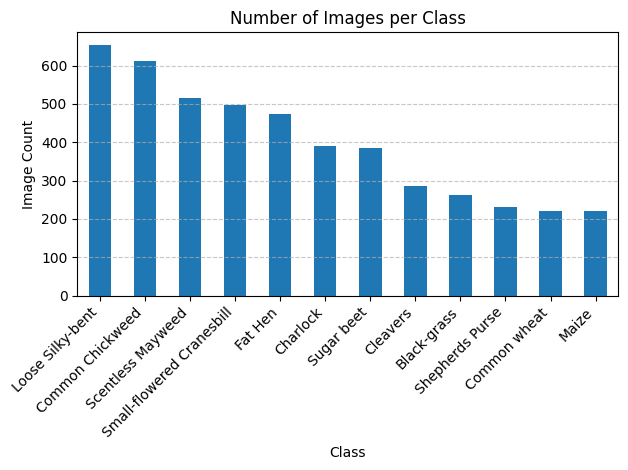

In [ ]:
# Define the path to the training data directory
train_dir = "train"

# Count the number of images per class
class_counts = {
    cls: len(os.listdir(os.path.join(train_dir, cls)))
    for cls in os.listdir(train_dir)
    if os.path.isdir(os.path.join(train_dir, cls))
}

# Convert the class distribution to a DataFrame and sort
df_counts = pd.DataFrame.from_dict(class_counts, orient='index', columns=['Image Count'])
df_counts = df_counts.sort_values(by='Image Count', ascending=False)

# Plot the class distribution
plt.figure(figsize=(10, 6))
df_counts.plot(kind='bar', legend=False)
plt.title("Number of Images per Class")
plt.ylabel("Image Count")
plt.xlabel("Class")
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

The image files are organized in a directory structure where the main folder (`train`) contains one subfolder for each plant species (`class`). Each of these subfolders (e.g., `Maize, Sugar beet`, `Loose Silky-bent`) holds multiple image files that represent that specific class.

To access the images, the code begins by defining the path to the training directory using `train_dir = "train"`. It then retrieves the names of all subfolders (i.e., `class names`) using `os.listdir(train_dir)` and filters them to ensure they are directories. For each class folder, it constructs the full path (e.g., `"train/Maize"`) and counts the number of image files within it using `len(os.listdir(...))`.

This process enables iteration over all classes and counting how many image files exist in each class folder. In other words, it lets us determine the number of instances per class by counting the number of image files in each subfolder.

Based on this, a DataFrame is created where the index represents the class name (the name of the subfolder), and the column (`Image Count`) contains the number of image files found in that class. This structured summary provides a clear view of the class distribution and is visualized in a bar plot showing the number of images available for each class.
***
The bar chart "Number of Images per Class" shows the distribution of training samples across all twelve plant species. The results clearly indicate that the dataset is not evenly distributed. The most represented class, `Loose Silky-bent`, contains over 600 images, followed closely by `Common Chickweed` and `Scentless Mayweed`. In contrast, the least represented classes, such as `Common Wheat` and `Maize`, include fewer than 200 samples each.

This insight provides a useful overview of the dataset's composition and confirms that some classes are significantly more frequent than others, which is important to keep in mind when interpreting model performance.

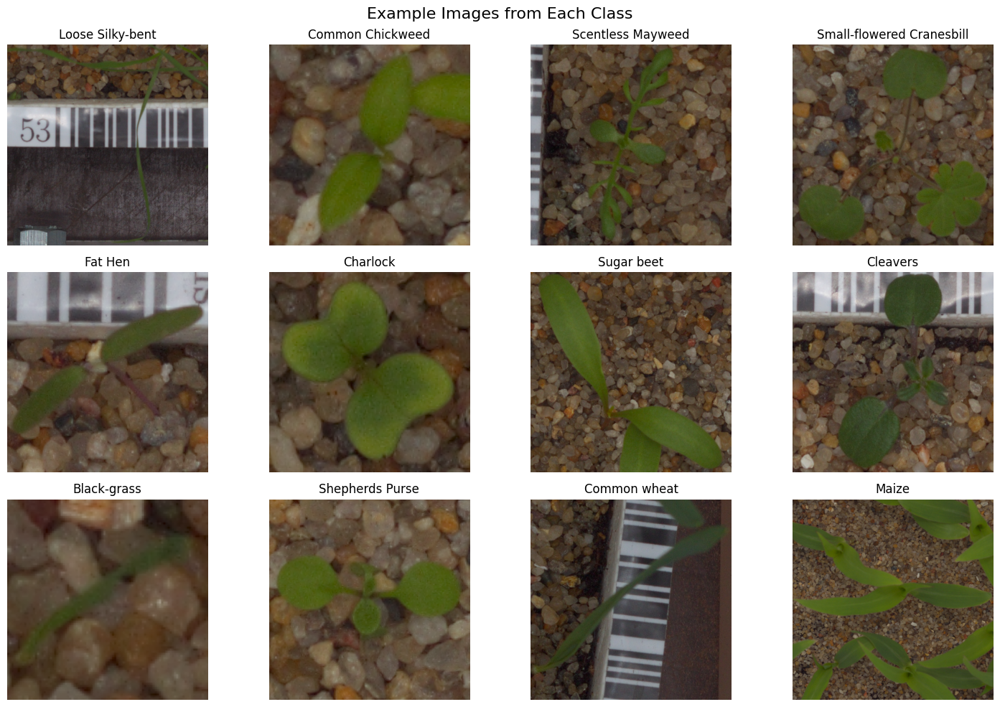

In [ ]:
# Show one random image from each class
fig, axs = plt.subplots(3, 4, figsize=(15, 10))
classes = list(df_counts.index)

for i, ax in enumerate(axs.flat):
    if i < len(classes):
        cls = classes[i]
        image_file = random.choice(os.listdir(os.path.join(train_dir, cls)))
        image_path = os.path.join(train_dir, cls, image_file)
        image = mpimg.imread(image_path)

        ax.imshow(image)
        ax.set_title(cls)
        ax.axis('off')
    else:
        ax.axis('off')

plt.suptitle("Example Images from Each Class", fontsize=16)
plt.tight_layout()
plt.show()


One representative image from each class is visualized to provide a quick visual overview of the dataset. To achieve this, we iterate over the class names retrieved from the previously generated DataFrame (`df_counts.index`). For each class, the code randomly selects one image file from the corresponding folder, constructs the full file path, and loads the image for display.
***
This process is done within a predefined grid of subplots, ensuring that all selected samples are shown together in a consistent layout. The resulting figure gives a side-by-side comparison of example images across all classes, helping to assess visual differences, clarity, and potential noise in the data

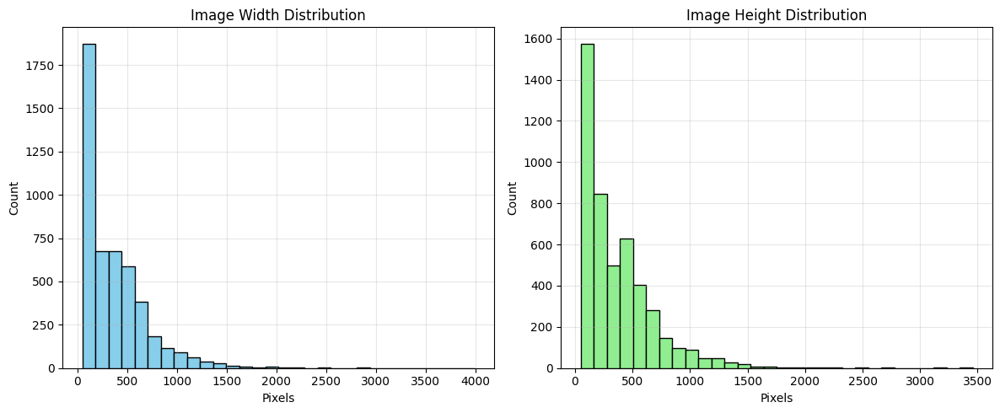

In [ ]:
# Collect image shapes (width, height) per class
image_shapes = []

for cls in os.listdir(train_dir):
    cls_dir = os.path.join(train_dir, cls)
    if not os.path.isdir(cls_dir):
        continue
    for img_name in os.listdir(cls_dir):
        try:
            img_path = os.path.join(cls_dir, img_name)
            img = Image.open(img_path)
            image_shapes.append(img.size)  # (width, height)
        except:
            print(f"Could not open image: {img_path}")

# Create a DataFrame with width and height
df_shapes = pd.DataFrame(image_shapes, columns=['width', 'height'])

# Plot width and height distributions
fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].hist(df_shapes['width'], bins=30, color='skyblue', edgecolor='black')
axs[0].set_title('Image Width Distribution')
axs[1].hist(df_shapes['height'], bins=30, color='lightgreen', edgecolor='black')
axs[1].set_title('Image Height Distribution')

for ax in axs:
    ax.set_xlabel('Pixels')
    ax.set_ylabel('Count')
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()


The code begins by initializing an empty list to store the dimensions of all images (`image_shapes = []`). It then iterates over each class folder in the training directory, checking whether the folder contains images. For each image, it opens the file using the PIL library and appends the dimensions (`width`, `height`) to the list.

All collected dimensions are then stored in a DataFrame with two columns: `'width'` and `'height'`. This structured format makes it easy to analyze the distribution of image sizes.

To visualize this information, the code creates two histograms side by side: one for image widths and one for image heights. Each histogram shows the frequency distribution of pixel values across all images.
***
The histograms reveal that the majority of images are relatively small, with both width and height concentrated between 100 and 600 pixels. Although there is some variation, the distribution is heavily skewed toward lower values, indicating that most images are already compact. However, a few outliers with dimensions exceeding 3000 pixels are also present, though these are rare.

This information is particularly important when preparing data for a CNN, which requires consistent input dimensions. Since most images fall within a narrow range, resizing them to a fixed shape (e.g., 96×96 or 224×224) is unlikely to introduce significant distortion. At the same time, identifying and potentially rescaling unusually large images can help avoid irregularities during training.




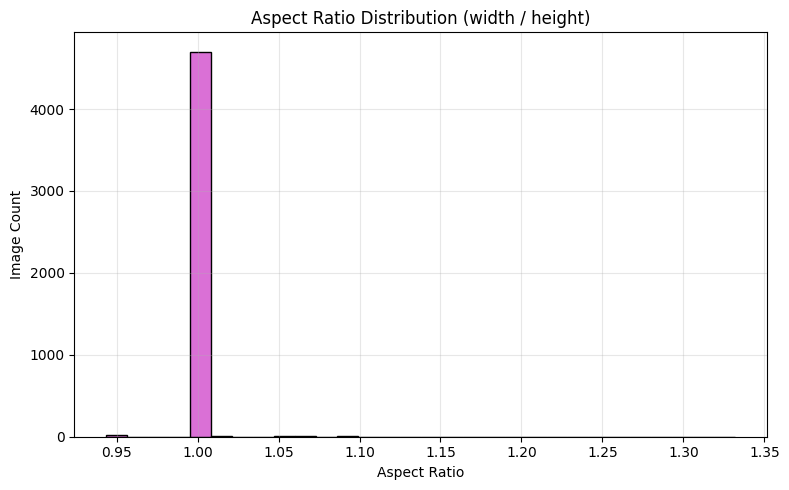

In [ ]:
# Add aspect ratio column
df_shapes['aspect_ratio'] = df_shapes['width'] / df_shapes['height']

# Plot histogram of aspect ratios
plt.figure(figsize=(8, 5))
plt.hist(df_shapes['aspect_ratio'], bins=30, color='orchid', edgecolor='black')
plt.title("Aspect Ratio Distribution (width / height)")
plt.xlabel("Aspect Ratio")
plt.ylabel("Image Count")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


The code first computes the aspect ratio for each image by dividing its width by its height and adds this value as a new column (`'aspect_ratio'`) to the existing DataFrame containing image dimensions. This transformation provides a numerical measure of each image's shape. Then, it plots a histogram to visualize the distribution of these aspect ratios across the entire dataset, using 30 bins for granularity and a distinct color for clarity.
***
The resulting histogram shows that the vast majority of images have an aspect ratio very close to 1.0 - most images are nearly square. There is minimal variation, and outliers with significantly different width-to-height proportions are rare. This confirms that the dataset is highly consistent in terms of image shape, so standardizing all inputs to a square resolution (e.g., 96×96) during preprocessing it is appropriate and unlikely to distort the image content.

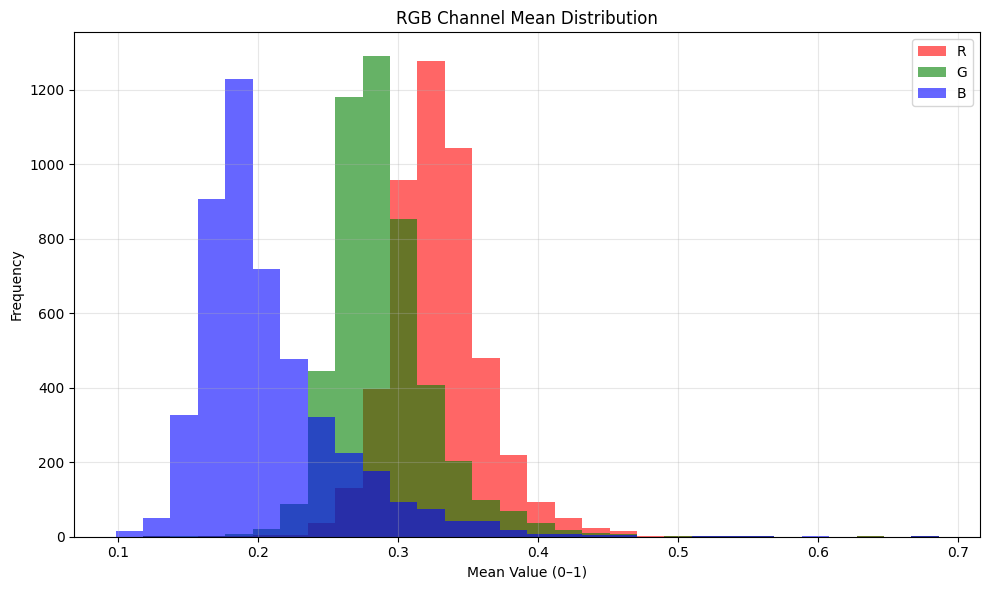

In [ ]:
def compute_rgb_means(image_path):
    try:
        img = Image.open(image_path).convert('RGB')
        img_np = np.array(img) / 255.0
        r_mean = np.mean(img_np[:, :, 0])
        g_mean = np.mean(img_np[:, :, 1])
        b_mean = np.mean(img_np[:, :, 2])
        return r_mean, g_mean, b_mean
    except:
        return None

# Compute means for a sample of images (or all if feasible)
rgb_means = []

for cls in os.listdir(train_dir):
    cls_dir = os.path.join(train_dir, cls)
    for img_name in os.listdir(cls_dir):
        img_path = os.path.join(cls_dir, img_name)
        means = compute_rgb_means(img_path)
        if means:
            rgb_means.append(means)

# Convert to DataFrame
df_rgb = pd.DataFrame(rgb_means, columns=['R', 'G', 'B'])

# Plot histograms of R, G, B with matching colors
df_rgb.plot(kind='hist', bins=30, alpha=0.6, figsize=(10, 6),
            title='RGB Channel Mean Distribution',
            color=['red', 'green', 'blue'])
plt.xlabel("Mean Value (0–1)")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

The code defines a function `compute_rgb_means`, which opens an image, converts it to RGB format, normalizes the pixel values to a [0, 1] range, and calculates the mean intensity for each of the red, green, and blue channels. In the main loop, this function is applied to all images in the training dataset, and the resulting RGB means are collected into a list. This list is converted into a DataFrame with three columns: `'R'`, `'G'`, and `'B'`, representing the average color intensities across the dataset.

To analyze the color distribution, the code then plots histograms of these RGB channel means using 30 bins - the histogram remains clear, smooth, and informative. Each color channel is visualized in its corresponding color (red, green, and blue), allowing for direct comparison.
***
The resulting plot reveals that green channel intensities tend to be slightly higher on average than red, while blue has the lowest mean values overall. This suggests that the dataset is relatively natural in appearance, likely dominated by plant life and backgrounds with green components. The histogram also shows some overlap between red and green distributions, but blue is clearly shifted left, indicating darker blue content. This analysis helps confirm the dataset's visual characteristics and can guide normalization steps prior to training.

In [ ]:
grayscale_images = []

for cls in os.listdir(train_dir):
    cls_dir = os.path.join(train_dir, cls)
    for img_name in os.listdir(cls_dir):
        img_path = os.path.join(cls_dir, img_name)
        try:
            img = Image.open(img_path)
            if img.mode == 'L':
                grayscale_images.append(img_path)
            elif img.mode == 'RGB':
                img_array = np.array(img)
                if np.all(img_array[..., 0] == img_array[..., 1]) and np.all(img_array[..., 1] == img_array[..., 2]):
                    grayscale_images.append(img_path)
            else:
                grayscale_images.append(img_path)  # in other modes (RGBA, etc.)
        except:
            grayscale_images.append(img_path)  # unreadable or corrupted

print(f"Found {len(grayscale_images)} grayscale or unreadable images.")
for path in grayscale_images:
    print(path)


Found 24 grayscale or unreadable images.
train/Loose Silky-bent/02b15993e.png
train/Loose Silky-bent/875ef92d7.png
train/Loose Silky-bent/e513efb9a.png
train/Loose Silky-bent/d1653b4c3.png
train/Loose Silky-bent/b81690ccf.png
train/Loose Silky-bent/4a0df8be4.png
train/Loose Silky-bent/3d9f8222d.png
train/Loose Silky-bent/f5602e151.png
train/Loose Silky-bent/ae1c97a42.png
train/Loose Silky-bent/ab47c78db.png
train/Loose Silky-bent/780b7ab63.png
train/Loose Silky-bent/d31724b7f.png
train/Loose Silky-bent/881498f15.png
train/Loose Silky-bent/180a7bc07.png
train/Loose Silky-bent/5cb45767e.png
train/Loose Silky-bent/7324d3cc4.png
train/Loose Silky-bent/df615189b.png
train/Loose Silky-bent/9cf880bda.png
train/Loose Silky-bent/7a8370ede.png
train/Loose Silky-bent/0cf9eb4ab.png
train/Loose Silky-bent/3fd2b83fc.png
train/Black-grass/a8ab1ff26.png
train/Black-grass/ae8f69724.png
train/Black-grass/77629b9e3.png


This step identifies grayscale or unreadable images across all training folders. Each image is opened and its mode is checked—if it's in mode `'L'`, it's explicitly grayscale. Images in `'RGB'` mode are further analyzed: if all three color channels (red, green, and blue) are identical across all pixels, the image is also treated as grayscale. Any image in a different mode (like `'RGBA'`) or one that cannot be opened at all is marked as unreadable.
***
As a result, a total of 24 grayscale or problematic images were found, mostly within the `'Loose Silky-bent'` class, with a few cases in `'Black-grass'`. Detecting these cases is crucial for ensuring input consistency. Removing or converting such files can help avoid unexpected behavior during preprocessing or model evaluation.

## Preprocessing

# Approach 1 - Keep grayscale or unreadable images, but convert them to RGB format

In [ ]:
# Parameters
IMG_SIZE = 96
DATASET_DIR = "train"

# Containers
images = []
labels = []
class_names = sorted([d for d in os.listdir(DATASET_DIR) if os.path.isdir(os.path.join(DATASET_DIR, d))])

# Iterate through class folders and load images
for class_name in class_names:
    class_dir = os.path.join(DATASET_DIR, class_name)
    for filename in os.listdir(class_dir):
        img_path = os.path.join(class_dir, filename)
        try:
            # Open image, convert to RGB and resize
            img = Image.open(img_path).convert("RGB")
            img = img.resize((IMG_SIZE, IMG_SIZE))
            img_array = img_to_array(img) / 255.0  # Normalize to 0–1
            images.append(img_array)
            labels.append(class_name)
        except Exception as e:
            print(f"Skipping file {img_path}: {e}")

# Convert to numpy arrays
X = np.array(images)
y = np.array(labels)

print("Images loaded and resized")
print(f"Image shape: {X.shape}")
print(f"Unique classes: {len(np.unique(y))}")


Images loaded and resized
Image shape: (4750, 96, 96, 3)
Unique classes: 12


As the first preprocessing strategy, we decided to retain grayscale and partially unreadable images by converting them to RGB format. This allowed us to preserve as much training data as possible without sacrificing input consistency required by convolutional neural networks. We began by setting the input size to 96×96 pixels and specifying the training directory path.

The choice of 96×96 was based on three main considerations. First, smaller resolutions help reduce noise and unnecessary image detail, which may be irrelevant to plant classification. Second, this dimension balances computational efficiency and information preservation—allowing for faster training while keeping enough spatial structure for effective learning. Third, the square format aligns well with the natural shape of many CNN architectures, avoiding the need for additional padding or warping.

Next, we iterated through all class folders and attempted to load each image. Every image, regardless of its original mode, was explicitly converted to RGB, resized to the target resolution, and normalized to the [0,1] range. The normalization step is crucial—it ensures that all input pixel values fall within a uniform dynamic range, which stabilizes gradient descent, speeds up convergence, and reduces the risk of numerical instability during training. The processed image was then converted into a NumPy array and stored along with its corresponding class label.
***
This method ensured that images with grayscale channels were still usable, provided they could be safely converted to RGB. In doing so, we avoided losing valuable data while maintaining a unified input structure suitable for standard CNNs. We emphasize that this conversion step was critical, as leaving grayscale images in their original single-channel format would result in shape mismatches and runtime errors during training. Moreover, mixing one- and three-channel inputs could lead the model to learn spurious patterns based on channel structure rather than actual image content. Converting all images to RGB eliminated this issue and allowed us to train the model on a coherent and well-structured dataset.

In [ ]:
# Create label-to-index mapping
label_to_index = {label: idx for idx, label in enumerate(np.unique(y))}
index_to_label = {idx: label for label, idx in label_to_index.items()}

# Encode string labels to integer indices
y_encoded = np.array([label_to_index[label] for label in y])

# One-hot encode labels
y_categorical = to_categorical(y_encoded, num_classes=len(label_to_index))

# Split 1: train and test1 (70% / 30%)
X_train, X_test1, y_train, y_test1 = train_test_split(
    X, y_categorical, test_size=0.30, stratify=y_categorical, random_state=42
)

# Split 2: test1 into val and test (50%/50% of 30% => 15%/15%)
X_val, X_test, y_val, y_test = train_test_split(
    X_test1, y_test1, test_size=0.50, stratify=y_test1, random_state=42
)


print("Labels encoded and data split finished.")
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_val shape:   {X_val.shape}")
print(f"y_val shape:   {y_val.shape}")
print(f"X_test shape:  {X_test.shape}")
print(f"y_test shape:  {y_test.shape}")


Labels encoded and data split finished.
X_train shape: (3325, 96, 96, 3)
y_train shape: (3325, 12)
X_val shape:   (712, 96, 96, 3)
y_val shape:   (712, 12)
X_test shape:  (713, 96, 96, 3)
y_test shape:  (713, 12)


To prepare the dataset for training, we first mapped each class label to a unique integer index and stored the inverse mapping for reference. We then encoded all string labels into integer format and subsequently applied one-hot encoding to produce a binary matrix representation compatible with categorical cross-entropy loss used in multi-class classification.

After encoding the labels, we split the dataset into three subsets: training (70%), validation (15%), and test (15%) while ensuring balanced class distributions through stratified sampling. This allowed us to maintain label balance across all splits while reserving a portion of the data for model tuning and final evaluation.

In [ ]:
# --- Settings for green segmentation ---
lower_green = (25, 40, 50)  # Lower HSV bound for green
upper_green = (75, 255, 255)  # Upper HSV bound for green
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11, 11))  # Elliptical kernel for morphology

# --- Preprocessing function ---
def preprocess_images(X):
    preprocessed = []
    for img in X:
        # 1. Convert image from float [0,1] to uint8 [0,255]
        img_uint8 = (img * 255).astype(np.uint8)

        # 2. Resize image
        resize_img = img_uint8

        # 3. Apply Gaussian blur to reduce noise
        Gblur_img = cv2.GaussianBlur(resize_img, (3, 3), 0)

        # 4. Convert image from RGB to HSV color space
        hsv_img = cv2.cvtColor(Gblur_img, cv2.COLOR_RGB2HSV)

        # 5. Segment green regions using HSV range
        mask = cv2.inRange(hsv_img, lower_green, upper_green)

        # 6. Apply morphological closing to remove noise and fill gaps
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

        # 7. Create boolean mask
        bMask = mask > 0

        # 8. Apply mask to original image to keep only green regions
        clearImg = np.zeros_like(resize_img, np.uint8)
        clearImg[bMask] = resize_img[bMask]

        # 9. Convert cleaned image back to float32 [0,1]
        clearImg_float = clearImg.astype(np.float32) / 255.0

        preprocessed.append(clearImg_float)

    return np.asarray(preprocessed)

# --- Apply preprocessing to dataset splits ---
X_train_cleaned = preprocess_images(X_train)
X_val_cleaned = preprocess_images(X_val)
X_test_cleaned = preprocess_images(X_test)


We applied a custom segmentation and noise removal pipeline designed to isolate the green regions of interest seedlings—from the background. This was motivated by the observation that plant structures in our dataset predominantly exhibit green coloration, while the backgrounds (e.g., soil, rulers, pots) introduce irrelevant noise that could mislead the CNN during training. By explicitly filtering out non-green content, we aimed to emphasize biologically meaningful regions and reduce overfitting to background textures.

To implement this, we first defined a lower and upper bound in the HSV (Hue, Saturation, Value) color space to target green shades. Specifically, we selected a hue range of 25 to 75, which corresponds to green tones, and used relatively wide saturation and value intervals ([40–255] and [50–255]) to accommodate natural variability in lighting and plant pigmentation. The choice of HSV space—rather than RGB—was deliberate: in HSV, color information (hue) is decoupled from brightness (value), which enables more robust segmentation under different lighting conditions. In contrast, filtering in RGB would be more sensitive to shadows or highlights and likely to underperform on underexposed or overexposed samples.

Once the thresholds were defined, we applied the preprocessing function to each image. We first converted floating-point pixel values in [0, 1] back to 8-bit integers in [0, 255], as required by OpenCV's color conversion and morphological functions. Then, we applied a 3×3 Gaussian blur to each image. This operation was crucial to reduce high-frequency noise and small-scale pixel-level inconsistencies that could generate false positives during segmentation. Smoothing the image helped ensure that detected green regions represented coherent plant structures rather than random color fluctuations.

Next, we converted the image from RGB to HSV color space and used cv2.inRange to create a binary mask of pixels falling within our specified green range. To refine the mask and eliminate noise, we applied morphological closing using an elliptical structuring element of size 11×11. This shape was chosen because plant contours tend to be rounded; an elliptical kernel preserves organic shapes better than a rectangular one and closes small gaps without significantly deforming the target object.

Following this, we constructed a boolean mask and used it to extract only the green regions from the original image. All other pixels were set to zero, effectively removing background and non-plant regions. The cleaned image was then normalized back to [0, 1] and appended to a new dataset split. This process was applied separately to training, validation, and test sets to maintain consistent preprocessing throughout the pipeline.

This targeted preprocessing step served two important purposes. First, it reduced the dimensionality of visual information by removing irrelevant or redundant content, which helps the CNN learn more discriminative features. Second, it increased robustness by making the model less sensitive to background artifacts, lighting variation, or occlusions. Segmenting green content directly reflects our domain knowledge about the nature of the data—where color is a meaningful class-discriminative signal—and aligns preprocessing with biological priors. We hypothesize that this transformation would lead to faster convergence and improved generalization, particularly in cases where seedlings share similar shapes but differ subtly in tone or texture.

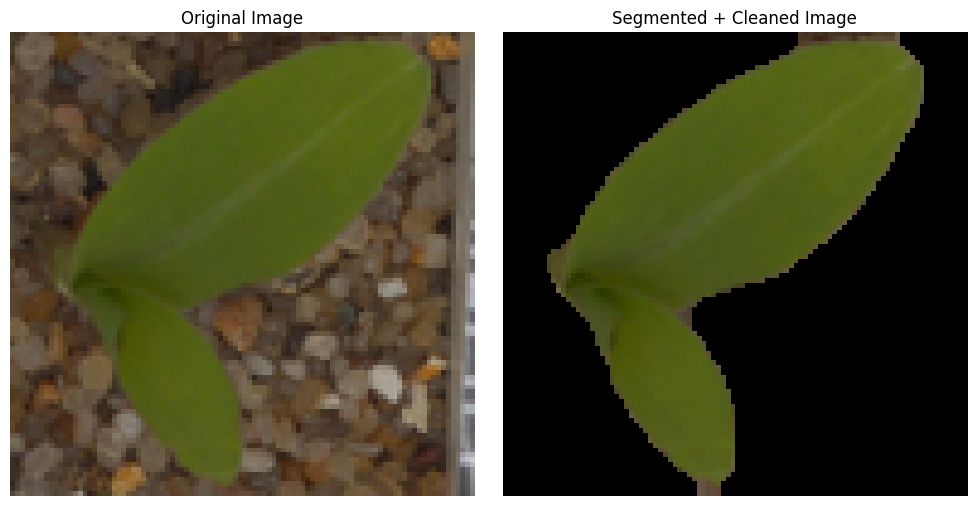

In [ ]:
# --- Display a random sample image (original vs. processed) ---

# Random index from training set
i = np.random.randint(0, len(X_train))

# Original and preprocessed images
original = X_train[i]
processed = X_train_cleaned[i]

# Create a side-by-side plot
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Show original image
axs[0].imshow(original)
axs[0].set_title("Original Image")

# Show segmented and cleaned image
axs[1].imshow(processed)
axs[1].set_title("Segmented + Cleaned Image")

# Turn off axes for both subplots
for ax in axs:
    ax.axis("off")

# Adjust layout and display the plot
plt.tight_layout()
plt.show()


To visually assess the effect of our green segmentation pipeline, we selected a random image from the training set and displayed it alongside its processed version (where the original image is shown on the left and the cleaned image—resulting from our HSV-based segmentation—is shown on the right)

This comparison confirms that the preprocessing step effectively isolates green regions (e.g., leaves) while removing most of the background, such as soil, grid lines, or lighting artifacts. As illustrated, the segmented image retains only the plant structures, enhancing the contrast between foreground and irrelevant background. This not only improves visual clarity but also helps our model to focus on learning specific features of the plants during training.


In [ ]:
print(f"Cleaned training shape: {X_train_cleaned.shape}")
print(f"Cleaned validation shape: {X_val_cleaned.shape}")
print(f"Cleaned test shape: {X_test_cleaned.shape}")

Cleaned training shape: (3325, 96, 96, 3)
Cleaned validation shape: (712, 96, 96, 3)
Cleaned test shape: (713, 96, 96, 3)


Full cleaning:

- Cropped to retain only the seedling,
- Morphologically cleaned of artifacts,
- Sharpened to highlight structural features,
- Normalized to the range [0, 1].

## Model Building

In [ ]:
ins = X_train_cleaned.shape[1:]

# 1. Overfitted model
def build_overfitted_model(input_shape=(ins[0], ins[1], ins[2]), num_classes=12):
    model = Sequential([
        Input(shape=input_shape),
        Conv2D(32, (3, 3), activation='relu', padding='same'),
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        Flatten(),
        Dense(128, activation='relu'),
        Dense(num_classes, activation='softmax')
    ])
    return model


# 2. Best Model
def build_best_model(input_shape=(ins[0], ins[1], ins[2]), num_classes=12):
    model = Sequential()

    # 1st Convolutional Block
    model.add(Conv2D(32, (3, 3), input_shape=input_shape, activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2))

    # 2nd Convolutional Block
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2))

    # 3rd Convolutional Block
    model.add(Conv2D(64, (3, 3), activation='relu', padding='valid'))  # No padding
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2))

    # Flatten before Dense layers
    model.add(Flatten())

    # Fully Connected Layers
    model.add(BatchNormalization())
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(0.2))

    model.add(BatchNormalization())
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.2))

    # Output Layer
    model.add(Dense(num_classes, activation='softmax'))

    return model

To explore the impact of architecture and regularization on classification performance, we designed two Convolutional Neural Network (CNN) models of varying complexity. The first model served as an overfitted baseline, intentionally constructed without any regularization, normalization, or pooling mechanisms. It consisted of two convolutional layers (Conv2D) with 32 and 64 filters respectively, both using a 3×3 kernel size and 'same' padding to preserve input dimensions. These layers were followed by a Flatten layer and two fully connected Dense layers (128 units and output), with ReLU - speeds up training by introducing non-linearity - and softmax activations - enables probabilistic output for multi-class classification. The purpose of this minimalistic architecture was to demonstrate how easily a CNN can overfit when trained on a dataset without any constraints on capacity or generalization. Since it lacks dropout or normalization, this model rapidly memorizes training data but fails to generalize effectively.

To address these limitations, we developed a deeper and more robust architecture as our best-performing model. This CNN comprised three convolutional blocks, each including a Conv2D layer followed by BatchNormalization and MaxPooling. The first block used 32 filters with 'same' padding, while the second and third blocks each used 64 filters. The third convolutional layer used 'valid' padding, intentionally reducing spatial resolution and introducing controlled downsampling. BatchNormalization was employed after each convolutional layer to stabilize the learning process by reducing internal covariate shift. MaxPooling with a 2×2 kernel and stride of 2 was used to progressively reduce spatial dimensions and encourage hierarchical feature extraction.

Following the convolutional layers, the output was flattened and passed through two fully connected Dense layers with 512 and 128 units respectively, both activated by ReLU. Dropout layers with a 20% rate were applied after each Dense layer to combat overfitting by randomly deactivating a fraction of neurons during training. BatchNormalization was again used in the dense block to stabilize the output distribution before the final classification layer. The final Dense layer had 12 units corresponding to the number of classes and used a softmax activation to produce a probability distribution over the target labels.

This layered structure enabled the model to extract increasingly abstract features while maintaining control over overfitting and ensuring stable optimization. In contrast to the baseline model, this architecture integrates established best practices—such as dropout, batch normalization, and hierarchical feature reduction—thereby striking a balance between model complexity and generalization. The use of progressive downsampling, normalization at each stage, and dropout in the dense layers collectively enhanced robustness and training stability. This model served as our primary benchmark for evaluating the effectiveness of different preprocessing strategies described in earlier sections.

## Running models with no callbacks to see the performance

In [ ]:
model = build_overfitted_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)

history_AP1_overfitted = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8
)

Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - accuracy: 0.2772 - loss: 2.1821 - precision: 0.5220 - recall: 0.0605 - val_accuracy: 0.4986 - val_loss: 1.4717 - val_precision: 0.7178 - val_recall: 0.2893
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - accuracy: 0.6628 - loss: 1.0076 - precision: 0.7886 - recall: 0.5103 - val_accuracy: 0.5449 - val_loss: 1.3776 - val_precision: 0.6903 - val_recall: 0.4382
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.9744 - loss: 0.1217 - precision: 0.9789 - recall: 0.9624 - val_accuracy: 0.5421 - val_loss: 1.9015 - val_precision: 0.5661 - val_recall: 0.4930
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - accuracy: 0.9998 - loss: 0.0087 - precision: 0.9998 - recall: 0.9998 - val_accuracy: 0.5183 - val_loss: 2.3901 - val_precision: 0.5435 - val_recall: 0.4916
Epoch 5/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - accuracy: 0.9994 - loss: 0.0030 - precision: 0.9994 - recall: 0.9993 - val_accuracy: 0.5520 - va

We compile and train the overfitted baseline model defined earlier. The model is first constructed using the build_overfitted_model() function and then compile the model using the Adam optimizer, which is well-suited for image classification tasks due to its adaptive learning rate behavior. The learning rate is set to 0.001, with standard beta parameters (beta_1=0.9, beta_2=0.999) and a small epsilon value (1e-08) for numerical stability. The loss function used is categorical_crossentropy, which is appropriate for multi-class classification problems where the target labels are one-hot encoded.

To monitor model performance, we specify multiple evaluation metrics: accuracy, precision and recall to capture sensitivity to true positive detection. These metrics are particularly important for our application, given the class imbalance observed in the dataset.

The model is then trained using the .fit() method. We pass in the preprocessed training set (X_train_cleaned, y_train) and provide a validation set (X_val_cleaned, y_val) for monitoring generalization across epochs. The training runs for 30 epochs with a relatively small batch_size of 8, which promotes high granularity in the weight updates and facilitates early overfitting — useful for baseline comparison. The training history is stored in the history_AP1_overfitted object for later inspection and visualization.

In [ ]:
results_AP1_overfitted = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.4799 - loss: 3.9824 - precision: 0.4868 - recall: 0.4567


After training the model, we evaluated its performance on the held-out test set. It computes the final loss and selected metrics on data that was not seen during either training or validation. The output is stored in the variable results_AP1_overfitted, which contains the final numerical values summarizing how well the model generalizes beyond the training and validation phases.

Compared to the metrics tracked during training (model.fit(...)), which provide values for each epoch on both the training and validation sets, the results from model.evaluate(...) are computed only once and reflect the model’s performance on completely unseen examples. While the training history helps identify trends and potential overfitting, the test evaluation offers an objective and final measure of generalization.

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step
Accuracy:  0.45722299814224243
Precision:  0.4692653715610504
Recall:  0.43899017572402954


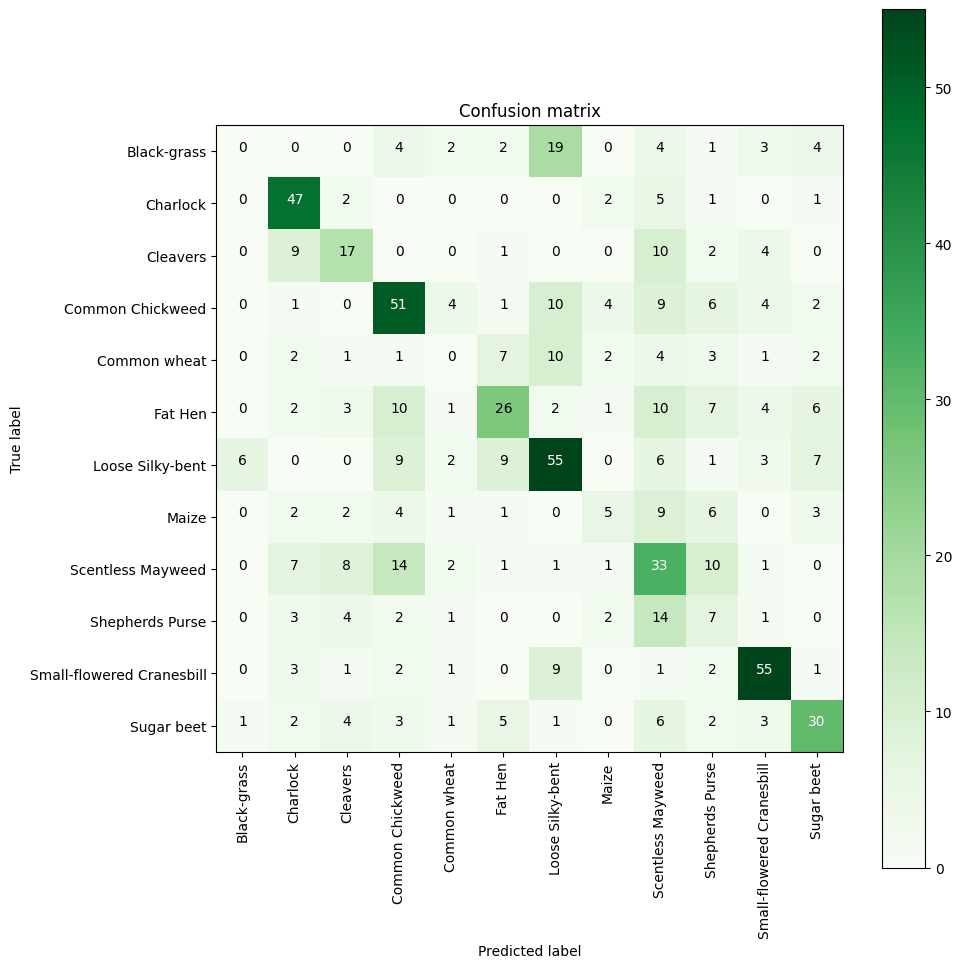

In [ ]:
# --- Function to plot the confusion matrix ---
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Greens):
    fig = plt.figure(figsize=(10, 10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)  # Display the matrix as an image
    plt.title(title)
    plt.colorbar()  # Show color scale
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)  # Set x-axis labels
    plt.yticks(tick_marks, classes)               # Set y-axis labels

    if normalize:
        # Normalize values to percentages
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    # Add values inside the cells
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, f'{cm[i, j]}',
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    # Layout and labels
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Get predicted class indices
trueY = np.argmax(y_test, axis=1)         # Get true class indices

# --- Generate confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- Class names (based on your index_to_label dictionary) ---
categ = list(index_to_label.values())   # Convert dict to list of class names

# --- Plot the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Print evaluation metrics ---
print("Accuracy: ", results_AP1_overfitted[1])
print("Precision: ", results_AP1_overfitted[2])
print("Recall: ", results_AP1_overfitted[3])


This cell evaluates the model by generating a confusion matrix that visualizes prediction performance across all classes. It defines a custom plot_confusion_matrix(...) function to display class-wise prediction results as a heatmap, with optional normalization and annotation for clarity. Model predictions and true labels are compared using confusion_matrix(...), and class names are retrieved from index_to_label for meaningful axis labels. Finally, the matrix is plotted, and key metrics—accuracy, precision, and recall—are printed to summarize the model’s overall effectiveness and identify class-level misclassifications.

In [ ]:
model = build_best_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)


history_AP1_better = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8,
    shuffle = True
    )


Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - accuracy: 0.3110 - loss: 2.3196 - precision: 0.4283 - recall: 0.1958 - val_accuracy: 0.1110 - val_loss: 8.6761 - val_precision: 0.1114 - val_recall: 0.1110
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - accuracy: 0.5487 - loss: 1.3144 - precision: 0.6565 - recall: 0.4399 - val_accuracy: 0.5463 - val_loss: 1.3862 - val_precision: 0.6333 - val_recall: 0.4972
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.6095 - loss: 1.1380 - precision: 0.7253 - recall: 0.5074 - val_accuracy: 0.5365 - val_loss: 1.4637 - val_precision: 0.6118 - val_recall: 0.4803
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.6778 - loss: 0.9523 - precision: 0.7495 - recall: 0.5804 - val_accuracy: 0.6503 - val_loss: 1.1720 - val_precision: 0.6917 - val_recall: 0.5955
Epoch 5/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.7349 - loss: 0.8041 - precision: 0.7967 - recall: 0.6637 - val_accuracy: 0.7008 - val_loss:

After training the overfitted baseline model, we move on to a more refined architecture by calling build_best_model().

The training configuration remains mostly unchanged in terms of epochs (30) and batch size (8), but now includes shuffle=True, which ensures that training samples are randomly reordered before each epoch. This prevents the model from memorizing data order and improves generalization.

In [ ]:
results_AP1_better = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.8247 - loss: 0.7927 - precision: 0.8363 - recall: 0.8239


the best-performing model yielded significantly better test metrics comparing to the overfitted: 82.47% accuracy, a much lower loss of 0.79, and strong precision and recall scores (0.84 and 0.82, respectively). These improvements are attributable to architectural enhancements like deeper convolutional layers, regularization via dropout and batch normalization, and better data handling (e.g., input shuffling during training)

23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step
Accuracy:  0.8246844410896301
Precision:  0.8409742116928101
Recall:  0.8232818841934204


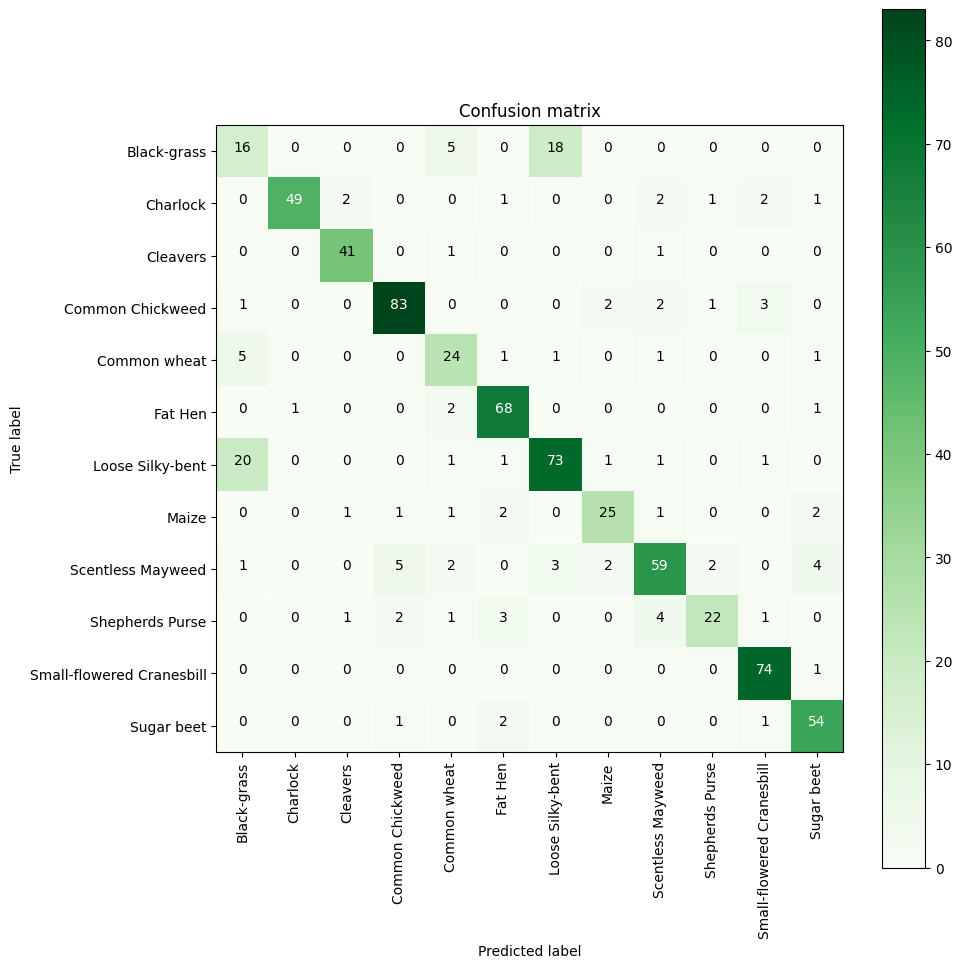

In [ ]:
# --- Function to plot the confusion matrix ---
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Greens):
    fig = plt.figure(figsize=(10, 10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)  # Display matrix as image
    plt.title(title)
    plt.colorbar()  # Add color scale
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)  # X-axis class names
    plt.yticks(tick_marks, classes)               # Y-axis class names

    # Normalize values if requested
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    # Add numerical values to each cell
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, f'{cm[i, j]}',
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    # Final formatting
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)               # Get raw predicted probabilities
predYClasses = np.argmax(predY, axis=1)             # Convert to predicted class indices
trueY = np.argmax(y_test, axis=1)                   # Extract true class indices from one-hot labels

# --- Compute the confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- Class labels (from your index_to_label dictionary) ---
categ = list(index_to_label.values())  # Convert dictionary to list of class names

# --- Plot the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Print evaluation metrics ---
print("Accuracy: ", results_AP1_better[1])    # Model accuracy
print("Precision: ", results_AP1_better[2])   # Model precision (macro or weighted depending on your setup)
print("Recall: ", results_AP1_better[3])      # Model recall


## Model comparison - approach 1, no callbacks

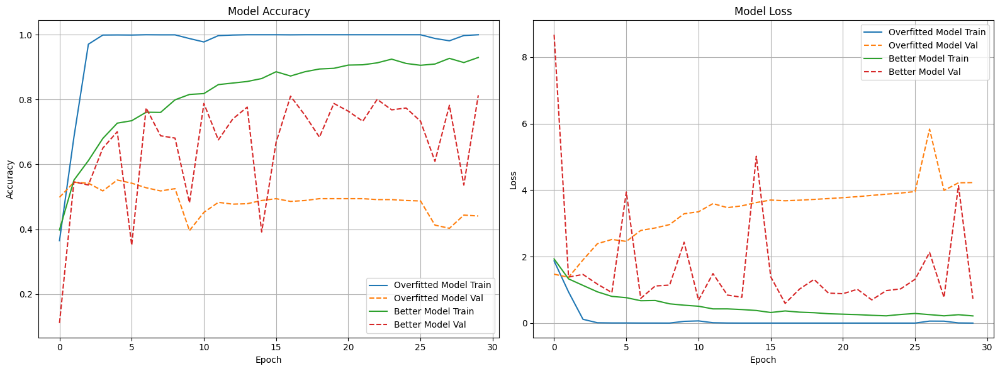

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Overfitted Model": history_AP1_overfitted.history if 'history_AP1_overfitted' in globals() else None,
    "Better Model": history_AP1_better.history if 'history_AP1_better' in globals() else None
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


The accuracy plot clearly shows that the overfitted model (blue line) reaches perfect accuracy on the training set, but its validation accuracy (orange dashed line) stagnates early and fluctuates with poor generalization. This indicates classic overfitting—where the model memorizes training data but fails to generalize.

In contrast, the better model (green and red lines) displays a more gradual and stable increase in both training and validation accuracy. While the training accuracy is slightly lower than the overfitted model, its validation accuracy steadily improves and stabilizes at a much higher level, indicating better generalization.

The loss plot further confirms this. The overfitted model shows a sharp drop in training loss but maintains a high and erratic validation loss, a hallmark of poor generalization. Meanwhile, the regularized model achieves low, smooth, and converging training and validation losses, suggesting more stable and effective learning.

Together, these plots demonstrate that although the overfitted model performs well on the training set, it fails to generalize to unseen data. The best model, with regularization and architectural improvements, avoids overfitting and achieves significantly better generalization, as confirmed by both accuracy and loss metrics.

## Running models with callbacks

To stabilize the model's validation loss we add callback to reduce learning_rate by 10%. We also add Early stopping to prevent overfitting

In [ ]:
model = build_overfitted_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)

callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

history_AP1_overfitted_with_callbacks = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8,
    callbacks = callbacks
)


Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - accuracy: 0.3558 - loss: 2.0136 - precision: 0.5591 - recall: 0.1598 - val_accuracy: 0.6419 - val_loss: 1.0550 - val_precision: 0.7664 - val_recall: 0.5253 - learning_rate: 0.0010
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - accuracy: 0.7832 - loss: 0.6441 - precision: 0.8397 - recall: 0.7213 - val_accuracy: 0.6096 - val_loss: 1.2874 - val_precision: 0.6779 - val_recall: 0.5351 - learning_rate: 0.0010
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - accuracy: 0.9805 - loss: 0.0892 - precision: 0.9853 - recall: 0.9715 - val_accuracy: 0.6376 - val_loss: 1.6393 - val_precision: 0.6627 - val_recall: 0.6180 - learning_rate: 0.0010
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.9987 - loss: 0.0100 - precision: 0.9991 - recall: 0.9987 - val_accuracy: 0.6601 - val_loss: 1.6247 - val_precision: 0.6832 - val_recall: 0.6390 - learning_rate: 5.0000e-04
Epoch 5/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/ste

At this stage, we transition to a training strategy that incorporates callbacks, in contrast to the previous models where none were used. The goal is to introduce mechanisms that improve training stability and prevent overfitting. Specifically, we implement two key callbacks. The first is ReduceLROnPlateau, which monitors the validation loss and automatically reduces the learning rate by a factor of 0.5 if no improvement is observed over 2 consecutive epochs. This allows the optimizer to take smaller, more refined steps once the model starts to plateau, enhancing convergence without manual intervention. The second callback is EarlyStopping, which halts training if the validation loss fails to improve over 6 epochs. Crucially, it includes restore_best_weights=True, ensuring that the model reverts to the parameters that achieved the best validation performance. Together, these callbacks form an adaptive control mechanism that improves generalization, reduces the risk of overfitting, and avoids wasting resources on redundant training.

In [ ]:
results_AP1_overfitted_with_callbacks = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.6629 - loss: 1.0426 - precision: 0.7697 - recall: 0.5607


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step
Accuracy:  0.6465638279914856
Precision:  0.7639999985694885
Recall:  0.5357643961906433


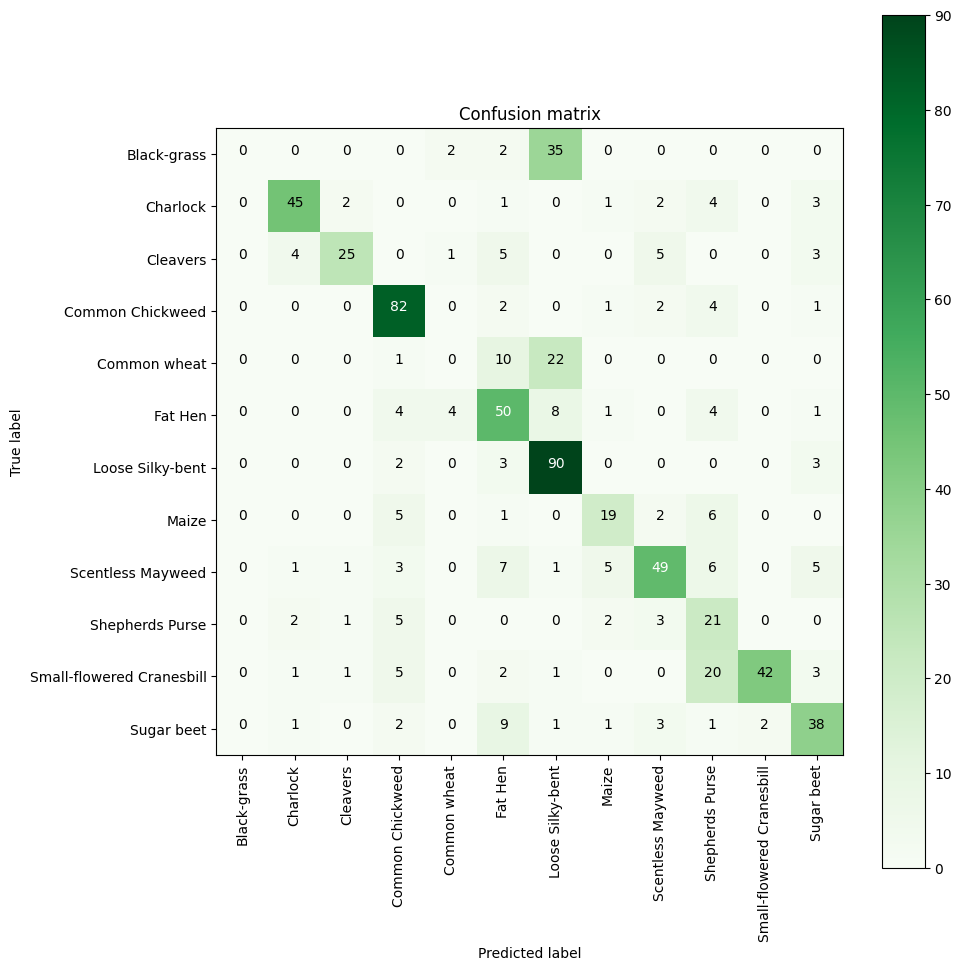

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)               # Get predicted probabilities for each class
predYClasses = np.argmax(predY, axis=1)             # Extract predicted class indices
trueY = np.argmax(y_test, axis=1)                   # Extract true class indices from one-hot encoding

# --- Compute confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (from your index_to_label dictionary) ---
categ = list(index_to_label.values())               # Convert dict to list of class labels

# --- Plot the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Print evaluation metrics ---
print("Accuracy: ", results_AP1_overfitted_with_callbacks[1])     # Accuracy score from model evaluation
print("Precision: ", results_AP1_overfitted_with_callbacks[2])    # Precision (macro or weighted, depending on model.compile)
print("Recall: ", results_AP1_overfitted_with_callbacks[3])       # Recall (macro or weighted)


In [ ]:
model = build_best_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)

callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

history_AP1_better_with_callbacks = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8,
    shuffle = True,
    callbacks = callbacks
    )


Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 16s 19ms/step - accuracy: 0.3289 - loss: 2.2627 - precision: 0.4197 - recall: 0.2052 - val_accuracy: 0.0716 - val_loss: 6.0213 - val_precision: 0.0697 - val_recall: 0.0660 - learning_rate: 0.0010
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - accuracy: 0.5413 - loss: 1.3631 - precision: 0.6480 - recall: 0.4194 - val_accuracy: 0.6208 - val_loss: 1.1367 - val_precision: 0.6963 - val_recall: 0.5604 - learning_rate: 0.0010
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.6506 - loss: 1.0457 - precision: 0.7275 - recall: 0.5403 - val_accuracy: 0.6292 - val_loss: 1.2872 - val_precision: 0.6857 - val_recall: 0.5913 - learning_rate: 0.0010
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.6795 - loss: 0.9794 - precision: 0.7620 - recall: 0.5633 - val_accuracy: 0.6152 - val_loss: 1.3443 - val_precision: 0.6639 - val_recall: 0.5688 - learning_rate: 0.0010
Epoch 5/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accurac

The only modification compared to the previous configuration is the addition of shuffle=True.

In [ ]:
results_AP1_better_with_callbacks = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.8424 - loss: 0.4702 - precision: 0.8564 - recall: 0.8373


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step
Accuracy:  0.8541374206542969
Precision:  0.8701298832893372
Recall:  0.8457223176956177


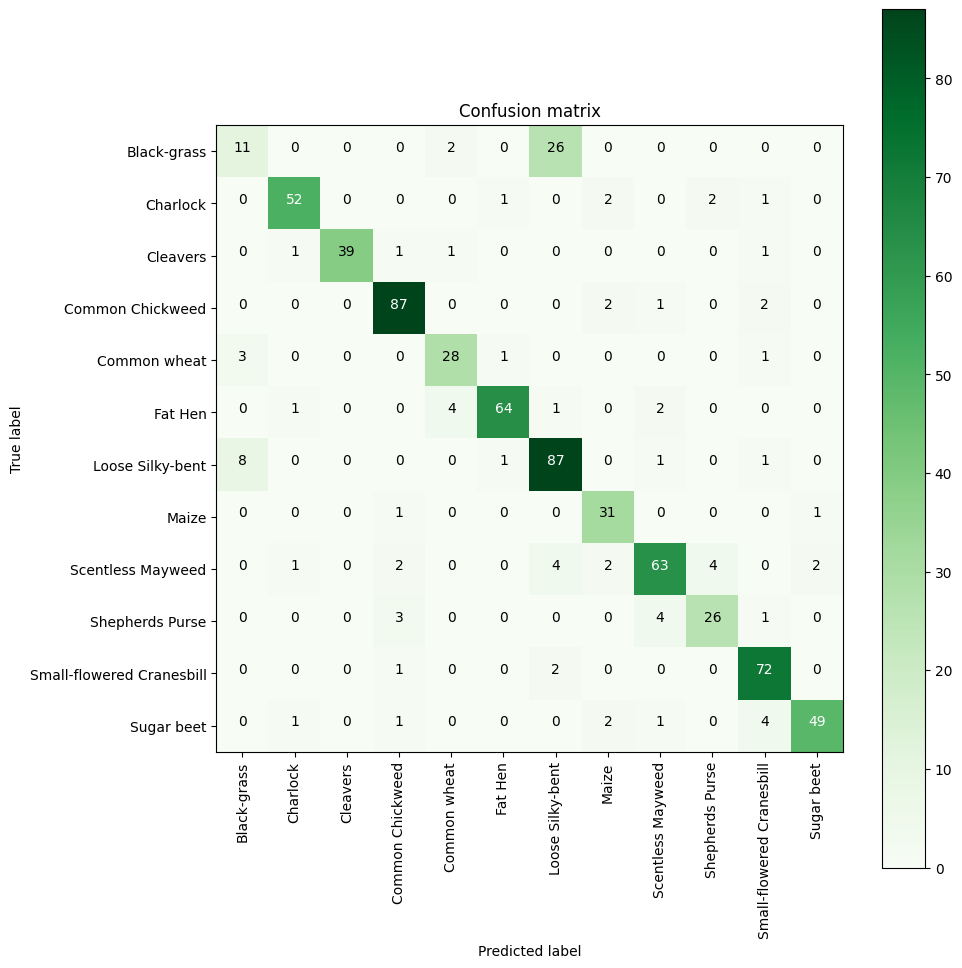

In [ ]:
# --- Model predictions on the test dataset ---
predY = model.predict(X_test_cleaned)               # Predict class probabilities
predYClasses = np.argmax(predY, axis=1)             # Get predicted class indices
trueY = np.argmax(y_test, axis=1)                   # Get true class indices from one-hot labels

# --- Generate confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (from your index_to_label dictionary) ---
categ = list(index_to_label.values())               # Convert dictionary to list of class names

# --- Plot the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Print performance metrics ---
print("Accuracy: ", results_AP1_better_with_callbacks[1])     # Accuracy (from model.evaluate)
print("Precision: ", results_AP1_better_with_callbacks[2])    # Precision (requires metric in model.compile)
print("Recall: ", results_AP1_better_with_callbacks[3])       # Recall (requires metric in model.compile)


## Model comparison - approach 1, with callbacks

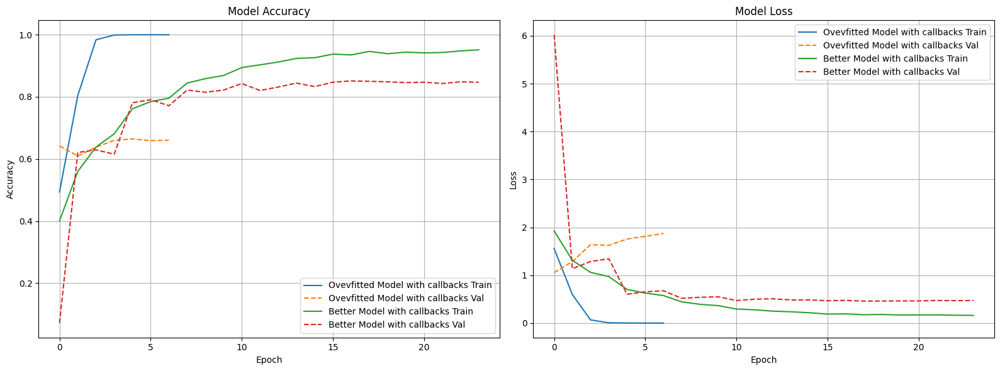

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Ovevfitted Model with callbacks": history_AP1_overfitted_with_callbacks.history if 'history_AP1_overfitted_with_callbacks' in globals() else None,
    "Better Model with callbacks": history_AP1_better_with_callbacks.history if 'history_AP1_better_with_callbacks' in globals() else None
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


The accuracy plot shows that the overfitted model (blue solid line) quickly reaches near-perfect training accuracy but plateaus at a lower validation accuracy (orange dashed line), confirming overfitting. In contrast, the better model (green solid and red dashed lines) improves more gradually and maintains a smaller gap between training and validation performance, indicating better generalization.

The loss plot tells a similar story. The overfitted model’s training loss rapidly drops to nearly zero, while validation loss increases, confirming that the model memorized training data but failed to generalize. In contrast, the better model—with more layers, dropout, batch normalization, and callbacks—achieves consistently low validation loss and avoids divergence between train and validation losses. The use of callbacks contributes to this stability by dynamically reducing the learning rate and halting training early when no further validation improvement is observed.

## Adding data-augmentation and running models with it

In [ ]:
def get_augmented_generator(X_train, y_train, batch_size=8):
    datagen = ImageDataGenerator(
        rotation_range=10,             # slight rotation, plants don't rotate much
        width_shift_range=0.05,        # small horizontal shifts
        height_shift_range=0.05,       # small vertical shifts
        zoom_range=0.05,               # light zoom to simulate camera distance
        horizontal_flip=True,          # mirror symmetry of plants
        fill_mode='nearest'            # filling strategy for transformed pixels
    )

    return datagen.flow(X_train, y_train, batch_size=batch_size, shuffle=True)


We define a function get_augmented_generator() that returns a data generator applying real-time data augmentation to the training set. Its goal is to synthetically expand the training dataset by applying small random transformations, improving the model’s robustness and generalization.

Inside the function, an ImageDataGenerator object is initialized with several augmentation parameters:
- rotation_range=10 allows each image to be randomly rotated by up to ±10 degrees, simulating minor angular variance while respecting the upright orientation of most seedlings
- width_shift_range=0.05 and height_shift_range=0.05 enable horizontal and vertical shifts by up to 5% of the image size, mimicking slight misalignments during image capture
- zoom_range=0.05 allows for slight zooming in or out to simulate camera distance variability
- horizontal_flip=True introduces left-right flipping, which is biologically plausible in this dataset due to symmetry in plant leaf arrangements
-  fill_mode='nearest' specifies how to fill in newly created pixels during transformations—by replicating the nearest pixel value, which minimizes artifacts near image borders.

The function returns a data generator using datagen.flow(...), which yields batches of augmented images and corresponding labels during training. The generator shuffles the dataset at each epoch (shuffle=True) and respects the batch size defined as an argument. This generator is typically passed directly to model.fit(...) in place of the static training set, enabling on-the-fly augmentation and helping prevent overfitting, especially in relatively small datasets.

In [ ]:
# Build the best model
model = build_overfitted_model()

# Compile the model with optimizer, loss function and metrics
model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall()]
)

# Define callbacks for learning rate adjustment and early stopping
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

# Create data generator with real-time augmentation
train_gen = get_augmented_generator(X_train_cleaned, y_train, batch_size=8)

# Train the model using the generator
history_AP1_overfitted_augmented = model.fit(
    train_gen,                                    # training data with augmentation
    validation_data=(X_val_cleaned, y_val),       # static validation set
    epochs=30,
    shuffle=True,
    callbacks=callbacks
)


Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - accuracy: 0.3677 - loss: 2.0051 - precision_5: 0.5370 - recall_5: 0.1478 - val_accuracy: 0.6376 - val_loss: 1.1480 - val_precision_5: 0.7788 - val_recall_5: 0.4747 - learning_rate: 0.0010
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - accuracy: 0.6143 - loss: 1.1276 - precision_5: 0.7317 - recall_5: 0.4644 - val_accuracy: 0.6756 - val_loss: 0.9674 - val_precision_5: 0.8085 - val_recall_5: 0.5098 - learning_rate: 0.0010
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - accuracy: 0.6747 - loss: 0.9869 - precision_5: 0.7643 - recall_5: 0.5462 - val_accuracy: 0.7247 - val_loss: 0.9063 - val_precision_5: 0.7914 - val_recall_5: 0.5969 - learning_rate: 0.0010
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - accuracy: 0.7319 - loss: 0.7919 - precision_5: 0.7961 - recall_5: 0.6539 - val_accuracy: 0.7570 - val_loss: 0.7439 - val_precision_5: 0.8283 - val_recall_5: 0.6980 - learning_rate: 0.0010
Epoch 5/30
416/416 ━━━━━

In this setup, we reuse the same overfitted model architecture but introduce two key changes: real-time data augmentation and generator-based training. We use train_gen, which applies small random transformations (rotation, shifts, zoom, flips) to each batch, improving generalization. To maintain compatibility, batch_size=8 is explicitly set both in the generator and training call. The validation data remains unchanged. This approach enhances robustness while allowing direct comparison with earlier, non-augmented training runs.

In [ ]:
results_AP1_overfitted_augmented = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.8285 - loss: 0.5500 - precision_5: 0.8548 - recall_5: 0.8041


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step
Accuracy:  0.8401122093200684
Precision:  0.8641063570976257
Recall:  0.8204768300056458


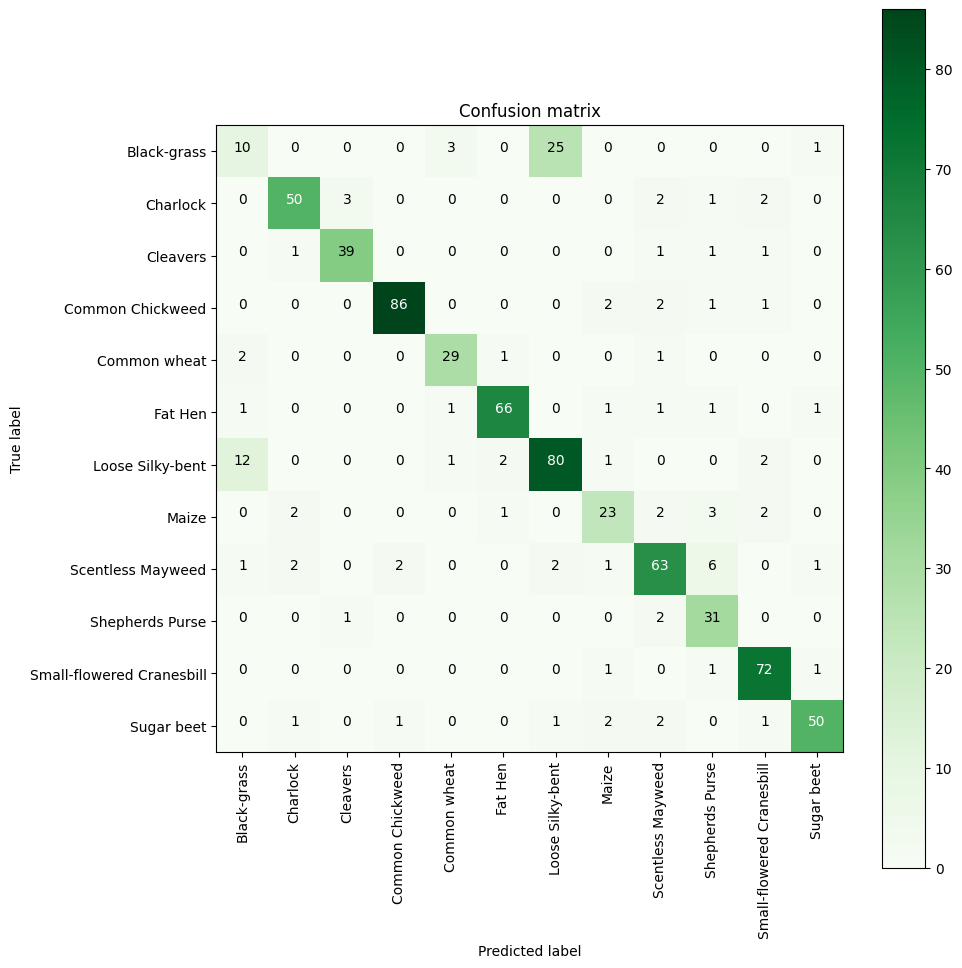

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)               # Predict probabilities for test images
predYClasses = np.argmax(predY, axis=1)             # Convert probabilities to predicted class indices
trueY = np.argmax(y_test, axis=1)                   # Convert one-hot encoded labels to class indices

# --- Generate the confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class labels (from index_to_label dictionary) ---
categ = list(index_to_label.values())               # Extract class names from dictionary

# --- Plot the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Print model evaluation metrics ---
print("Accuracy: ", results_AP1_overfitted_augmented[1])     # Accuracy from model.evaluate()
print("Precision: ", results_AP1_overfitted_augmented[2])    # Precision (must be included in model's metrics)
print("Recall: ", results_AP1_overfitted_augmented[3])       # Recall (must be included in model's metrics)


In [ ]:
# Build the best model
model = build_best_model()

# Compile the model with optimizer, loss function and metrics
model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall()]
)

# Define callbacks for learning rate adjustment and early stopping
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

# Create data generator with real-time augmentation
train_gen = get_augmented_generator(X_train_cleaned, y_train, batch_size=8)

# Train the model using the generator
history_AP1_better_augmented = model.fit(
    train_gen,                                    # training data with augmentation
    validation_data=(X_val_cleaned, y_val),       # static validation set
    epochs=30,
    shuffle=True,
    callbacks=callbacks
)


Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - accuracy: 0.3023 - loss: 2.3397 - precision_6: 0.4010 - recall_6: 0.1882 - val_accuracy: 0.0604 - val_loss: 6.4411 - val_precision_6: 0.0613 - val_recall_6: 0.0604 - learning_rate: 0.0010
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.4959 - loss: 1.5342 - precision_6: 0.6066 - recall_6: 0.3658 - val_accuracy: 0.5197 - val_loss: 1.9156 - val_precision_6: 0.5679 - val_recall_6: 0.4817 - learning_rate: 0.0010
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5570 - loss: 1.3491 - precision_6: 0.6663 - recall_6: 0.4358 - val_accuracy: 0.5899 - val_loss: 1.3108 - val_precision_6: 0.6678 - val_recall_6: 0.5449 - learning_rate: 0.0010
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - accuracy: 0.6115 - loss: 1.1524 - precision_6: 0.6985 - recall_6: 0.4919 - val_accuracy: 0.4129 - val_loss: 3.3015 - val_precision_6: 0.4414 - val_recall_6: 0.4017 - learning_rate: 0.0010
Epoch 5/30
416/416 ━━━━━

The same as in build_overfitted_model()

In [ ]:
results_AP1_better_augmented = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - accuracy: 0.8538 - loss: 0.3641 - precision_6: 0.8860 - recall_6: 0.8387


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step
Accuracy:  0.8653576374053955
Precision:  0.8936484456062317
Recall:  0.8485273718833923


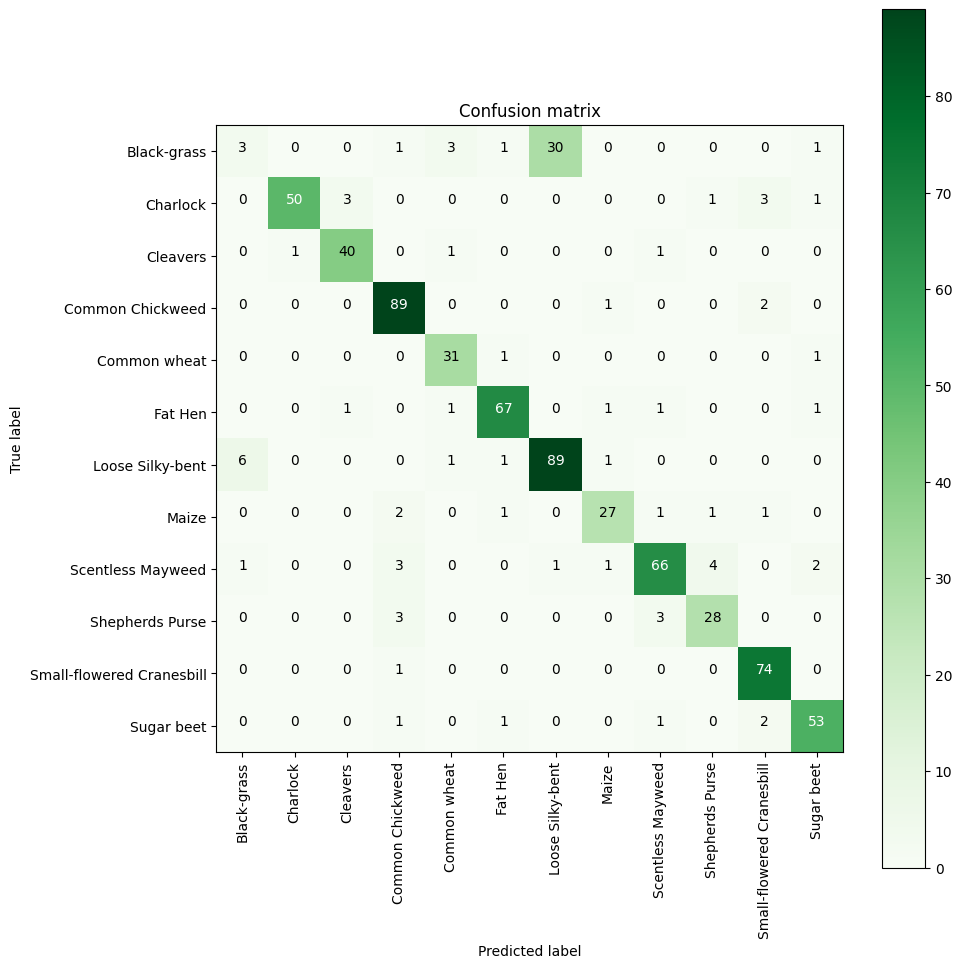

In [ ]:
# --- Predicting model output on the test set ---
predY = model.predict(X_test_cleaned)               # Predict class probabilities
predYClasses = np.argmax(predY, axis=1)             # Get predicted class labels
trueY = np.argmax(y_test, axis=1)                   # Get true class labels from one-hot encoded format

# --- Generate the confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- Convert class indices to label names ---
categ = list(index_to_label.values())               # Convert index-to-label dict to list

# --- Plot the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Print evaluation metrics ---
print("Accuracy: ", results_AP1_better_augmented[1])     # Overall accuracy
print("Precision: ", results_AP1_better_augmented[2])    # Precision metric from model.evaluate()
print("Recall: ", results_AP1_better_augmented[3])       # Recall metric from model.evaluate()


## Model comparison - approach 1, with callbacks and data augmentation

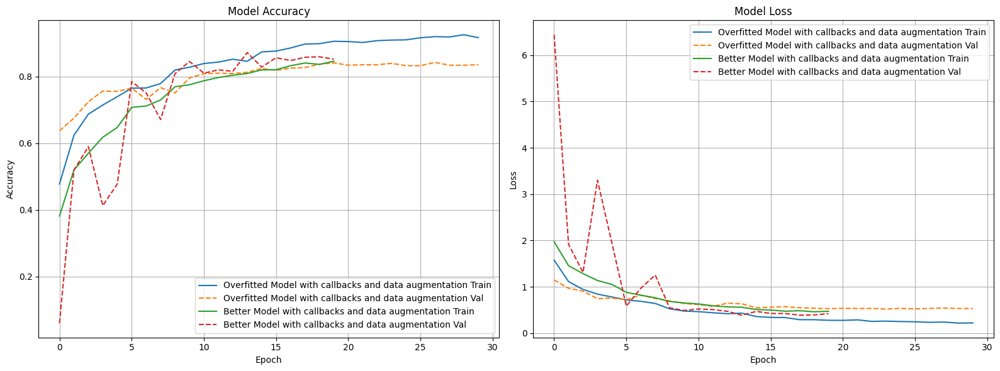

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Overfitted Model with callbacks and data augmentation": history_AP1_overfitted_augmented.history if 'history_AP1_overfitted_augmented' in globals() else None,
    "Better Model with callbacks and data augmentation": history_AP1_better_augmented.history if 'history_AP1_better_augmented' in globals() else None
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


As illustrated in the accuracy and loss plots above, the better model exhibits slightly lower training accuracy than the overfitted baseline, but its validation accuracy remains consistently higher and its validation loss more stable. This confirms that despite fewer training steps, the better model generalizes more effectively. The overfitted model continues improving on the training set but fails to translate this into validation gains—clear evidence of overfitting. In contrast, the better model, aided by regularization, data augmentation, and callbacks, achieves stronger and more reliable performance across unseen data.

## Running the pre-trained MobileNet model

In [ ]:
def build_mobilenet_model(input_shape=(96,96, 3), num_classes=12):
    base_model = MobileNetV2(weights='imagenet', include_top=False, input_tensor=Input(shape=input_shape))

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(128, activation='relu')(x)
    output = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=output)

    # Freeze base model initially
    for layer in base_model.layers:
        layer.trainable = False

    return model


We selected MobileNet as our transfer learning backbone due to its architecture being specifically optimized for smaller input resolutions, typically ranging from 96×96 to 224×224 pixels. Unlike larger models such as ResNet50 or InceptionV3, which are designed for high-resolution inputs and carry significantly more parameters, MobileNetV2 strikes a balance between computational efficiency and representational power.

In [ ]:
model = build_mobilenet_model(input_shape=ins, num_classes=12)

model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall()]
)

# Callbacks
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

# Augmented data generator
train_gen = get_augmented_generator(X_train_cleaned, y_train, batch_size=8)

# Train the model
history_AP1_mobilenet = model.fit(
    train_gen,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    callbacks=callbacks
)

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - accuracy: 0.3494 - loss: 2.1301 - precision_7: 0.5030 - recall_7: 0.1313 - val_accuracy: 0.5772 - val_loss: 1.2665 - val_precision_7: 0.7150 - val_recall_7: 0.3806 - learning_rate: 0.0010
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - accuracy: 0.5518 - loss: 1.2718 - precision_7: 0.6978 - recall_7: 0.3873 - val_accuracy: 0.6306 - val_loss: 1.0907 - val_precision_7: 0.7601 - val_recall_7: 0.4494 - learning_rate: 0.0010
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - accuracy: 0.6206 - loss: 1.0665 - precision_7: 0.7489 - recall_7: 0.4654 - val_accuracy: 0.6124 - val_loss: 1.0946 - val_precision_7: 0.7019 - val_recall_7: 0.5225 - learning_rate: 0.0010
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - accuracy: 0.6395 - loss: 1.0193 - precision_7: 0.7487 - recall_7: 0.5275 - val_accuracy: 0.6419 - val_loss: 0.9832 - val_precision_7: 0.7408 - val_recall_7: 0.5379

In this setup, the main change compared to previous models is the use of a pretrained MobileNetV2 as the base architecture replacing custom CNNs. The model is compiled similarly with the Adam optimizer and standard metrics. The training process still uses data augmentation (train_gen) and the same callbacks (ReduceLROnPlateau and EarlyStopping) for regularization. However, since the MobileNetV2 backbone is initially frozen, training focuses only on the newly added dense layers, which enables efficient feature reuse while preventing overfitting in early training stages.

In [ ]:
results_AP1_mobilenet = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - accuracy: 0.7763 - loss: 0.7224 - precision_7: 0.8376 - recall_7: 0.7155


## Results of pre-trained model

23/23 ━━━━━━━━━━━━━━━━━━━━ 6s 138ms/step
Accuracy:  0.7755960822105408
Precision:  0.8266452550888062
Recall:  0.722300112247467


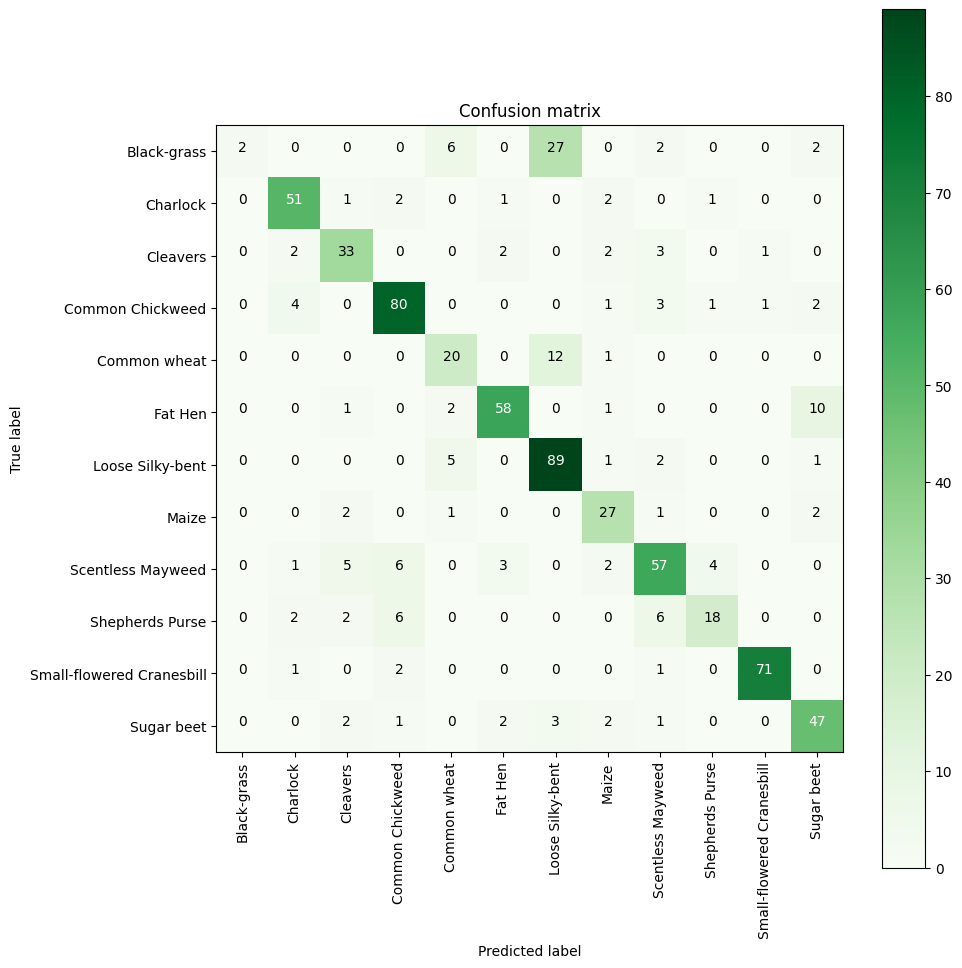

In [ ]:
# --- Predict model output on the test dataset ---
predY = model.predict(X_test_cleaned)                # Predict probabilities
predYClasses = np.argmax(predY, axis=1)              # Convert probabilities to predicted class indices
trueY = np.argmax(y_test, axis=1)                    # Extract true class indices from one-hot labels

# --- Compute the confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- Get list of class names from index_to_label dictionary ---
categ = list(index_to_label.values())                # Convert dict to list of class labels

# --- Plot the confusion matrix (non-normalized) ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Print evaluation metrics from model.evaluate() output ---
print("Accuracy: ", results_AP1_mobilenet[1])     # Accuracy of the model
print("Precision: ", results_AP1_mobilenet[2])    # Precision score (requires inclusion in model metrics)
print("Recall: ", results_AP1_mobilenet[3])       # Recall score (requires inclusion in model metrics)


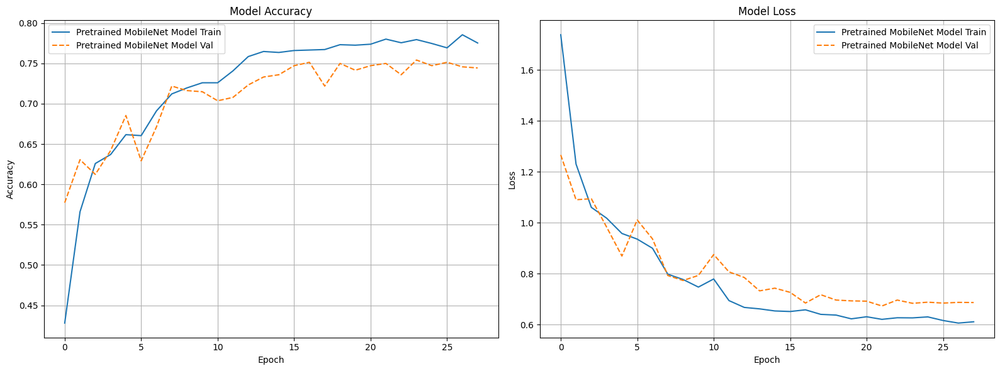

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Pretrained MobileNet Model": history_AP1_mobilenet.history if 'history_AP1_mobilenet' in globals() else None,
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


 Both training and validation accuracy increase steadily over epochs, reaching approximately 0.78 and 0.75 respectively, without any abrupt divergence—indicating good generalization. The validation loss decreases alongside training loss and plateaus without signs of overfitting. Although the final performance is slightly below that of the regularized custom CNN, the pretrained MobileNet still demonstrates robust and stable training dynamics, which is notable given its fixed feature extractor and low input resolution.

# Approach 2 - Keeping grayscale images in the training set and NOT CHANGING THEM TO RGB - instead changing all images to greyscale (96,96,1)






In [ ]:
# Parameters
IMG_SIZE = 96
DATASET_DIR = "train"

# Containers
images = []
labels = []
class_names = sorted([d for d in os.listdir(DATASET_DIR) if os.path.isdir(os.path.join(DATASET_DIR, d))])

# Iterate through class folders and load images
for class_name in class_names:
    class_dir = os.path.join(DATASET_DIR, class_name)
    for filename in os.listdir(class_dir):
        img_path = os.path.join(class_dir, filename)
        try:
            # Open image, convert them to greyscale and resize
            img = Image.open(img_path).convert('L')  # Convert to grayscale
            img = img.resize((IMG_SIZE, IMG_SIZE))
            img_array = img_to_array(img) / 255.0  # Normalize to 0–1
            images.append(img_array)
            labels.append(class_name)
        except Exception as e:
            print(f"Skipping file {img_path}: {e}")

# Convert to numpy arrays
X = np.array(images)
y = np.array(labels)

print("Images loaded and resized")
print(f"Image shape: {X.shape}")
print(f"Unique classes: {len(np.unique(y))}")


Images loaded and resized
Image shape: (4750, 96, 96, 1)
Unique classes: 12


In the second preprocessing approach, we adopted a uniform grayscale strategy across the entire dataset. Instead of converting grayscale or unreadable images to RGB, we decided to convert all images—regardless of their original format—to grayscale. This allowed us to simplify the data structure by working with single-channel images of shape (96, 96, 1), rather than mixing three-channel RGB and single-channel grayscale representations.

We started by specifying the target input resolution of 96×96 pixels, as in the previous approach, and defining the path to the training dataset. We then iterated through each class folder, opening every image using the PIL library and explicitly converting it to grayscale using mode 'L'. Each image was resized to the desired resolution, normalized to the [0, 1] range, and stored in a NumPy array. Corresponding labels were stored alongside.

This preprocessing path offers a key benefit: it removes color information entirely, which forces the model to rely solely on shape, texture, and structural features rather than hue-based cues. Such an approach is particularly valuable when analyzing whether classification performance is strongly dependent on color, or whether CNNs can perform equally well with purely structural input.

Choosing grayscale also significantly reduces the input dimensionality—from three channels to one—thereby simplifying the model’s input layer, reducing memory usage, and potentially speeding up training time. However, it comes at the cost of losing color-based discriminative features, which could be important given that some plant species differ only subtly in pigmentation.

This experiment enables us to benchmark CNN performance when color information is removed entirely and serves as a point of comparison against the RGB and segmentation-based pipelines. Importantly, this grayscale-centric method ensures consistency and avoids any complications from color mismatches, while still preserving a complete set of valid images.

In [ ]:
# Create label-to-index mapping
label_to_index = {label: idx for idx, label in enumerate(np.unique(y))}
index_to_label = {idx: label for label, idx in label_to_index.items()}

# Encode string labels to integer indices
y_encoded = np.array([label_to_index[label] for label in y])

# One-hot encode labels
y_categorical = to_categorical(y_encoded, num_classes=len(label_to_index))

# Split 1: train and test1 (70% / 30%)
X_train, X_test1, y_train, y_test1 = train_test_split(
    X, y_categorical, test_size=0.30, stratify=y_categorical, random_state=42
)

# Split 2: test1 into val and test (50%/50% of 30% => 15%/15%)
X_val, X_test, y_val, y_test = train_test_split(
    X_test1, y_test1, test_size=0.50, stratify=y_test1, random_state=42
)


print("Labels encoded and data split finished.")
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_val shape:   {X_val.shape}")
print(f"y_val shape:   {y_val.shape}")
print(f"X_test shape:  {X_test.shape}")
print(f"y_test shape:  {y_test.shape}")


Labels encoded and data split finished.
X_train shape: (3325, 96, 96, 1)
y_train shape: (3325, 12)
X_val shape:   (712, 96, 96, 1)
y_val shape:   (712, 12)
X_test shape:  (713, 96, 96, 1)
y_test shape:  (713, 12)


In [ ]:
def preprocess_images_grayscale(X):
    preprocessed = []
    for img in X:
        # 1. Convert to uint8 (0–255 range)
        img_uint8 = (img * 255).astype(np.uint8)  # shape: (96, 96, 1)

        # 2. Remove channel dimension if needed (from (96, 96, 1) to (96, 96))
        img_gray = img_uint8.squeeze()

        # 3. Apply Gaussian Blur to reduce noise
        blurred = cv2.GaussianBlur(img_gray, (3, 3), 0)

        # 4. Contrast enhancement using CLAHE (adaptive histogram equalization)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        enhanced = clahe.apply(blurred)

        # 5. Morphological noise removal using closing
        cleaned = cv2.morphologyEx(enhanced, cv2.MORPH_CLOSE, kernel)

        # 6. Rescale to [0–1] and restore channel dimension
        final_img = (cleaned.astype(np.float32) / 255.0)[..., np.newaxis]  # shape: (96, 96, 1)

        preprocessed.append(final_img)

    return np.array(preprocessed)

# --- Apply preprocessing to dataset splits ---
X_train_cleaned = preprocess_images_grayscale(X_train)
X_val_cleaned = preprocess_images_grayscale(X_val)
X_test_cleaned = preprocess_images_grayscale(X_test)

Unlike the RGB-based preprocessing pipeline, where segmentation was performed using HSV color filtering to isolate green regions, the grayscale approach does not rely on any color information. This is because grayscale images contain only intensity values, making hue-based segmentation (e.g., green masking) inapplicable. As a result, steps such as color space conversion, HSV thresholding, and green masking were omitted entirely.

Instead, we focused on enhancing the structural and textural features of the image. After converting images to uint8 format and removing the singleton channel dimension, we applied a Gaussian blur similarly to the RGB version—aimed at reducing noise and smoothing small variations.

To compensate for the absence of color-based cues, we introduced CLAHE (Contrast Limited Adaptive Histogram Equalization), which was not used in the RGB pipeline. CLAHE adaptively enhances local contrast, helping to emphasize fine-grained patterns such as leaf contours and vein structures, which are essential for classification in grayscale.

Morphological closing, previously used to clean binary masks in the HSV pipeline, was reused here—this time applied directly to the enhanced grayscale image. It helps suppress residual noise and fills small gaps in leaf textures, ensuring continuity in object boundaries.

Finally, the image was normalized back to the [0, 1] range and reshaped to include the channel dimension, making it compatible with CNN input.

In summary, the grayscale pipeline excludes all color-specific operations and instead introduces contrast enhancement (CLAHE) to extract meaningful visual features. While it may offer reduced discriminative power in color-dependent tasks, it is highly useful for evaluating the model’s ability to generalize based solely on shape and intensity.

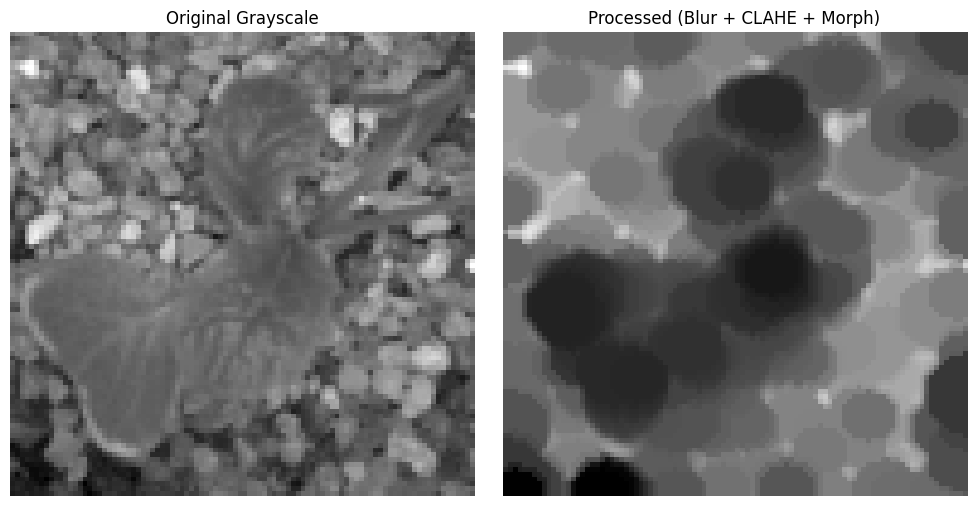

In [ ]:
i = np.random.randint(0, len(X_train))

original = X_train[i].squeeze()         # (96, 96, 1) → (96, 96)
processed = X_train_cleaned[i].squeeze()  # (96, 96, 1) → (96, 96)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(original, cmap="gray")
axs[0].set_title("Original Grayscale")

axs[1].imshow(processed, cmap="gray")
axs[1].set_title("Processed (Blur + CLAHE + Morph)")

for ax in axs:
    ax.axis("off")

plt.tight_layout()
plt.show()


## Running models with no callbacks to see the performance

In [ ]:
model = build_overfitted_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)

history_AP2_overfitted = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8
)


Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - accuracy: 0.4134 - loss: 1.8274 - precision: 0.6050 - recall: 0.2218 - val_accuracy: 0.5857 - val_loss: 1.2307 - val_precision: 0.6674 - val_recall: 0.4143
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - accuracy: 0.8770 - loss: 0.4183 - precision: 0.9114 - recall: 0.8293 - val_accuracy: 0.6292 - val_loss: 1.2527 - val_precision: 0.6810 - val_recall: 0.5576
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - accuracy: 0.9947 - loss: 0.0267 - precision: 0.9953 - recall: 0.9913 - val_accuracy: 0.6011 - val_loss: 1.7966 - val_precision: 0.6337 - val_recall: 0.5758
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - accuracy: 0.9964 - loss: 0.0164 - precision: 0.9964 - recall: 0.9963 - val_accuracy: 0.6573 - val_loss: 1.7605 - val_precision: 0.6701 - val_recall: 0.6419
Epoch 5/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - accuracy: 1.0000 - loss: 7.2195e-04 - precision: 1.0000 - recall: 1.0000 - val_accuracy: 0.6517 

In [ ]:
results_AP2_overfitted = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.5284 - loss: 3.1751 - precision: 0.5471 - recall: 0.5132


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
Accuracy:  0.5063113570213318
Precision:  0.5249621868133545
Recall:  0.48667600750923157


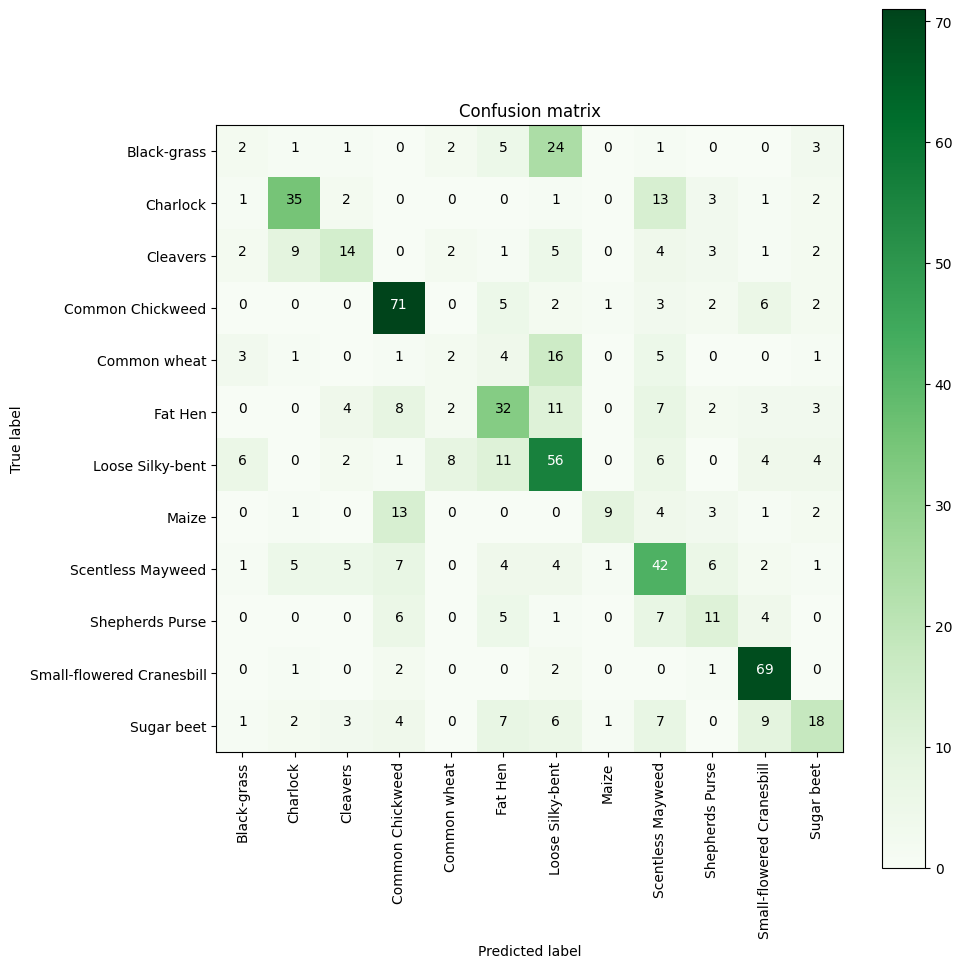

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion matrix computation ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (your index_to_label) ---
categ = list(index_to_label.values())   # Convert dict to list of labels

# --- Plot the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Print model metrics ---
print("Accuracy: ", results_AP2_overfitted[1])
print("Precision: ", results_AP2_overfitted[2])
print("Recall: ", results_AP2_overfitted[3])


In [ ]:
model = build_best_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)


history_AP2_better = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8,
    shuffle = True
    )


Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 17s 18ms/step - accuracy: 0.3168 - loss: 2.2081 - precision: 0.4245 - recall: 0.1981 - val_accuracy: 0.0843 - val_loss: 5.6822 - val_precision: 0.0859 - val_recall: 0.0829
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5448 - loss: 1.3500 - precision: 0.6519 - recall: 0.4342 - val_accuracy: 0.6419 - val_loss: 1.2069 - val_precision: 0.6931 - val_recall: 0.5899
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.6317 - loss: 1.1050 - precision: 0.7171 - recall: 0.5308 - val_accuracy: 0.4902 - val_loss: 1.7911 - val_precision: 0.5321 - val_recall: 0.4424
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.6725 - loss: 0.9610 - precision: 0.7537 - recall: 0.5824 - val_accuracy: 0.7275 - val_loss: 0.8691 - val_precision: 0.7810 - val_recall: 0.6910
Epoch 5/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.7134 - loss: 0.7775 - precision: 0.7802 - recall: 0.6493 - val_accuracy: 0.5618 - val_loss: 

In [ ]:
results_AP2_better = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7774 - loss: 0.8030 - precision: 0.7912 - recall: 0.7629


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step
Accuracy:  0.8050490617752075
Precision:  0.8219971060752869
Recall:  0.7966339588165283


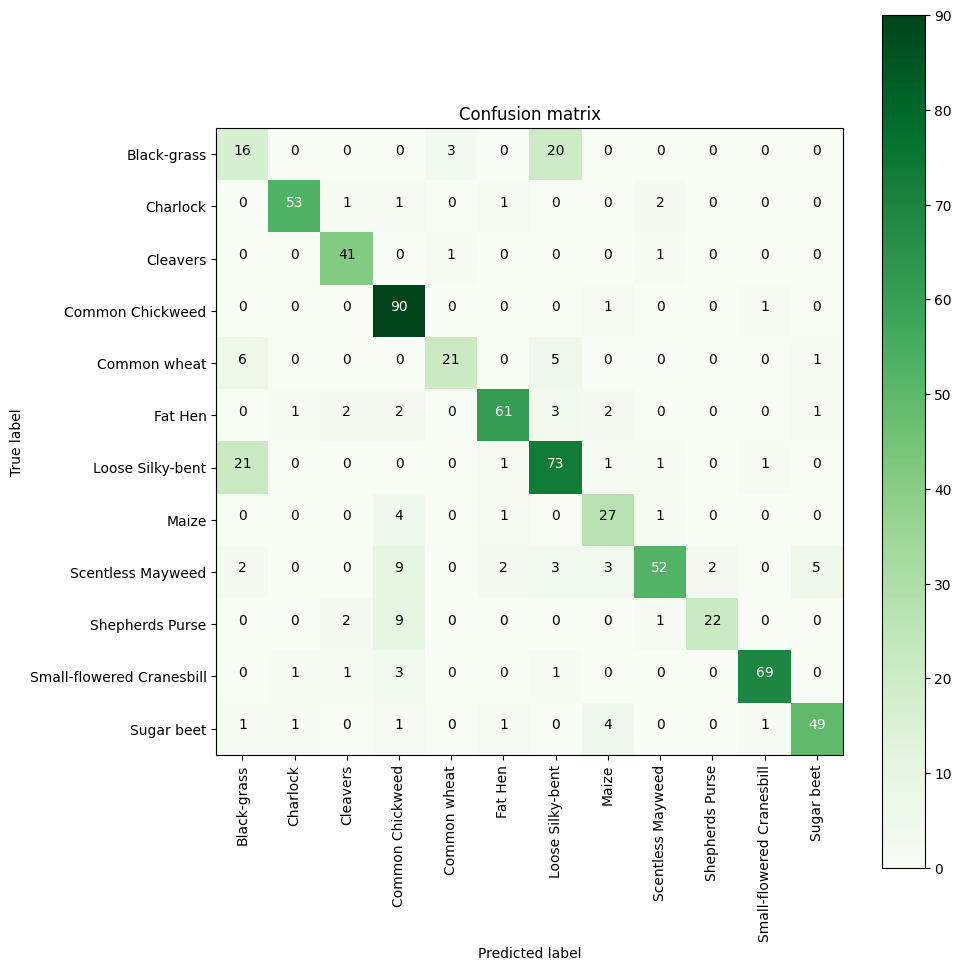

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion matrix (Confusion Matrix) ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (from your index_to_label) ---
categ = list(index_to_label.values())   # Convert dict to a list of labels

# --- Plotting the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Print performance metrics ---
print("Accuracy: ", results_AP2_better[1])
print("Precision: ", results_AP2_better[2])
print("Recall: ", results_AP2_better[3])


## Model comparison - approach 2, no callbacks

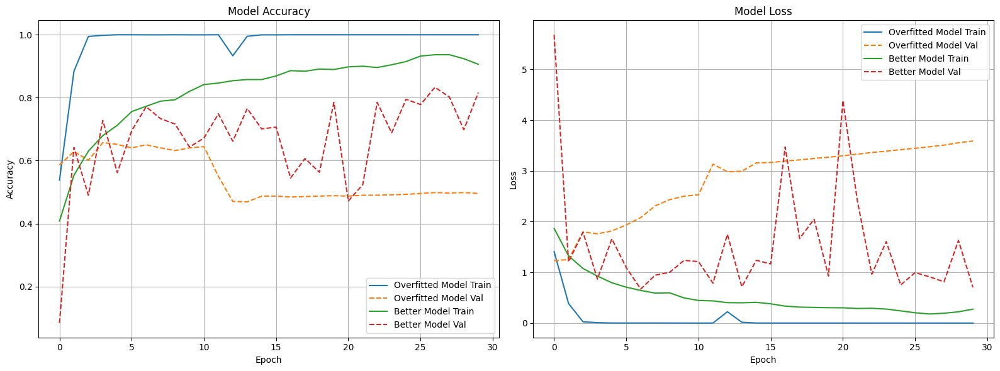

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Overfitted Model": history_AP2_overfitted.history if 'history_AP2_overfitted' in globals() else None,
    "Better Model": history_AP2_better.history if 'history_AP2_better' in globals() else None
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


## Running models with callbacks

In [ ]:
model = build_overfitted_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)

callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

history_AP2_overfitted_with_callbacks = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8,
    callbacks = callbacks
)


Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - accuracy: 0.3738 - loss: 1.9012 - precision: 0.5930 - recall: 0.1827 - val_accuracy: 0.6784 - val_loss: 0.9390 - val_precision: 0.7904 - val_recall: 0.5562 - learning_rate: 0.0010
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - accuracy: 0.8639 - loss: 0.4344 - precision: 0.8938 - recall: 0.8208 - val_accuracy: 0.6320 - val_loss: 1.1838 - val_precision: 0.6964 - val_recall: 0.5702 - learning_rate: 0.0010
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - accuracy: 0.9964 - loss: 0.0279 - precision: 0.9973 - recall: 0.9957 - val_accuracy: 0.6320 - val_loss: 1.5139 - val_precision: 0.6632 - val_recall: 0.6194 - learning_rate: 0.0010
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - accuracy: 0.9990 - loss: 0.0088 - precision: 0.9995 - recall: 0.9989 - val_accuracy: 0.6643 - val_loss: 1.5673 - val_precision: 0.6789 - val_recall: 0.6475 - learning_rate: 5.0000e-04
Epoch 5/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/ste

In [ ]:
results_AP2_overfitted_with_callbacks = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.6763 - loss: 0.9232 - precision: 0.8103 - recall: 0.5725


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
Accuracy:  0.6942496299743652
Precision:  0.818913459777832
Recall:  0.5708274841308594


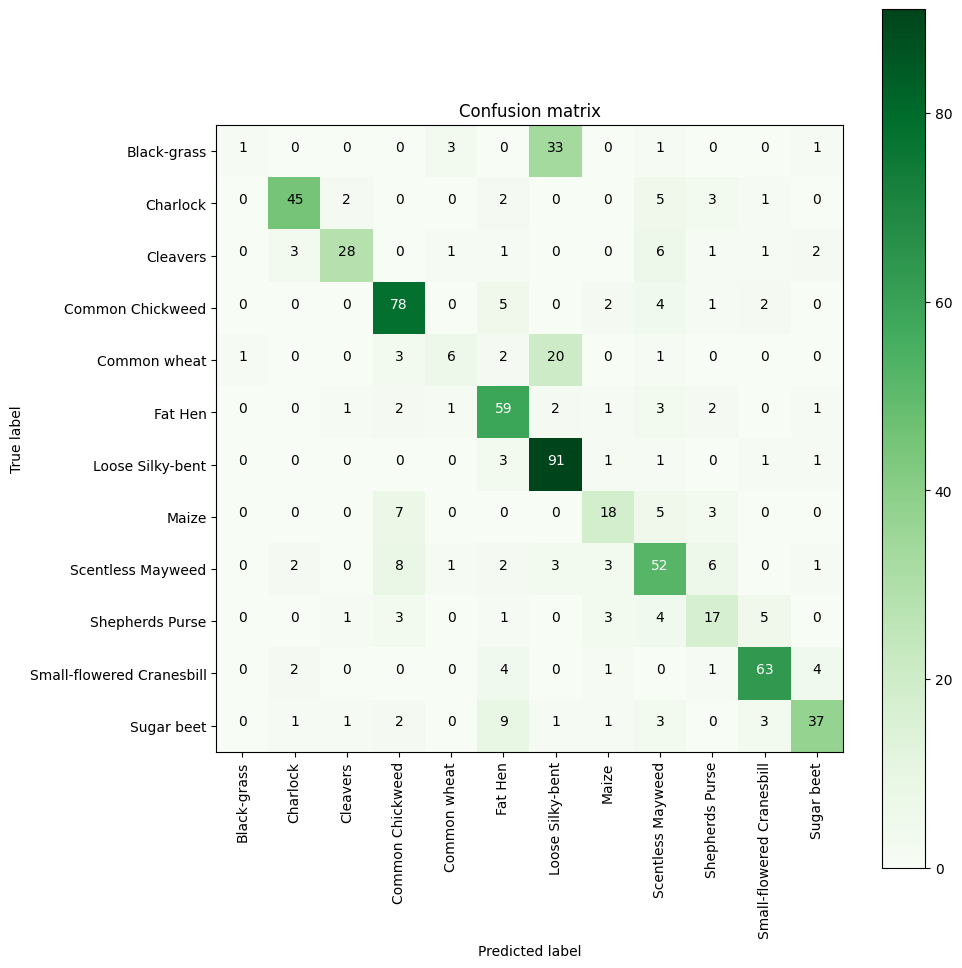

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (your index_to_label) ---
categ = list(index_to_label.values())   # Convert dictionary to a list of names

# --- Plotting the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Displaying metrics ---
print("Accuracy: ", results_AP2_overfitted_with_callbacks[1])
print("Precision: ", results_AP2_overfitted_with_callbacks[2])
print("Recall: ", results_AP2_overfitted_with_callbacks[3])

In [ ]:
model = build_best_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)

callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

history_AP2_better_with_callbacks = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8,
    shuffle = True,
    callbacks = callbacks
    )


Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 16s 18ms/step - accuracy: 0.3015 - loss: 2.3635 - precision: 0.3833 - recall: 0.1734 - val_accuracy: 0.0857 - val_loss: 9.8321 - val_precision: 0.0844 - val_recall: 0.0843 - learning_rate: 0.0010
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - accuracy: 0.5110 - loss: 1.4414 - precision: 0.6229 - recall: 0.3911 - val_accuracy: 0.5997 - val_loss: 1.0758 - val_precision: 0.6906 - val_recall: 0.5140 - learning_rate: 0.0010
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.6042 - loss: 1.1774 - precision: 0.6899 - recall: 0.4693 - val_accuracy: 0.7163 - val_loss: 0.8670 - val_precision: 0.7701 - val_recall: 0.6587 - learning_rate: 0.0010
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.6463 - loss: 1.0059 - precision: 0.7343 - recall: 0.5628 - val_accuracy: 0.6039 - val_loss: 1.5620 - val_precision: 0.6372 - val_recall: 0.5576 - learning_rate: 0.0010
Epoch 5/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accurac

In [ ]:
results_AP2_better_with_callbacks = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.8272 - loss: 0.5831 - precision: 0.8505 - recall: 0.8171


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step
Accuracy:  0.8302945494651794
Precision:  0.8560940027236938
Recall:  0.8176718354225159


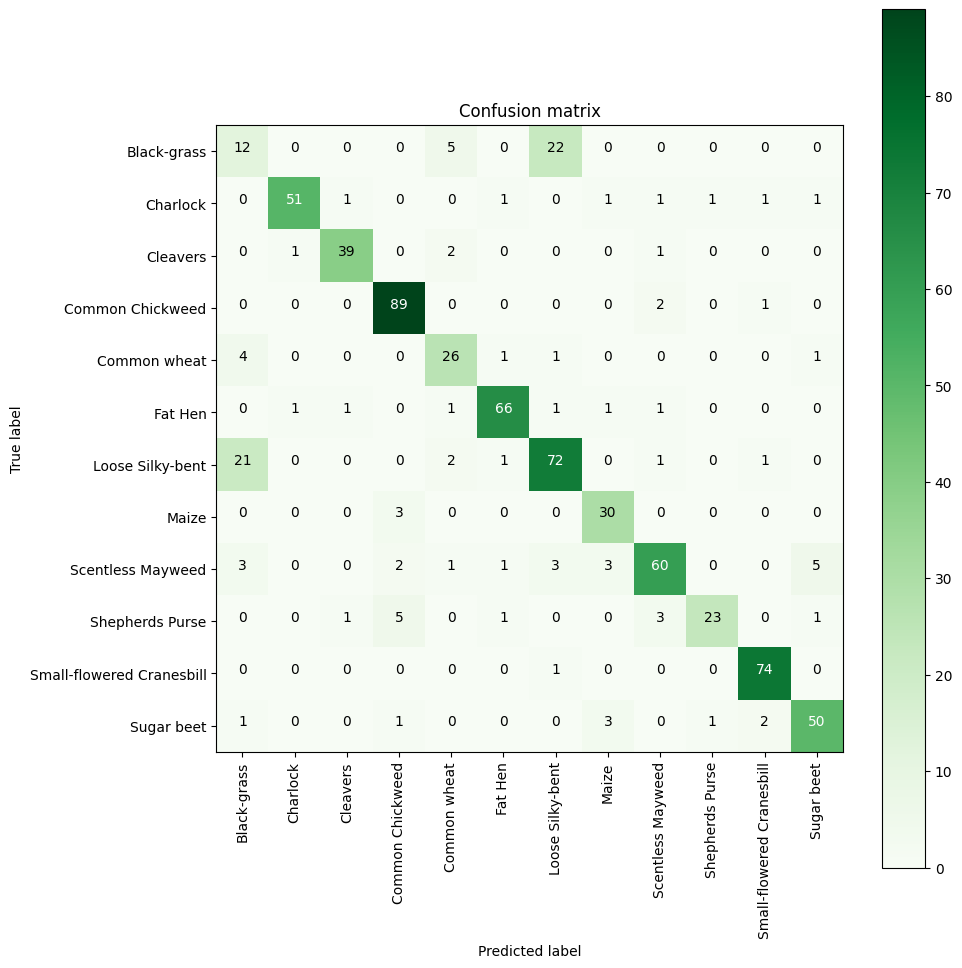

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (your index_to_label) ---
categ = list(index_to_label.values())   # Convert dictionary to list of names

# --- Plotting the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Display performance metrics ---
print("Accuracy: ", results_AP2_better_with_callbacks[1])
print("Precision: ", results_AP2_better_with_callbacks[2])
print("Recall: ", results_AP2_better_with_callbacks[3])


## Model comparison - approach 2, with callbacks

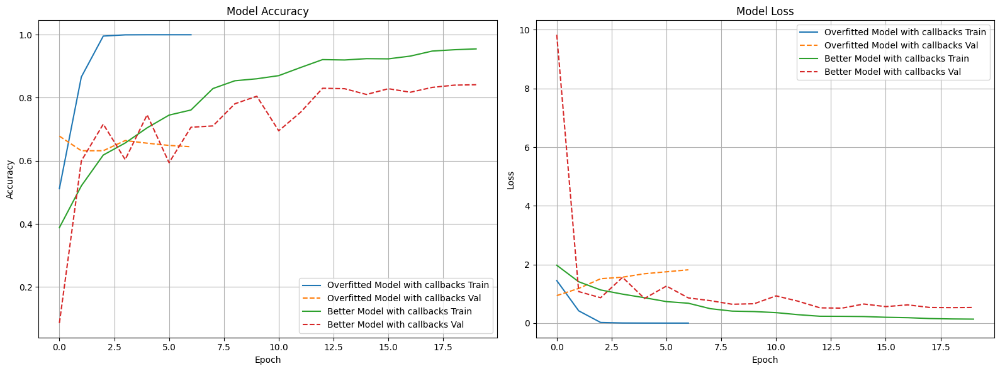

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Overfitted Model with callbacks": history_AP2_overfitted_with_callbacks.history if 'history_AP2_overfitted_with_callbacks' in globals() else None,
    "Better Model with callbacks": history_AP2_better_with_callbacks.history if 'history_AP2_better_with_callbacks' in globals() else None
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


## Adding data-augmentation and running models with it

In [ ]:
# Build the best model (architecture stays the same – data will be augmented)
model = build_overfitted_model()  # you don't need a separate "build_augmented_best_model"

# Compile the model with optimizer, loss function and metrics
model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall()]
)

# Define callbacks for learning rate adjustment and early stopping
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

# Create data generator with real-time augmentation
train_gen = get_augmented_generator(X_train_cleaned, y_train, batch_size=8)

# Train the model using the generator
history_AP2_overfitted_augmented = model.fit(
    train_gen,                                    # training data with augmentation
    validation_data=(X_val_cleaned, y_val),       # static validation set
    epochs=30,
    shuffle=True,
    callbacks=callbacks
)


Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - accuracy: 0.2902 - loss: 2.1804 - precision_12: 0.4786 - recall_12: 0.0819 - val_accuracy: 0.4846 - val_loss: 1.4565 - val_precision_12: 0.7325 - val_recall_12: 0.2346 - learning_rate: 0.0010
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - accuracy: 0.4548 - loss: 1.5273 - precision_12: 0.6428 - recall_12: 0.2114 - val_accuracy: 0.5267 - val_loss: 1.3150 - val_precision_12: 0.6692 - val_recall_12: 0.3750 - learning_rate: 0.0010
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - accuracy: 0.5749 - loss: 1.2253 - precision_12: 0.7100 - recall_12: 0.4045 - val_accuracy: 0.6334 - val_loss: 0.9840 - val_precision_12: 0.7417 - val_recall_12: 0.5365 - learning_rate: 0.0010
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 29s 57ms/step - accuracy: 0.6661 - loss: 0.9691 - precision_12: 0.7577 - recall_12: 0.5803 - val_accuracy: 0.6952 - val_loss: 0.8694 - val_precision_12: 0.7761 - val_recall_12: 0.6376 - learning_rate: 0.0010
Epoch 5/

In [ ]:
results_AP2_overfitted_augmented = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.8109 - loss: 0.5674 - precision_12: 0.8488 - recall_12: 0.7884


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step
Accuracy:  0.8148667812347412
Precision:  0.8509036302566528
Recall:  0.792426347732544


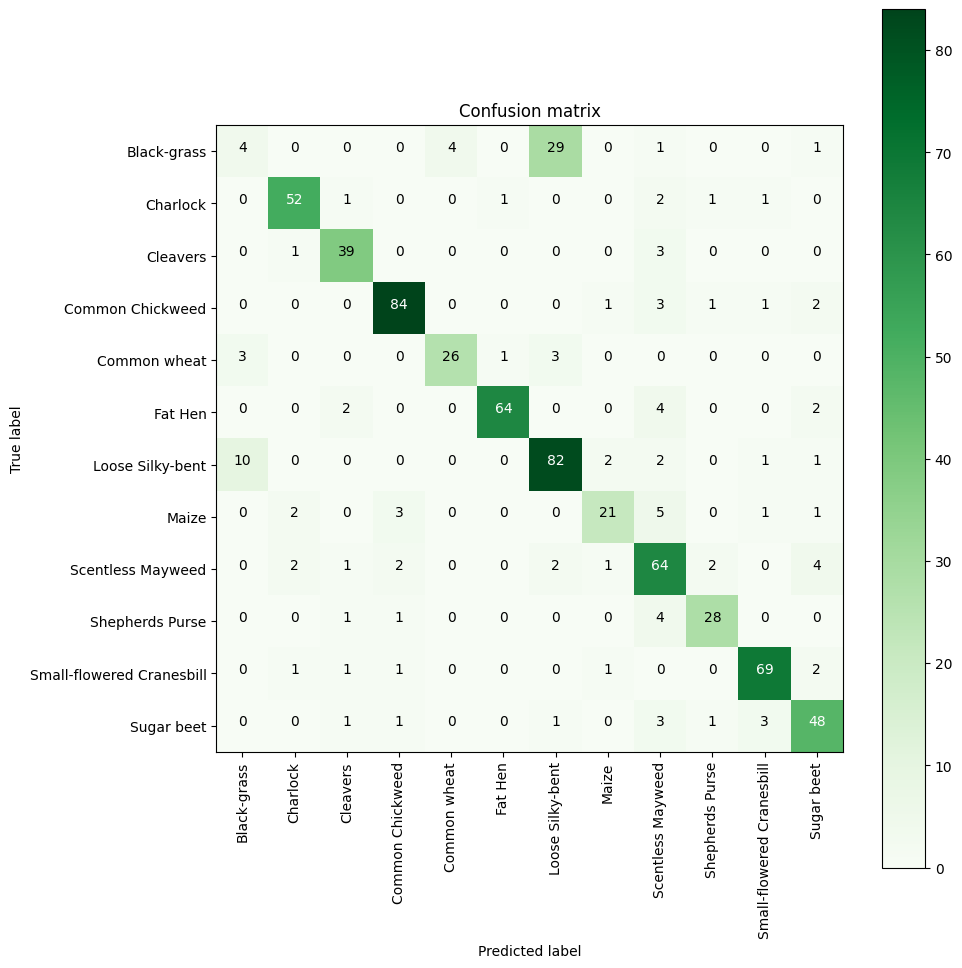

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (your index_to_label) ---
categ = list(index_to_label.values())   # Convert dictionary to a list of names

# --- Plotting the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Display performance metrics ---
print("Accuracy: ", results_AP2_overfitted_augmented[1])
print("Precision: ", results_AP2_overfitted_augmented[2])
print("Recall: ", results_AP2_overfitted_augmented[3])


In [ ]:
# Build the best model (architecture stays the same – data will be augmented)
model = build_best_model()  # you don't need a separate "build_augmented_best_model"

# Compile the model with optimizer, loss function and metrics
model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall()]
)

# Define callbacks for learning rate adjustment and early stopping
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

# Create data generator with real-time augmentation
train_gen = get_augmented_generator(X_train_cleaned, y_train, batch_size=8)

# Train the model using the generator
history_AP2_better_augmented = model.fit(
    train_gen,                                    # training data with augmentation
    validation_data=(X_val_cleaned, y_val),       # static validation set
    epochs=30,
    shuffle=True,
    callbacks=callbacks
)


Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step - accuracy: 0.2752 - loss: 2.3816 - precision_13: 0.3927 - recall_13: 0.1563 - val_accuracy: 0.0604 - val_loss: 8.6097 - val_precision_13: 0.0606 - val_recall_13: 0.0604 - learning_rate: 0.0010
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - accuracy: 0.4689 - loss: 1.6222 - precision_13: 0.5736 - recall_13: 0.3188 - val_accuracy: 0.5421 - val_loss: 1.6917 - val_precision_13: 0.5947 - val_recall_13: 0.5070 - learning_rate: 0.0010
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - accuracy: 0.5701 - loss: 1.2965 - precision_13: 0.6633 - recall_13: 0.4359 - val_accuracy: 0.5927 - val_loss: 1.5601 - val_precision_13: 0.6330 - val_recall_13: 0.5449 - learning_rate: 0.0010
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - accuracy: 0.5889 - loss: 1.2149 - precision_13: 0.6973 - recall_13: 0.4651 - val_accuracy: 0.6039 - val_loss: 1.2136 - val_precision_13: 0.6847 - val_recall_13: 0.5337 - learning_rate: 0.0010
Epoch 5/

In [ ]:
results_AP2_better_augmented = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - accuracy: 0.8679 - loss: 0.3879 - precision_13: 0.8784 - recall_13: 0.8529


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step
Accuracy:  0.8765778541564941
Precision:  0.8890489935874939
Recall:  0.8653576374053955


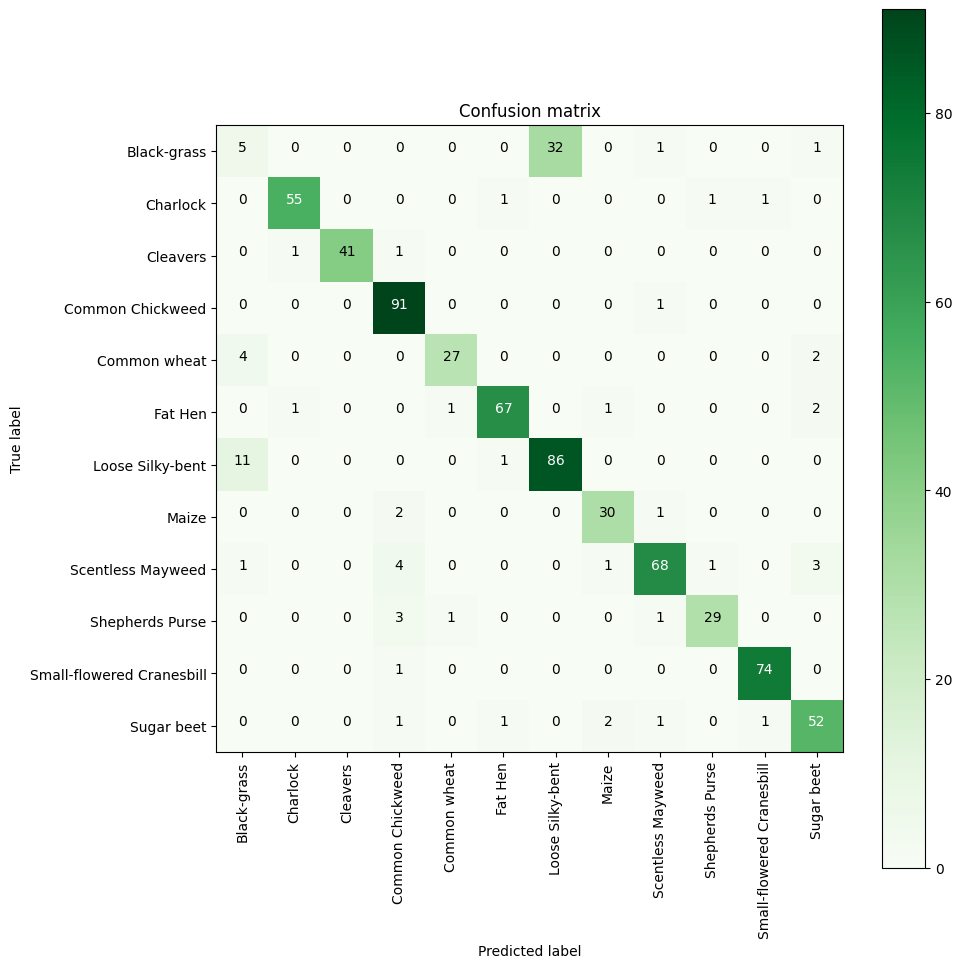

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (your index_to_label) ---
categ = list(index_to_label.values())   # Convert dict to a list of class names

# --- Plotting the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Displaying model performance metrics ---
print("Accuracy: ", results_AP2_better_augmented[1])
print("Precision: ", results_AP2_better_augmented[2])
print("Recall: ", results_AP2_better_augmented[3])


## Model comparison - approach 2, with callbacks and data augmentation

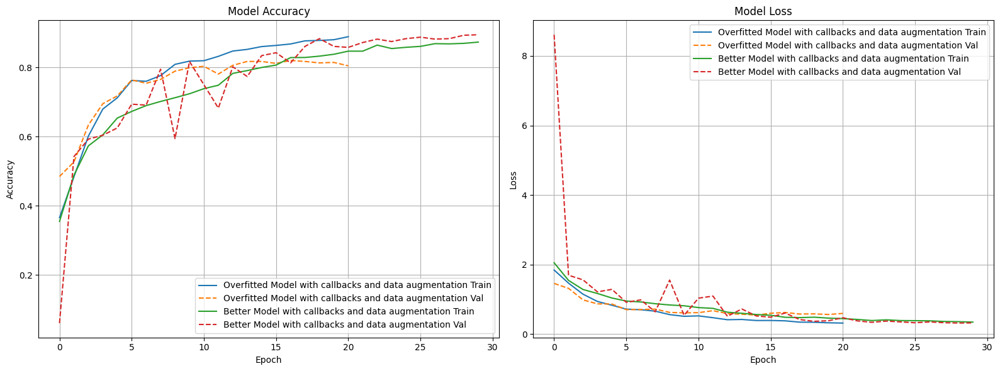

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Overfitted Model with callbacks and data augmentation": history_AP2_overfitted_augmented.history if 'history_AP2_overfitted_augmented' in globals() else None,
    "Better Model with callbacks and data augmentation": history_AP2_better_augmented.history if 'history_AP2_better_augmented' in globals() else None
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


## Running the pre-trained MobileNet model

In [ ]:
model = build_mobilenet_model(input_shape=ins, num_classes=12)

model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall()]
)

# Callbacks
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

# Augmented data generator
train_gen = get_augmented_generator(X_train_cleaned, y_train, batch_size=8)

# Train the model
history_AP2_mobilenet = model.fit(
    train_gen,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    callbacks=callbacks
)

Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - accuracy: 0.3510 - loss: 2.1563 - precision_14: 0.4991 - recall_14: 0.1751 - val_accuracy: 0.5927 - val_loss: 1.1814 - val_precision_14: 0.7291 - val_recall_14: 0.4157 - learning_rate: 0.0010
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - accuracy: 0.5283 - loss: 1.2815 - precision_14: 0.6692 - recall_14: 0.3796 - val_accuracy: 0.5323 - val_loss: 1.3844 - val_precision_14: 0.6111 - val_recall_14: 0.4171 - learning_rate: 0.0010
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - accuracy: 0.6009 - loss: 1.1275 - precision_14: 0.7080 - recall_14: 0.4751 - val_accuracy: 0.6770 - val_loss: 0.9407 - val_precision_14: 0.7597 - val_recall_14: 0.5772 - learning_rate: 0.0010
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - accuracy: 0.6369 - loss: 1.0044 - precision_14: 0.7281 - recall_14: 0.5098 - val_accuracy: 0.6222 - val_loss: 1.0142 - val_precision_14: 0.7400 - val_recall_14: 0.5197 - learning_rate: 0.0010
Epoch 5/

In [ ]:
results_AP2_mobilenet = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - accuracy: 0.7695 - loss: 0.7566 - precision_14: 0.8265 - recall_14: 0.7053


## Results of pre-trained model

23/23 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step
Accuracy:  0.7671809196472168
Precision:  0.826797366142273
Recall:  0.7096773982048035


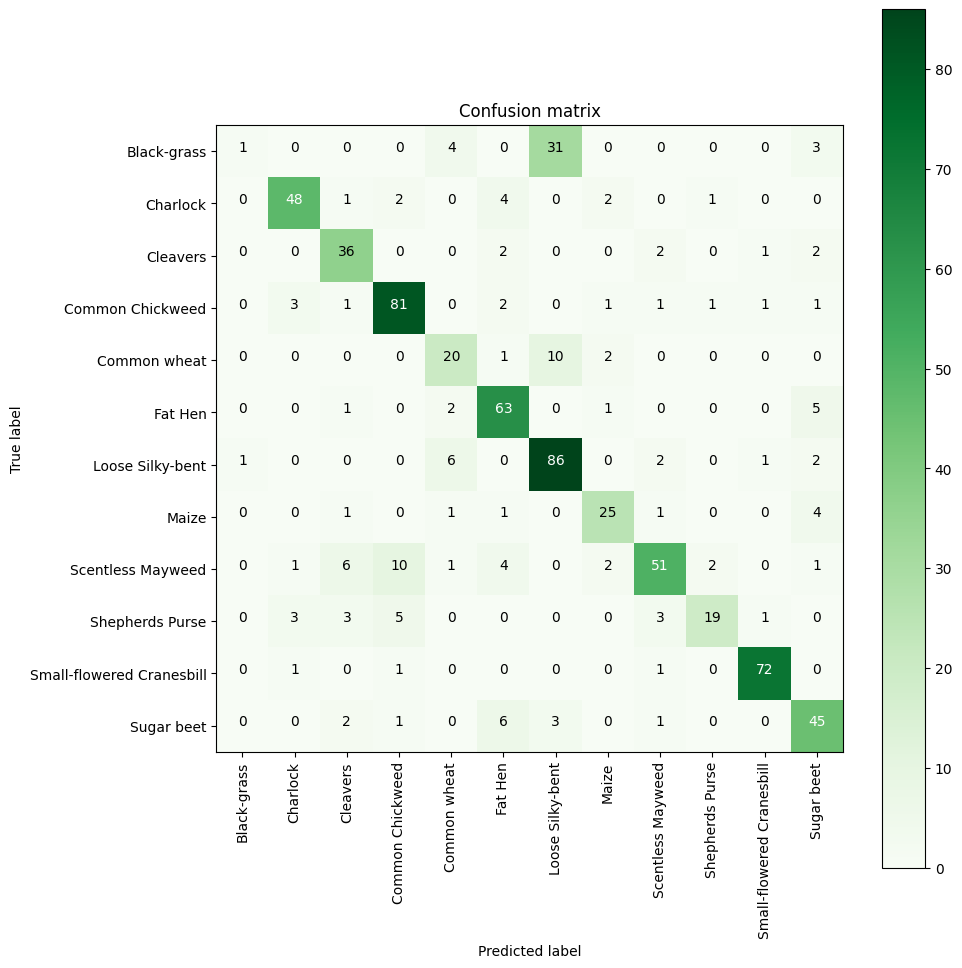

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (your index_to_label) ---
categ = list(index_to_label.values())   # Convert dictionary to list of class names

# --- Plotting the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Display model performance metrics ---
print("Accuracy: ", results_AP2_mobilenet[1])
print("Precision: ", results_AP2_mobilenet[2])
print("Recall: ", results_AP2_mobilenet[3])


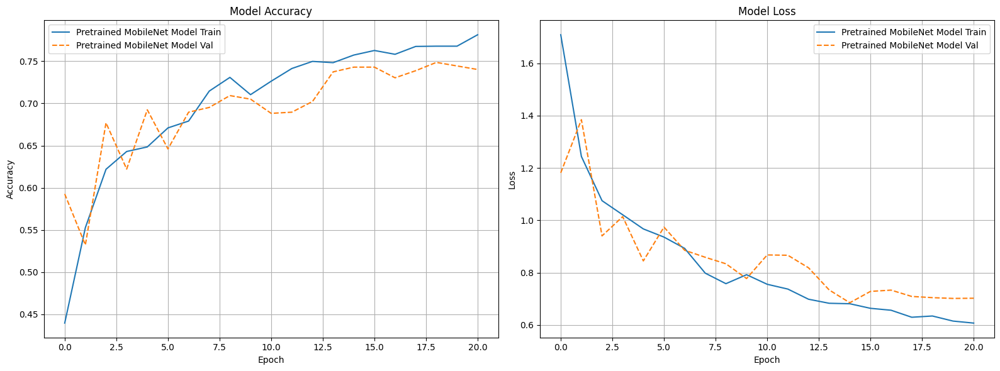

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Pretrained MobileNet Model": history_AP2_mobilenet.history if 'history_AP2_mobilenet' in globals() else None,
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


# Approach 3 - Deleting grayscale images






In [ ]:
# List of known grayscale or unreadable image paths
bad_images = [
    "train/Black-grass/ae8f69724.png",
    "train/Black-grass/77629b9e3.png",
    "train/Black-grass/a8ab1ff26.png",
    "train/Loose Silky-bent/e513efb9a.png",
    "train/Loose Silky-bent/875ef92d7.png",
    "train/Loose Silky-bent/4a0df8be4.png",
    "train/Loose Silky-bent/df615189b.png",
    "train/Loose Silky-bent/ab47c78db.png",
    "train/Loose Silky-bent/881498f15.png",
    "train/Loose Silky-bent/b81690ccf.png",
    "train/Loose Silky-bent/d1653b4c3.png",
    "train/Loose Silky-bent/3fd2b83fc.png",
    "train/Loose Silky-bent/180a7bc07.png",
    "train/Loose Silky-bent/f5602e151.png",
    "train/Loose Silky-bent/3d9f8222d.png",
    "train/Loose Silky-bent/7a8370ede.png",
    "train/Loose Silky-bent/780b7ab63.png",
    "train/Loose Silky-bent/9cf880bda.png",
    "train/Loose Silky-bent/0cf9eb4ab.png",
    "train/Loose Silky-bent/5cb45767e.png",
    "train/Loose Silky-bent/ae1c97a42.png",
    "train/Loose Silky-bent/7324d3cc4.png",
    "train/Loose Silky-bent/02b15993e.png",
    "train/Loose Silky-bent/d31724b7f.png",
]

# Delete each file if it exists
for file_path in bad_images:
    if os.path.exists(file_path):
        os.remove(file_path)
        print(f"Deleted: {file_path}")
    else:
        print(f"Not found: {file_path}")


Deleted: train/Black-grass/ae8f69724.png
Deleted: train/Black-grass/77629b9e3.png
Deleted: train/Black-grass/a8ab1ff26.png
Deleted: train/Loose Silky-bent/e513efb9a.png
Deleted: train/Loose Silky-bent/875ef92d7.png
Deleted: train/Loose Silky-bent/4a0df8be4.png
Deleted: train/Loose Silky-bent/df615189b.png
Deleted: train/Loose Silky-bent/ab47c78db.png
Deleted: train/Loose Silky-bent/881498f15.png
Deleted: train/Loose Silky-bent/b81690ccf.png
Deleted: train/Loose Silky-bent/d1653b4c3.png
Deleted: train/Loose Silky-bent/3fd2b83fc.png
Deleted: train/Loose Silky-bent/180a7bc07.png
Deleted: train/Loose Silky-bent/f5602e151.png
Deleted: train/Loose Silky-bent/3d9f8222d.png
Deleted: train/Loose Silky-bent/7a8370ede.png
Deleted: train/Loose Silky-bent/780b7ab63.png
Deleted: train/Loose Silky-bent/9cf880bda.png
Deleted: train/Loose Silky-bent/0cf9eb4ab.png
Deleted: train/Loose Silky-bent/5cb45767e.png
Deleted: train/Loose Silky-bent/ae1c97a42.png
Deleted: train/Loose Silky-bent/7324d3cc4.png
Del

In [ ]:
# Parameters
IMG_SIZE = 96
DATASET_DIR = "train"

# Containers
images = []
labels = []
class_names = sorted([d for d in os.listdir(DATASET_DIR) if os.path.isdir(os.path.join(DATASET_DIR, d))])

# Iterate through class folders and load images
for class_name in class_names:
    class_dir = os.path.join(DATASET_DIR, class_name)
    for filename in os.listdir(class_dir):
        img_path = os.path.join(class_dir, filename)
        try:
            # Open image, convert to RGB and resize
            img = Image.open(img_path).convert("RGB")
            img = img.resize((IMG_SIZE, IMG_SIZE))
            img_array = img_to_array(img) / 255.0  # Normalize to 0–1
            images.append(img_array)
            labels.append(class_name)
        except Exception as e:
            print(f"Skipping file {img_path}: {e}")

# Convert to numpy arrays
X = np.array(images)
y = np.array(labels)

print("Images loaded and resized")
print(f"Image shape: {X.shape}")
print(f"Unique classes: {len(np.unique(y))}")


Images loaded and resized
Image shape: (4726, 96, 96, 3)
Unique classes: 12


In the third preprocessing strategy, we adopted a more conservative approach by explicitly removing all grayscale and unreadable images from the dataset. We began by referencing a list of known problematic file paths identified during earlier analysis, which included images either stored in single-channel format (L-mode) or had identical RGB values across channels.

Using a simple iteration, we checked whether each of these files existed and, if so, deleted them from the directory. This ensured that the final dataset would consist solely of clean, readable RGB images. After the deletion step, we reloaded the dataset using the same image loading pipeline as in Approach 1 — converting remaining files to RGB, resizing to 96×96 pixels, and normalizing pixel values to [0,1].
***
As a result of this filtering, the total number of training samples dropped from 4750 to 4726, reflecting the exclusion of 24 problematic entries. While this approach slightly reduces the dataset size, it guarantees maximum consistency by eliminating images that could introduce ambiguity or inconsistency in channel structure. Unlike the previous methods, which either corrected or converted problematic images, this strategy prioritizes data integrity over quantity. Although fewer training examples are available, the uniform RGB structure may reduce the risk of learning artifacts and ensure a cleaner input distribution for the CNN.

In [ ]:
# Create label-to-index mapping
label_to_index = {label: idx for idx, label in enumerate(np.unique(y))}
index_to_label = {idx: label for label, idx in label_to_index.items()}

# Encode string labels to integer indices
y_encoded = np.array([label_to_index[label] for label in y])

# One-hot encode labels
y_categorical = to_categorical(y_encoded, num_classes=len(label_to_index))

# Split 1: train and test1 (70% / 30%)
X_train, X_test1, y_train, y_test1 = train_test_split(
    X, y_categorical, test_size=0.30, stratify=y_categorical, random_state=42
)

# Split 2: test1 into val and test (50%/50% of 30% => 15%/15%)
X_val, X_test, y_val, y_test = train_test_split(
    X_test1, y_test1, test_size=0.50, stratify=y_test1, random_state=42
)


print("Labels encoded and data split finished.")
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_val shape:   {X_val.shape}")
print(f"y_val shape:   {y_val.shape}")
print(f"X_test shape:  {X_test.shape}")
print(f"y_test shape:  {y_test.shape}")


Labels encoded and data split finished.
X_train shape: (3308, 96, 96, 3)
y_train shape: (3308, 12)
X_val shape:   (709, 96, 96, 3)
y_val shape:   (709, 12)
X_test shape:  (709, 96, 96, 3)
y_test shape:  (709, 12)


In [ ]:
# --- Settings for green segmentation ---
lower_green = (25, 40, 50)
upper_green = (75, 255, 255)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11, 11))

# --- Preprocessing function ---
def preprocess_images(X):
    preprocessed = []
    for img in X:
        # 1. Convert to uint8 (0–255)
        img_uint8 = (img * 255).astype(np.uint8)

        # 2. Resize image
        resize_img = img_uint8

        # 3. Gaussian blur
        Gblur_img = cv2.GaussianBlur(resize_img, (3, 3), 0)

        # 4. Convert to HSV
        hsv_img = cv2.cvtColor(Gblur_img, cv2.COLOR_RGB2HSV)  # RGB -> HSV

        # 5. Green segmentation
        mask = cv2.inRange(hsv_img, lower_green, upper_green)

        # 6. Morphological cleaning operations
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

        # 7. Boolean mask
        bMask = mask > 0

        # 8. Apply mask to the image
        clearImg = np.zeros_like(resize_img, np.uint8)
        clearImg[bMask] = resize_img[bMask]

        # 9. Convert to float32 (0–1)
        clearImg_float = clearImg.astype(np.float32) / 255.0

        preprocessed.append(clearImg_float)

    return np.asarray(preprocessed)

# --- Preprocess your datasets (example for X_train) ---
X_train_cleaned = preprocess_images(X_train)
X_val_cleaned = preprocess_images(X_val)
X_test_cleaned = preprocess_images(X_test)


## Running models with no callbacks to see the performance

In [ ]:
model = build_overfitted_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)

history_AP3_overfitted = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8
)


Epoch 1/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - accuracy: 0.3143 - loss: 2.0543 - precision: 0.5638 - recall: 0.1000 - val_accuracy: 0.4683 - val_loss: 1.4176 - val_precision: 0.7004 - val_recall: 0.2341
Epoch 2/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - accuracy: 0.7581 - loss: 0.7327 - precision: 0.8499 - recall: 0.6562 - val_accuracy: 0.5374 - val_loss: 1.5729 - val_precision: 0.5776 - val_recall: 0.4358
Epoch 3/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - accuracy: 0.9926 - loss: 0.0397 - precision: 0.9935 - recall: 0.9916 - val_accuracy: 0.5148 - val_loss: 2.4431 - val_precision: 0.5436 - val_recall: 0.4922
Epoch 4/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.9998 - loss: 0.0021 - precision: 1.0000 - recall: 0.9998 - val_accuracy: 0.5275 - val_loss: 2.6786 - val_precision: 0.5508 - val_recall: 0.5049
Epoch 5/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - accuracy: 0.9997 - loss: 0.0029 - precision: 0.9997 - recall: 0.9993 - val_accuracy: 0.5176 - va

In [ ]:
results_AP3_overfitted = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4381 - loss: 4.8263 - precision: 0.4444 - recall: 0.4319


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step
Accuracy:  0.44287729263305664
Precision:  0.44933921098709106
Recall:  0.43159380555152893


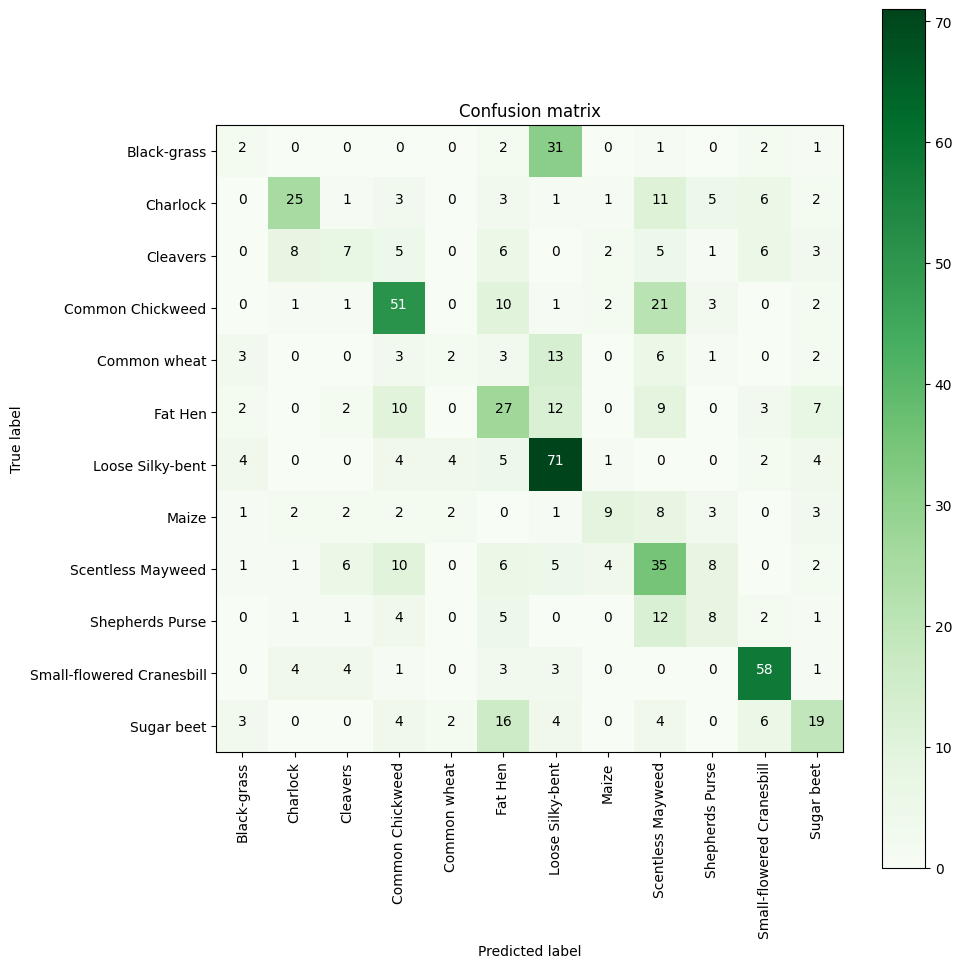

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (your index_to_label) ---
categ = list(index_to_label.values())   # Convert dictionary to list of class names

# --- Plotting the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Displaying model performance metrics ---
print("Accuracy: ", results_AP3_overfitted[1])
print("Precision: ", results_AP3_overfitted[2])
print("Recall: ", results_AP3_overfitted[3])


In [ ]:
model = build_best_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)


history_AP3_better = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8,
    shuffle = True
    )


Epoch 1/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - accuracy: 0.3024 - loss: 2.3578 - precision: 0.3978 - recall: 0.1721 - val_accuracy: 0.0606 - val_loss: 10.3246 - val_precision: 0.0606 - val_recall: 0.0606
Epoch 2/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5434 - loss: 1.3862 - precision: 0.6356 - recall: 0.4026 - val_accuracy: 0.5769 - val_loss: 1.3648 - val_precision: 0.6393 - val_recall: 0.5275
Epoch 3/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.6190 - loss: 1.1053 - precision: 0.7137 - recall: 0.5130 - val_accuracy: 0.4626 - val_loss: 2.4187 - val_precision: 0.4875 - val_recall: 0.4386
Epoch 4/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.6787 - loss: 0.9220 - precision: 0.7549 - recall: 0.5839 - val_accuracy: 0.7264 - val_loss: 0.8914 - val_precision: 0.7780 - val_recall: 0.6869
Epoch 5/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.7293 - loss: 0.7773 - precision: 0.7920 - recall: 0.6551 - val_accuracy: 0.6728 - val_loss:

In [ ]:
results_AP3_better = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.6752 - loss: 1.4734 - precision: 0.6829 - recall: 0.6627


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step
Accuracy:  0.6882933974266052
Precision:  0.6982507109642029
Recall:  0.6755994558334351


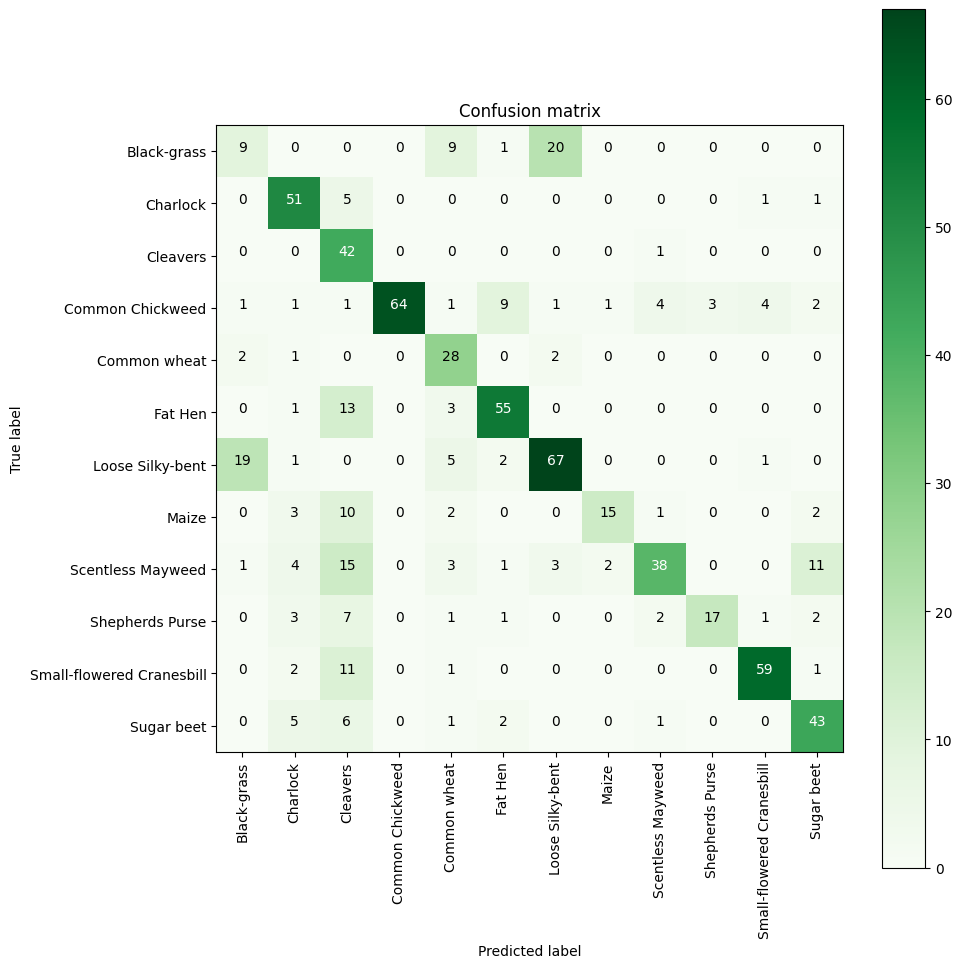

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (your index_to_label) ---
categ = list(index_to_label.values())   # Convert dictionary to a list of names

# --- Plotting the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Display model performance metrics ---
print("Accuracy: ", results_AP3_better[1])
print("Precision: ", results_AP3_better[2])
print("Recall: ", results_AP3_better[3])


## Model comparison - approach 3, no callbacks

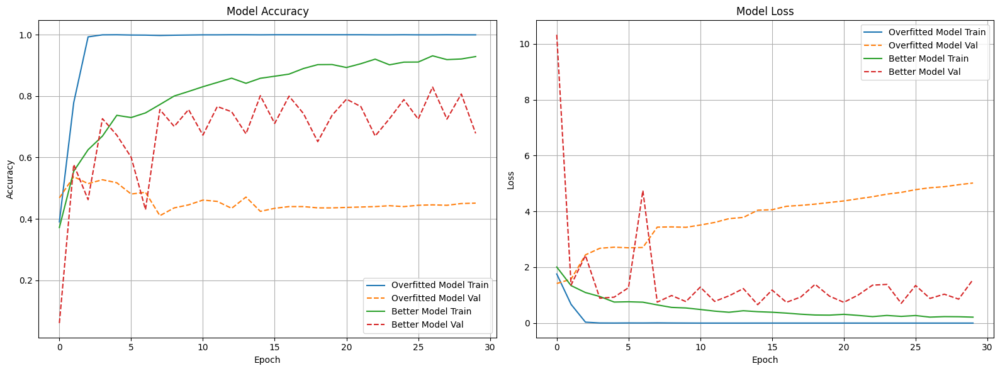

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Overfitted Model": history_AP3_overfitted.history if 'history_AP3_overfitted' in globals() else None,
    "Better Model": history_AP3_better.history if 'history_AP3_better' in globals() else None
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


## Running models with callbacks

In [ ]:
model = build_overfitted_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)

callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

history_AP3_overfitted_with_callbacks = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8,
    callbacks = callbacks
)

Epoch 1/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - accuracy: 0.3328 - loss: 2.0731 - precision: 0.5414 - recall: 0.1399 - val_accuracy: 0.6587 - val_loss: 1.0378 - val_precision: 0.7389 - val_recall: 0.5388 - learning_rate: 0.0010
Epoch 2/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - accuracy: 0.7727 - loss: 0.6901 - precision: 0.8336 - recall: 0.6968 - val_accuracy: 0.6389 - val_loss: 1.1302 - val_precision: 0.6729 - val_recall: 0.5599 - learning_rate: 0.0010
Epoch 3/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - accuracy: 0.9831 - loss: 0.0811 - precision: 0.9876 - recall: 0.9821 - val_accuracy: 0.6474 - val_loss: 1.6190 - val_precision: 0.6677 - val_recall: 0.6234 - learning_rate: 0.0010
Epoch 4/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - accuracy: 0.9995 - loss: 0.0056 - precision: 0.9995 - recall: 0.9995 - val_accuracy: 0.6657 - val_loss: 1.5377 - val_precision: 0.6979 - val_recall: 0.6516 - learning_rate: 5.0000e-04
Epoch 5/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/ste

In [ ]:
results_AP3_overfitted_with_callbacks = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6465 - loss: 1.0219 - precision: 0.7750 - recall: 0.5330


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
Accuracy:  0.6502115726470947
Precision:  0.7681451439857483
Recall:  0.5373765826225281


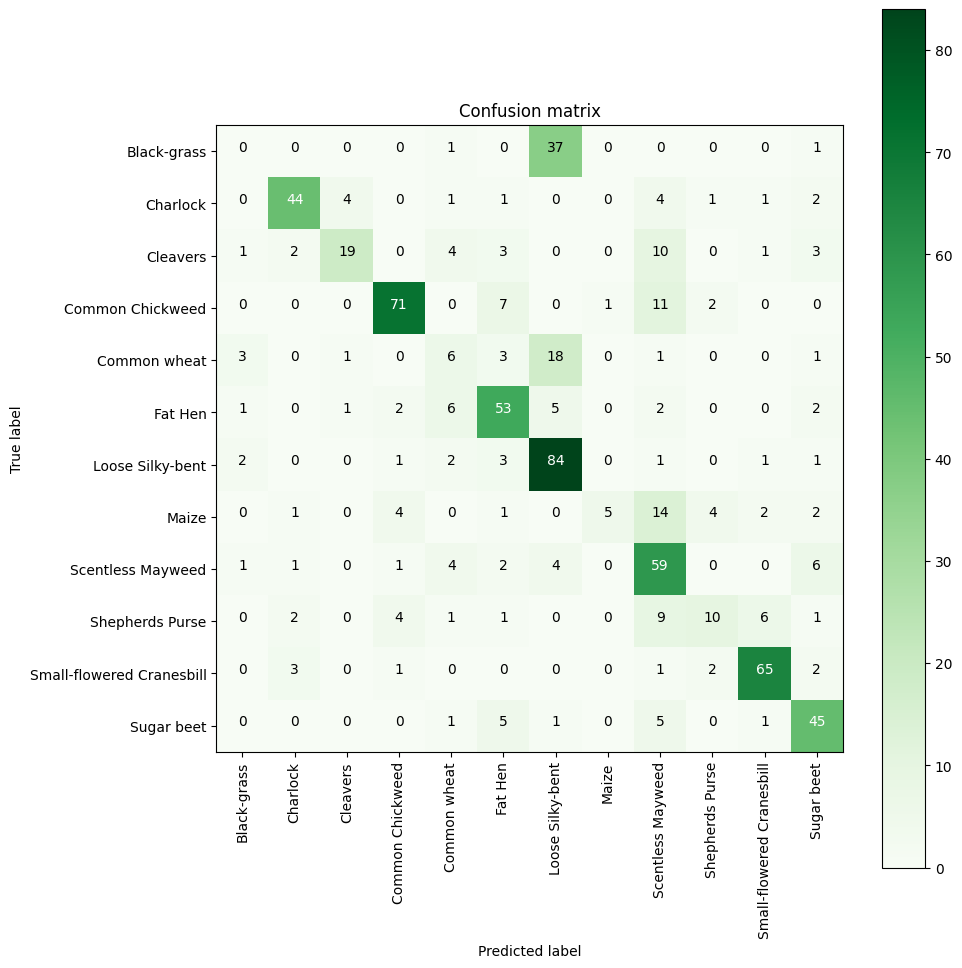

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (from your index_to_label dictionary) ---
categ = list(index_to_label.values())   # Convert dict to a list of class names

# --- Plot the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Print performance metrics ---
print("Accuracy: ", results_AP3_overfitted_with_callbacks[1])
print("Precision: ", results_AP3_overfitted_with_callbacks[2])
print("Recall: ", results_AP3_overfitted_with_callbacks[3])


In [ ]:
model = build_best_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)

callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

history_AP3_better_with_callbacks = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8,
    shuffle = True,
    callbacks = callbacks
    )


Epoch 1/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - accuracy: 0.3019 - loss: 2.3647 - precision: 0.4237 - recall: 0.1985 - val_accuracy: 0.0874 - val_loss: 6.7576 - val_precision: 0.0877 - val_recall: 0.0874 - learning_rate: 0.0010
Epoch 2/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5528 - loss: 1.3492 - precision: 0.6543 - recall: 0.4264 - val_accuracy: 0.6305 - val_loss: 1.2002 - val_precision: 0.6804 - val_recall: 0.5825 - learning_rate: 0.0010
Epoch 3/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.6270 - loss: 1.1231 - precision: 0.7165 - recall: 0.5169 - val_accuracy: 0.6671 - val_loss: 0.9903 - val_precision: 0.7527 - val_recall: 0.5924 - learning_rate: 0.0010
Epoch 4/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.6753 - loss: 0.9783 - precision: 0.7553 - recall: 0.5893 - val_accuracy: 0.6601 - val_loss: 0.9816 - val_precision: 0.7461 - val_recall: 0.6093 - learning_rate: 0.0010
Epoch 5/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy

In [ ]:
results_AP3_better_with_callbacks = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.8279 - loss: 0.5307 - precision: 0.8439 - recall: 0.8181


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step
Accuracy:  0.8406205773353577
Precision:  0.8554744720458984
Recall:  0.8265162110328674


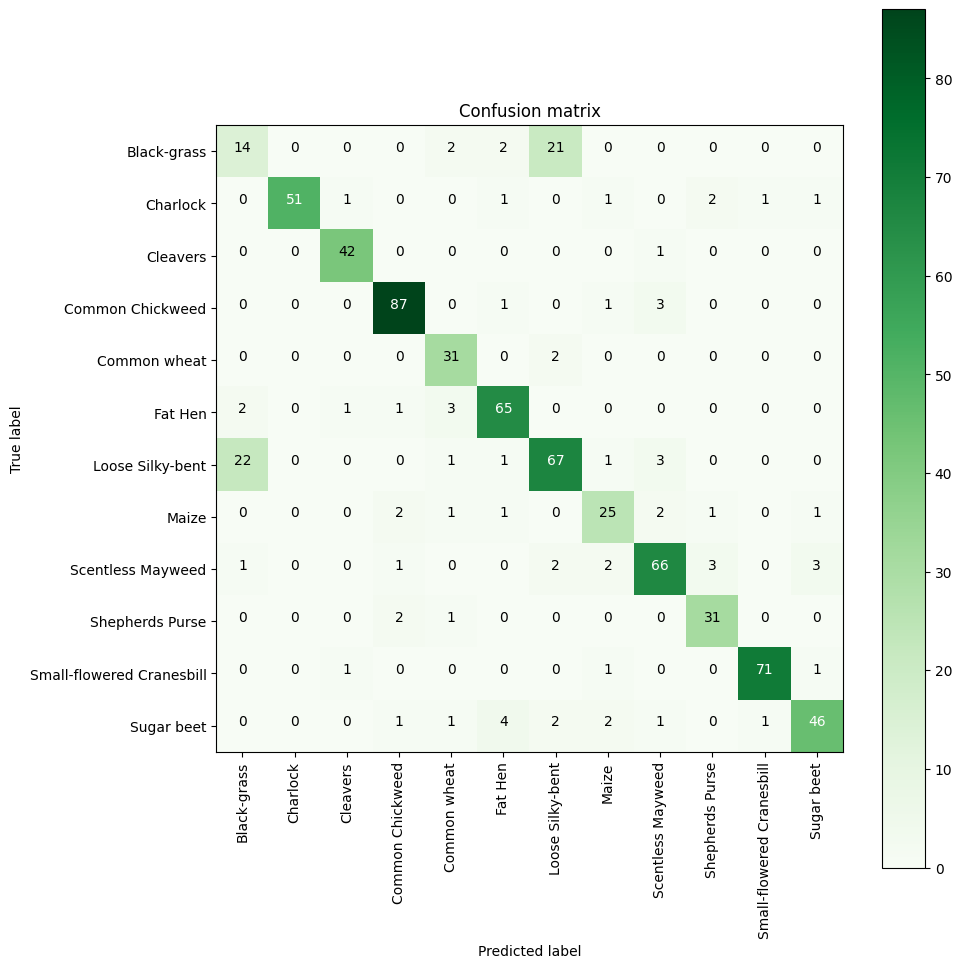

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion Matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (your index_to_label) ---
categ = list(index_to_label.values())   # Convert dict to list of class names

# --- Plotting the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Displaying evaluation metrics ---
print("Accuracy: ", results_AP3_better_with_callbacks[1])
print("Precision: ", results_AP3_better_with_callbacks[2])
print("Recall: ", results_AP3_better_with_callbacks[3])


## Model comparison - approach 3, with callbacks

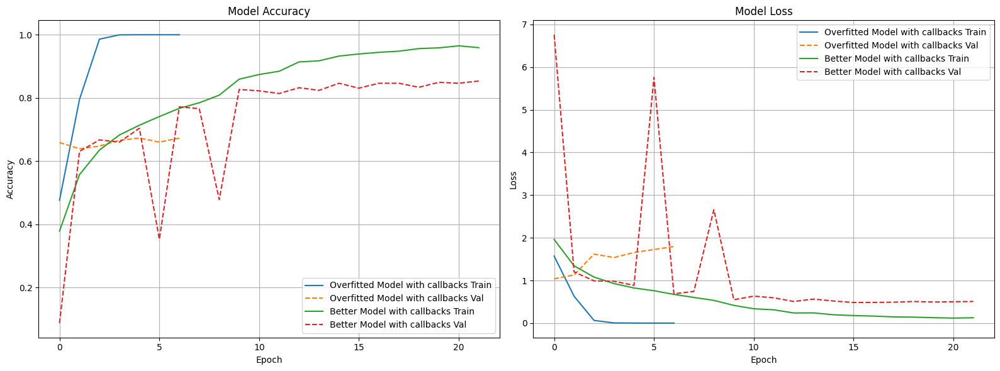

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Overfitted Model with callbacks": history_AP3_overfitted_with_callbacks.history if 'history_AP3_overfitted_with_callbacks' in globals() else None,
    "Better Model with callbacks": history_AP3_better_with_callbacks.history if 'history_AP3_better_with_callbacks' in globals() else None
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


## Adding data-augmentation and running models with it

In [ ]:
# Build the best model (architecture stays the same – data will be augmented)
model = build_overfitted_model()  # you don't need a separate "build_augmented_best_model"

# Compile the model with optimizer, loss function and metrics
model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall()]
)

# Define callbacks for learning rate adjustment and early stopping
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

# Create data generator with real-time augmentation
train_gen = get_augmented_generator(X_train_cleaned, y_train, batch_size=8)

# Train the model using the generator
history_AP3_overfitted_augmented = model.fit(
    train_gen,                                    # training data with augmentation
    validation_data=(X_val_cleaned, y_val),       # static validation set
    epochs=30,
    shuffle=True,
    callbacks=callbacks
)


Epoch 1/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - accuracy: 0.2078 - loss: 2.3874 - precision_19: 0.2729 - recall_19: 0.0225 - val_accuracy: 0.5346 - val_loss: 1.3819 - val_precision_19: 0.7468 - val_recall_19: 0.3286 - learning_rate: 0.0010
Epoch 2/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - accuracy: 0.5306 - loss: 1.3799 - precision_19: 0.6944 - recall_19: 0.3317 - val_accuracy: 0.6728 - val_loss: 1.0277 - val_precision_19: 0.7725 - val_recall_19: 0.4838 - learning_rate: 0.0010
Epoch 3/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - accuracy: 0.6537 - loss: 1.0487 - precision_19: 0.7552 - recall_19: 0.5111 - val_accuracy: 0.7151 - val_loss: 0.9110 - val_precision_19: 0.7784 - val_recall_19: 0.6192 - learning_rate: 0.0010
Epoch 4/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - accuracy: 0.6963 - loss: 0.9296 - precision_19: 0.7882 - recall_19: 0.5989 - val_accuracy: 0.7250 - val_loss: 0.8397 - val_precision_19: 0.7762 - val_recall_19: 0.6361 - learning_rate: 0.0010
Epoch 5/

In [ ]:
results_AP3_overfitted_augmented = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8379 - loss: 0.5666 - precision_19: 0.8570 - recall_19: 0.8184


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
Accuracy:  0.8476727604866028
Precision:  0.872592568397522
Recall:  0.8307475447654724


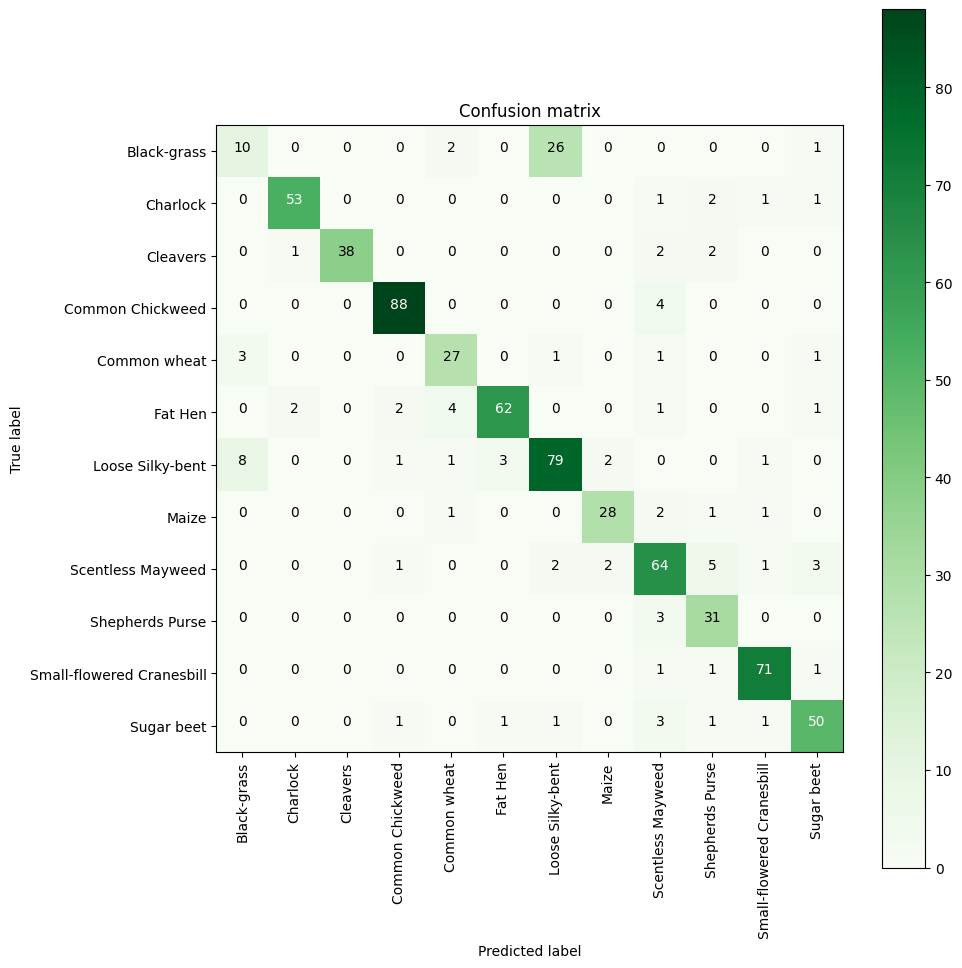

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Get predicted class indices
trueY = np.argmax(y_test, axis=1)         # Get true class indices

# --- Compute the confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class labels (from your index_to_label dictionary) ---
categ = list(index_to_label.values())   # Convert dict to a list of class names

# --- Plot the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Display evaluation metrics ---
print("Accuracy: ", results_AP3_overfitted_augmented[1])
print("Precision: ", results_AP3_overfitted_augmented[2])
print("Recall: ", results_AP3_overfitted_augmented[3])


In [ ]:
# Build the best model (architecture stays the same – data will be augmented)
model = build_best_model()  # you don't need a separate "build_augmented_best_model"

# Compile the model with optimizer, loss function and metrics
model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall()]
)

# Define callbacks for learning rate adjustment and early stopping
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

# Create data generator with real-time augmentation
train_gen = get_augmented_generator(X_train_cleaned, y_train, batch_size=8)

# Train the model using the generator
history_AP3_better_augmented = model.fit(
    train_gen,                                    # training data with augmentation
    validation_data=(X_val_cleaned, y_val),       # static validation set
    epochs=30,
    shuffle=True,
    callbacks=callbacks
)


Epoch 1/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - accuracy: 0.3167 - loss: 2.2918 - precision_20: 0.4153 - recall_20: 0.1927 - val_accuracy: 0.0649 - val_loss: 5.3131 - val_precision_20: 0.0677 - val_recall_20: 0.0635 - learning_rate: 0.0010
Epoch 2/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - accuracy: 0.5140 - loss: 1.4818 - precision_20: 0.6246 - recall_20: 0.3849 - val_accuracy: 0.4415 - val_loss: 2.1011 - val_precision_20: 0.4949 - val_recall_20: 0.4090 - learning_rate: 0.0010
Epoch 3/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - accuracy: 0.5515 - loss: 1.3192 - precision_20: 0.6563 - recall_20: 0.4332 - val_accuracy: 0.3709 - val_loss: 3.8167 - val_precision_20: 0.3804 - val_recall_20: 0.3456 - learning_rate: 0.0010
Epoch 4/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step - accuracy: 0.6240 - loss: 1.0885 - precision_20: 0.7253 - recall_20: 0.5259 - val_accuracy: 0.5811 - val_loss: 1.1888 - val_precision_20: 0.6588 - val_recall_20: 0.5092 - learning_rate: 0.0010
Epoch 5/

In [ ]:
results_AP3_better_augmented = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8759 - loss: 0.3427 - precision_20: 0.8875 - recall_20: 0.8668


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step
Accuracy:  0.8801128268241882
Precision:  0.8942028880119324
Recall:  0.870239794254303


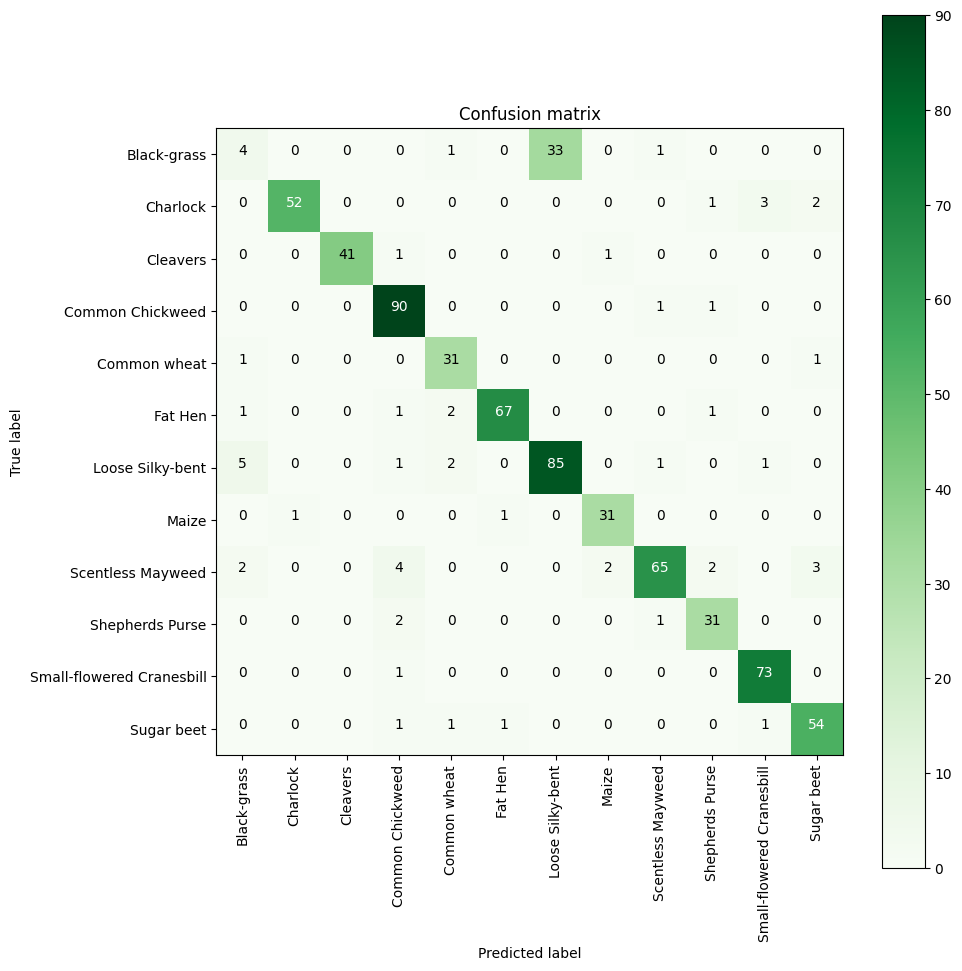

In [ ]:
# --- Function to plot the confusion matrix ---
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Greens):
    fig = plt.figure(figsize=(10, 10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    # Normalize the confusion matrix if requested
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    # Add text annotations for each cell
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, f'{cm[i, j]}',
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (from your index_to_label dictionary) ---
categ = list(index_to_label.values())   # Convert dictionary to a list of class names

# --- Plotting the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Display model performance metrics ---
print("Accuracy: ", results_AP3_better_augmented[1])
print("Precision: ", results_AP3_better_augmented[2])
print("Recall: ", results_AP3_better_augmented[3])


## Model comparison - approach 3, with callbacks and data augmentation

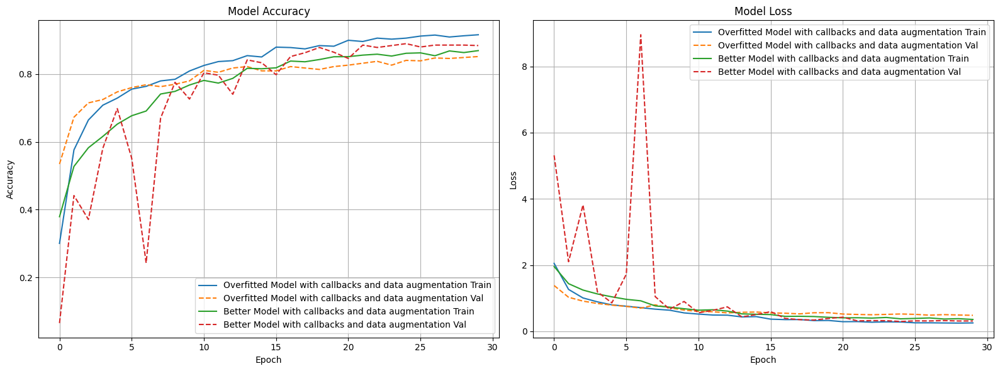

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Overfitted Model with callbacks and data augmentation": history_AP3_overfitted_augmented.history if 'history_AP3_overfitted_augmented' in globals() else None,
    "Better Model with callbacks and data augmentation": history_AP3_better_augmented.history if 'history_AP3_better_augmented' in globals() else None
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


## Running the pre-trained MobileNet model

In [ ]:
model = build_mobilenet_model(input_shape=ins, num_classes=12)

model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall()]
)

# Callbacks
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

# Augmented data generator
train_gen = get_augmented_generator(X_train_cleaned, y_train, batch_size=8)

# Train the model
history_AP3_mobilenet = model.fit(
    train_gen,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    callbacks=callbacks
)

Epoch 1/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 30s 52ms/step - accuracy: 0.3520 - loss: 2.1154 - precision_21: 0.5311 - recall_21: 0.1565 - val_accuracy: 0.5233 - val_loss: 1.3681 - val_precision_21: 0.7873 - val_recall_21: 0.2454 - learning_rate: 0.0010
Epoch 2/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - accuracy: 0.5720 - loss: 1.2205 - precision_21: 0.7299 - recall_21: 0.4093 - val_accuracy: 0.6460 - val_loss: 1.0462 - val_precision_21: 0.7694 - val_recall_21: 0.4471 - learning_rate: 0.0010
Epoch 3/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - accuracy: 0.6252 - loss: 1.0936 - precision_21: 0.7345 - recall_21: 0.4902 - val_accuracy: 0.5867 - val_loss: 1.1040 - val_precision_21: 0.7187 - val_recall_21: 0.4288 - learning_rate: 0.0010
Epoch 4/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - accuracy: 0.6454 - loss: 1.0000 - precision_21: 0.7535 - recall_21: 0.5279 - val_accuracy: 0.6544 - val_loss: 0.9793 - val_precision_21: 0.7307 - val_recall_21: 0.5472 - learning_rate: 0.0010
Epoch 5/

In [ ]:
results_AP3_mobilenet = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7757 - loss: 0.6574 - precision_21: 0.8322 - recall_21: 0.7196


## Results of pre-trained model

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Accuracy:  0.7672778367996216
Precision:  0.8232405781745911
Recall:  0.7094499468803406


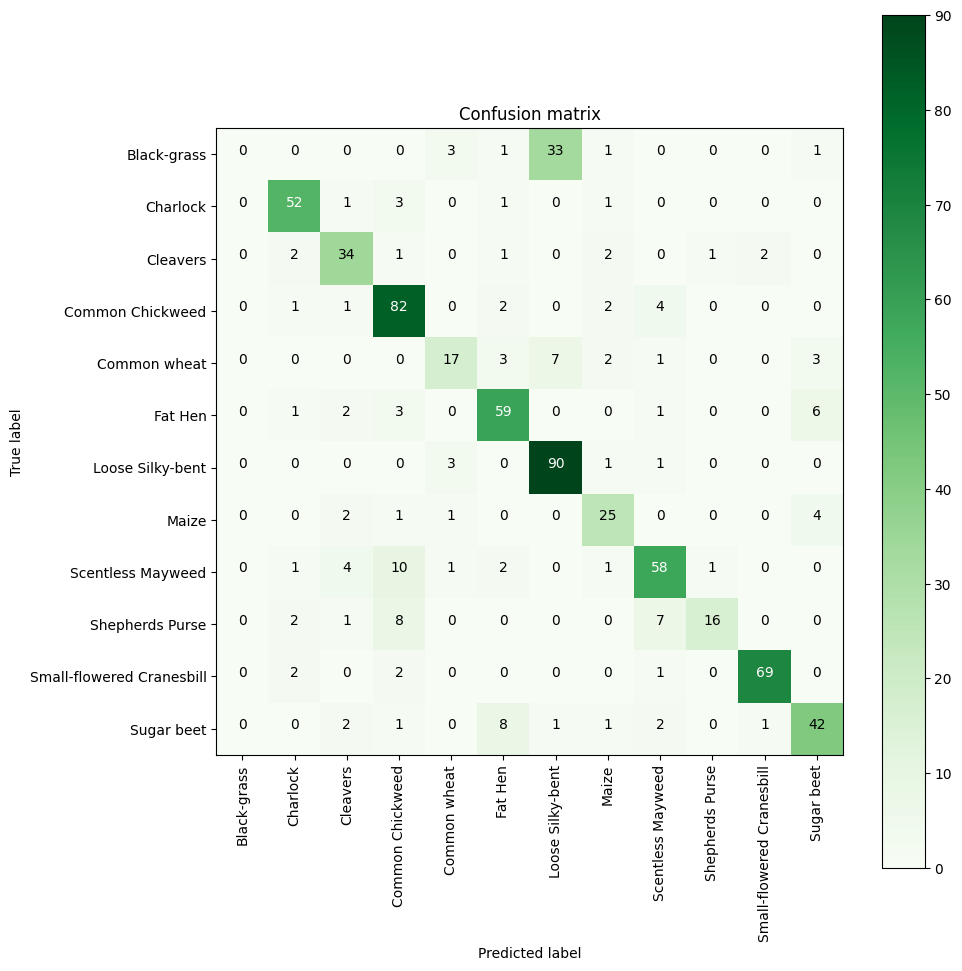

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class indices
trueY = np.argmax(y_test, axis=1)         # Extract true class indices

# --- Confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (from your index_to_label dictionary) ---
categ = list(index_to_label.values())   # Convert dictionary to list of class names

# --- Plot the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Print model performance metrics ---
print("Accuracy: ", results_AP3_mobilenet[1])
print("Precision: ", results_AP3_mobilenet[2])
print("Recall: ", results_AP3_mobilenet[3])


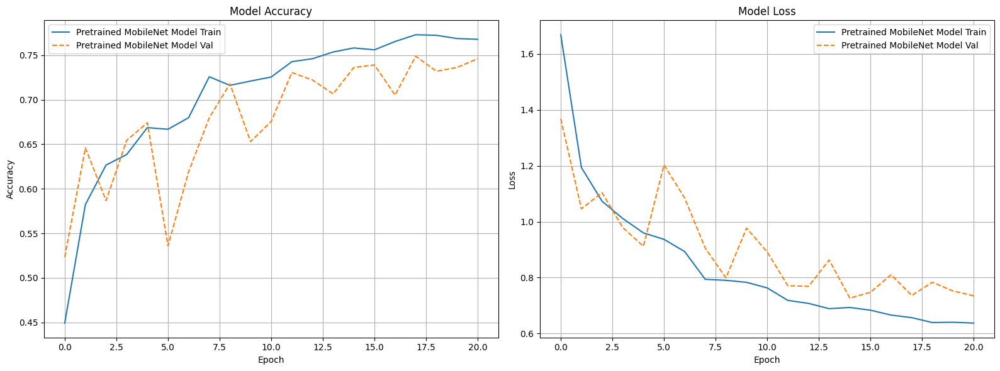

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Pretrained MobileNet Model": history_AP3_mobilenet.history if 'history_AP3_mobilenet' in globals() else None,
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


# Comparing results from different approaches

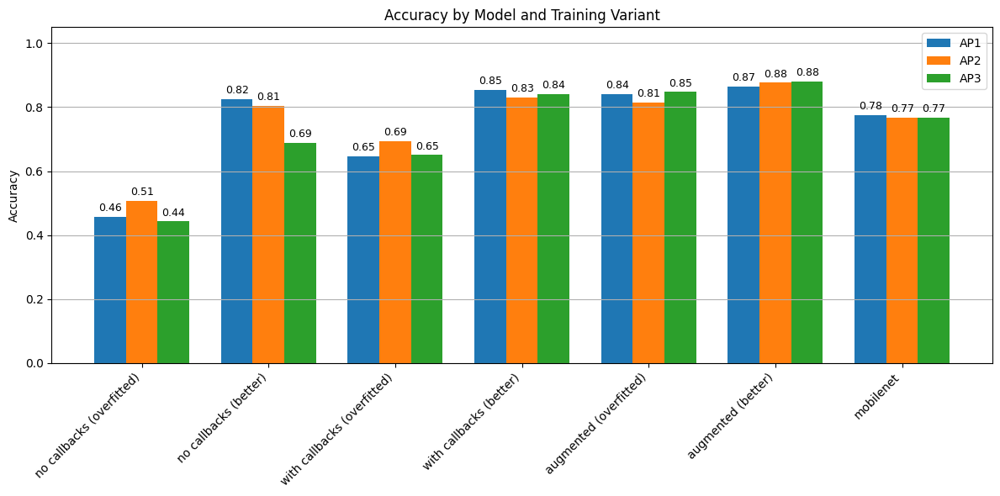

In [ ]:
labels = [
    'no callbacks (overfitted)',
    'no callbacks (better)',
    'with callbacks (overfitted)',
    'with callbacks (better)',
    'augmented (overfitted)',
    'augmented (better)',
    'mobilenet'
]
x = np.arange(len(labels))
width = 0.25

AP1_acc = [
    results_AP1_overfitted[1],
    results_AP1_better[1],
    results_AP1_overfitted_with_callbacks[1],
    results_AP1_better_with_callbacks[1],
    results_AP1_overfitted_augmented[1],
    results_AP1_better_augmented[1],
    results_AP1_mobilenet[1]
]

AP2_acc = [
    results_AP2_overfitted[1],
    results_AP2_better[1],
    results_AP2_overfitted_with_callbacks[1],
    results_AP2_better_with_callbacks[1],
    results_AP2_overfitted_augmented[1],
    results_AP2_better_augmented[1],
    results_AP2_mobilenet[1]
]

AP3_acc = [
    results_AP3_overfitted[1],
    results_AP3_better[1],
    results_AP3_overfitted_with_callbacks[1],
    results_AP3_better_with_callbacks[1],
    results_AP3_overfitted_augmented[1],
    results_AP3_better_augmented[1],
    results_AP3_mobilenet[1]
]

plt.figure(figsize=(12, 6))

bars1 = plt.bar(x - width, AP1_acc, width, label='AP1')
bars2 = plt.bar(x, AP2_acc, width, label='AP2')
bars3 = plt.bar(x + width, AP3_acc, width, label='AP3')

plt.ylabel('Accuracy')
plt.title('Accuracy by Model and Training Variant')
plt.xticks(x, labels, rotation=45, ha='right')
plt.ylim(0, 1.05)
plt.legend()
plt.grid(axis='y')
plt.tight_layout()

for bars in [bars1, bars2, bars3]:
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            height + 0.01,
            f'{height:.2f}',
            ha='center',
            va='bottom',
            fontsize=9
        )

plt.show()


After obtaining accuracy results for each model configuration across three different approaches (AP1, AP2, and AP3), we visualize the performance using a grouped bar chart. This allows for a clear comparison of model accuracy across various training variants, including configurations with and without callbacks, with augmentation, and using MobileNet. The goal is to identify both the best-performing model and the most effective training strategy. This graphical representation helps in evaluating which combination consistently yields the highest accuracy and is therefore the most suitable for deployment.

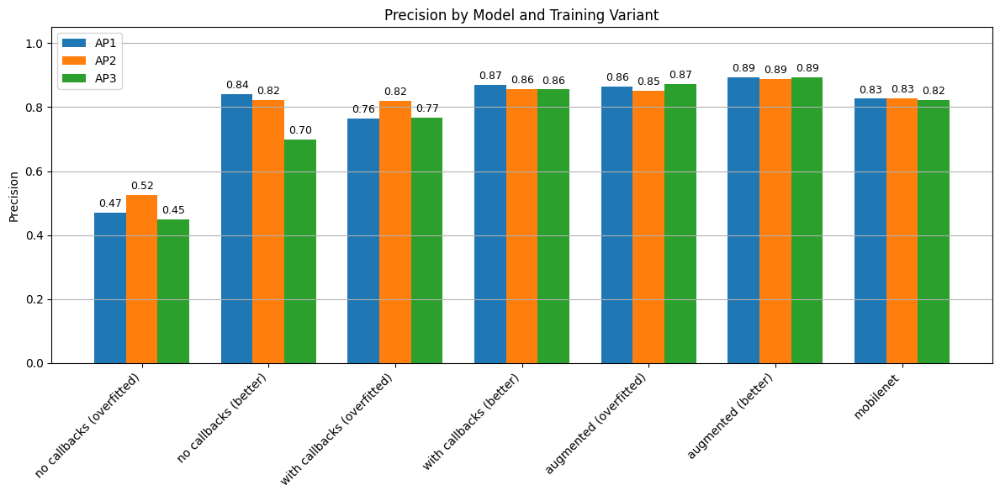

In [ ]:
AP1_prec = [
    results_AP1_overfitted[2],
    results_AP1_better[2],
    results_AP1_overfitted_with_callbacks[2],
    results_AP1_better_with_callbacks[2],
    results_AP1_overfitted_augmented[2],
    results_AP1_better_augmented[2],
    results_AP1_mobilenet[2]
]

AP2_prec = [
    results_AP2_overfitted[2],
    results_AP2_better[2],
    results_AP2_overfitted_with_callbacks[2],
    results_AP2_better_with_callbacks[2],
    results_AP2_overfitted_augmented[2],
    results_AP2_better_augmented[2],
    results_AP2_mobilenet[2]
]

AP3_prec = [
    results_AP3_overfitted[2],
    results_AP3_better[2],
    results_AP3_overfitted_with_callbacks[2],
    results_AP3_better_with_callbacks[2],
    results_AP3_overfitted_augmented[2],
    results_AP3_better_augmented[2],
    results_AP3_mobilenet[2]
]

plt.figure(figsize=(12, 6))

bars1 = plt.bar(x - width, AP1_prec, width, label='AP1')
bars2 = plt.bar(x, AP2_prec, width, label='AP2')
bars3 = plt.bar(x + width, AP3_prec, width, label='AP3')

plt.ylabel('Precision')
plt.title('Precision by Model and Training Variant')
plt.xticks(x, labels, rotation=45, ha='right')
plt.ylim(0, 1.05)
plt.legend()
plt.grid(axis='y')
plt.tight_layout()

for bars in [bars1, bars2, bars3]:
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            height + 0.01,
            f'{height:.2f}',
            ha='center',
            va='bottom',
            fontsize=9
        )

plt.show()


This cell performs the same analysis as the previous one, but focuses on the precision metric instead of accuracy. It presents a bar chart comparing the precision scores for each model variant across the three approaches (AP1, AP2, AP3). The goal is to evaluate which combination of model and training strategy yields the highest precision, allowing for a more detailed selection of the best-performing configuration, especially in cases where precision is a more relevant performance indicator than overall accuracy.

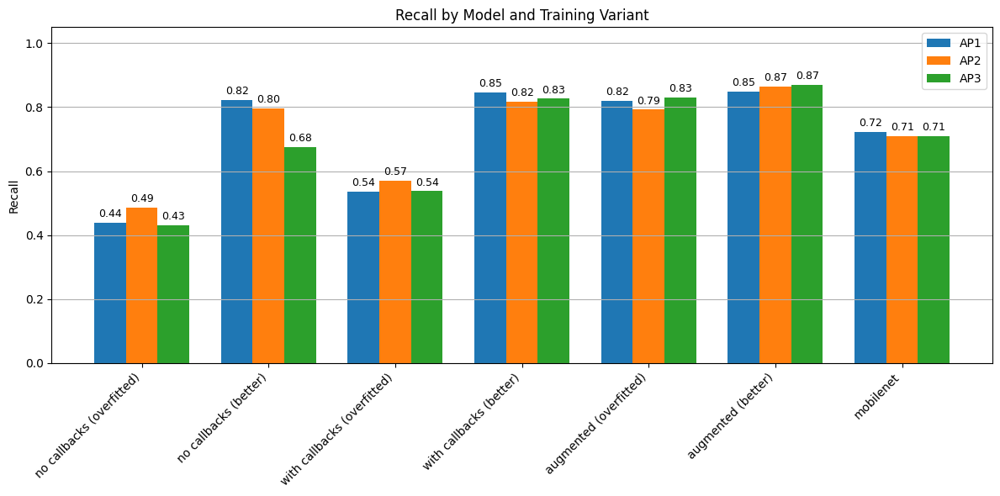

In [ ]:
AP1_rec = [
    results_AP1_overfitted[3],
    results_AP1_better[3],
    results_AP1_overfitted_with_callbacks[3],
    results_AP1_better_with_callbacks[3],
    results_AP1_overfitted_augmented[3],
    results_AP1_better_augmented[3],
    results_AP1_mobilenet[3]
]

AP2_rec = [
    results_AP2_overfitted[3],
    results_AP2_better[3],
    results_AP2_overfitted_with_callbacks[3],
    results_AP2_better_with_callbacks[3],
    results_AP2_overfitted_augmented[3],
    results_AP2_better_augmented[3],
    results_AP2_mobilenet[3]
]

AP3_rec = [
    results_AP3_overfitted[3],
    results_AP3_better[3],
    results_AP3_overfitted_with_callbacks[3],
    results_AP3_better_with_callbacks[3],
    results_AP3_overfitted_augmented[3],
    results_AP3_better_augmented[3],
    results_AP3_mobilenet[3]
]

plt.figure(figsize=(12, 6))

bars1 = plt.bar(x - width, AP1_rec, width, label='AP1')
bars2 = plt.bar(x, AP2_rec, width, label='AP2')
bars3 = plt.bar(x + width, AP3_rec, width, label='AP3')

plt.ylabel('Recall')
plt.title('Recall by Model and Training Variant')
plt.xticks(x, labels, rotation=45, ha='right')
plt.ylim(0, 1.05)
plt.legend()
plt.grid(axis='y')
plt.tight_layout()

for bars in [bars1, bars2, bars3]:
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            height + 0.01,
            f'{height:.2f}',
            ha='center',
            va='bottom',
            fontsize=9
        )

plt.show()


In this cell, we visualize the recall metric for each model and training configuration across all three approaches (AP1, AP2, AP3). The grouped bar chart allows for a direct comparison of recall values, helping to assess how well each model captures all relevant instances. This metric is particularly important in tasks where missing positive cases is costly. The purpose is to complement the previous analyses (accuracy and precision) and aid in selecting the configuration that offers the best balance between precision and recall, depending on the application’s needs.

In [ ]:
# Accuracy
acc_all = [
    AP1_acc,
    AP2_acc,
    AP3_acc
]
acc_max_value = -1
acc_max_model = ""
for i, model_scores in enumerate(acc_all):
    for j, val in enumerate(model_scores):
        if val > acc_max_value:
            acc_max_value = val
            acc_max_model = f"AP{i+1} - {labels[j]}"

# Precision
prec_all = [
    AP1_prec,
    AP2_prec,
    AP3_prec
]
prec_max_value = -1
prec_max_model = ""
for i, model_scores in enumerate(prec_all):
    for j, val in enumerate(model_scores):
        if val > prec_max_value:
            prec_max_value = val
            prec_max_model = f"AP{i+1} - {labels[j]}"

# Recall
rec_all = [
    AP1_rec,
    AP2_rec,
    AP3_rec
]
rec_max_value = -1
rec_max_model = ""
for i, model_scores in enumerate(rec_all):
    for j, val in enumerate(model_scores):
        if val > rec_max_value:
            rec_max_value = val
            rec_max_model = f"AP{i+1} - {labels[j]}"

print(" Best model metrics:")
print(f" Accuracy:  {acc_max_value:.4f} – {acc_max_model}")
print(f" Precision: {prec_max_value:.4f} – {prec_max_model}")
print(f" Recall:    {rec_max_value:.4f} – {rec_max_model}")


 Best model metrics:
 Accuracy:  0.8801 – AP3 - augmented (better)
 Precision: 0.8942 – AP3 - augmented (better)
 Recall:    0.8702 – AP3 - augmented (better)


The results clearly show that the overfitted model without callbacks performs the worst across all metrics, with accuracy, precision, and recall values mostly below 0.52. Introducing the improved architecture (“better” model - also called "best" in training section) significantly boosts performance, especially when combined with callbacks and data augmentation. The best results were achieved using the AP3 approach with the augmented (better) model, reaching 0.8801 accuracy, 0.8942 precision, and 0.8702 recall. This confirms that applying regularization techniques and data augmentation leads to a more robust and generalizable model.

# Testing architectural variations based on the better model structure

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Dense, Flatten, MaxPooling2D, AveragePooling2D, Dropout, BatchNormalization, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd

# Data augmentation generator (your settings)
def get_augmented_generator(X_train, y_train, batch_size=8):
    datagen = ImageDataGenerator(
        rotation_range=10,
        width_shift_range=0.05,
        height_shift_range=0.05,
        zoom_range=0.05,
        horizontal_flip=True,
        fill_mode='nearest'
    )
    return datagen.flow(X_train, y_train, batch_size=batch_size, shuffle=True)

# Callbacks (your configuration)
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

# Generic CNN model with 3 convolutional blocks – to match the best model
def build_test_model(input_shape, num_classes=12,
                     filters=[32, 64, 64],
                     kernel_size=(3, 3),
                     strides=(1, 1),
                     padding='same',
                     pooling='max'):
    model = Sequential()
    model.add(Input(shape=input_shape))

    for i in range(3):  # 3 convolutional blocks
        f = filters[i % len(filters)]
        model.add(Conv2D(f, kernel_size=kernel_size, strides=strides, activation='relu', padding=padding))
        model.add(BatchNormalization())

        if pooling == 'max':
            model.add(MaxPooling2D(pool_size=(2, 2), strides=2))
        elif pooling == 'avg':
            model.add(AveragePooling2D(pool_size=(2, 2), strides=2))
        # no pooling -> skip

    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(num_classes, activation='softmax'))
    return model

# List of configurations to test
test_configs = [
    {'filters': [32, 64, 64], 'kernel_size': (3, 3), 'strides': (1, 1), 'padding': 'same', 'pooling': 'max'},
    {'filters': [32, 64, 64], 'kernel_size': (3, 3), 'strides': (2, 2), 'padding': 'same', 'pooling': 'max'},
    {'filters': [32, 64, 64], 'kernel_size': (5, 5), 'strides': (1, 1), 'padding': 'valid', 'pooling': 'avg'},
    {'filters': [16, 32, 32], 'kernel_size': (3, 3), 'strides': (1, 1), 'padding': 'same', 'pooling': None},
    {'filters': [64, 128, 128], 'kernel_size': (3, 3), 'strides': (1, 1), 'padding': 'same', 'pooling': 'max'},
]

# Train generator using data augmentation
train_gen = get_augmented_generator(X_train_cleaned, y_train, batch_size=8)

results = []

# Train each test model with the corresponding configuration
for idx, config in enumerate(test_configs):
    print(f"\n Training test model {idx+1}/{len(test_configs)} with config: {config}")

    model = build_test_model(
        input_shape=ins,
        num_classes=12,
        filters=config['filters'],
        kernel_size=config['kernel_size'],
        strides=config['strides'],
        padding=config['padding'],
        pooling=config['pooling']
    )

    model.compile(
        optimizer=Adam(learning_rate=0.001),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    history = model.fit(
        train_gen,
        validation_data=(X_val_cleaned, y_val),
        epochs=30,
        shuffle=True,
        callbacks=callbacks,
        verbose=0
    )

    val_acc = history.history['val_accuracy'][-1]
    val_loss = history.history['val_loss'][-1]

    results.append({
        'Model': f'Test {idx+1}',
        'Filters': config['filters'],
        'Kernel_Size': config['kernel_size'],
        'Strides': config['strides'],
        'Padding': config['padding'],
        'Pooling': config['pooling'] if config['pooling'] else 'None',
        'Val_Accuracy': round(val_acc, 4),
        'Val_Loss': round(val_loss, 4)
    })

# Train the best model – reference for comparison
print("\n Training BEST model (reference baseline)")

def build_best_model(input_shape=(ins[0], ins[1], ins[2]), num_classes=12):
    model = Sequential()
    model.add(Conv2D(32, (3, 3), input_shape=input_shape, activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2))

    model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2))

    model.add(Conv2D(64, (3, 3), activation='relu', padding='valid'))  # Third block with 'valid' padding
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2))

    model.add(Flatten())
    model.add(BatchNormalization())
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(0.2))
    model.add(BatchNormalization())
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(num_classes, activation='softmax'))
    return model

best_model = build_best_model()

best_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history_best = best_model.fit(
    train_gen,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    shuffle=True,
    callbacks=callbacks,
    verbose=0
)

val_acc = history_best.history['val_accuracy'][-1]
val_loss = history_best.history['val_loss'][-1]

# Add best model to results for comparison
results.append({
    'Model': 'Best model',
    'Filters': [32, 64, 64],
    'Kernel_Size': [(3, 3), (3, 3), (3, 3)],
    'Strides': 'default',
    'Padding': ['same', 'same', 'valid'],
    'Pooling': 'max (all blocks)',
    'Val_Accuracy': round(val_acc, 4),
    'Val_Loss': round(val_loss, 4)
})

# Display final results in a DataFrame
df_results = pd.DataFrame(results)




 Training test model 1/5 with config: {'filters': [32, 64, 64], 'kernel_size': (3, 3), 'strides': (1, 1), 'padding': 'same', 'pooling': 'max'}

 Training test model 2/5 with config: {'filters': [32, 64, 64], 'kernel_size': (3, 3), 'strides': (2, 2), 'padding': 'same', 'pooling': 'max'}

 Training test model 3/5 with config: {'filters': [32, 64, 64], 'kernel_size': (5, 5), 'strides': (1, 1), 'padding': 'valid', 'pooling': 'avg'}

 Training test model 4/5 with config: {'filters': [16, 32, 32], 'kernel_size': (3, 3), 'strides': (1, 1), 'padding': 'same', 'pooling': None}

 Training test model 5/5 with config: {'filters': [64, 128, 128], 'kernel_size': (3, 3), 'strides': (1, 1), 'padding': 'same', 'pooling': 'max'}

 Training BEST model (reference baseline)


In this cell, several variations of the better model architecture are tested to evaluate whether alternative combinations of key structural parameters—such as the number of filters, kernel size, strides, padding type, and pooling method—can lead to improved performance. These tests are conducted within the AP3 approach, which previously achieved the best results across all evaluation metrics. To ensure a fair and consistent comparison, all training settings remain identical to those used earlier: the same data augmentation strategy, the same callbacks (ReduceLROnPlateau and EarlyStopping), and the same training parameters (optimizer, loss function, number of epochs, and batch size). This setup allows us to isolate the effect of architectural changes and determine whether any of the tested models outperform the previously used augmented (better) model.

In [ ]:
df_results

,Model,Filters,Kernel_Size,Strides,Padding,Pooling,Val_Accuracy,Val_Loss
0,Test 1,"[32, 64, 64]","(3, 3)","(1, 1)",same,max,0.8575,0.4667
1,Test 2,"[32, 64, 64]","(3, 3)","(2, 2)",same,max,0.8632,0.4048
2,Test 3,"[32, 64, 64]","(5, 5)","(1, 1)",valid,avg,0.8942,0.4083
3,Test 4,"[16, 32, 32]","(3, 3)","(1, 1)",same,None,0.1340,2.4176
4,Test 5,"[64, 128, 128]","(3, 3)","(1, 1)",same,max,0.8590,0.4776
5,Best model,"[32, 64, 64]","[(3, 3), (3, 3), (3, 3)]",default,"[same, same, valid]",max (all blocks),0.8759,0.3777


Based on the results shown in the table, the Best model - the model from the earlier analysis - is selected as the final model. Although Test 3 achieved a slightly higher validation accuracy (0.8942 vs. 0.8759), it also had a higher validation loss (0.4083 vs. 0.3777), indicating less stable predictions. In contrast, the Best model offers both high accuracy and the lowest validation loss, which suggests better generalization and overall reliability. Therefore, it is considered the most robust and balanced choice among all tested configurations.

# Best and worst case scenarios for the best model

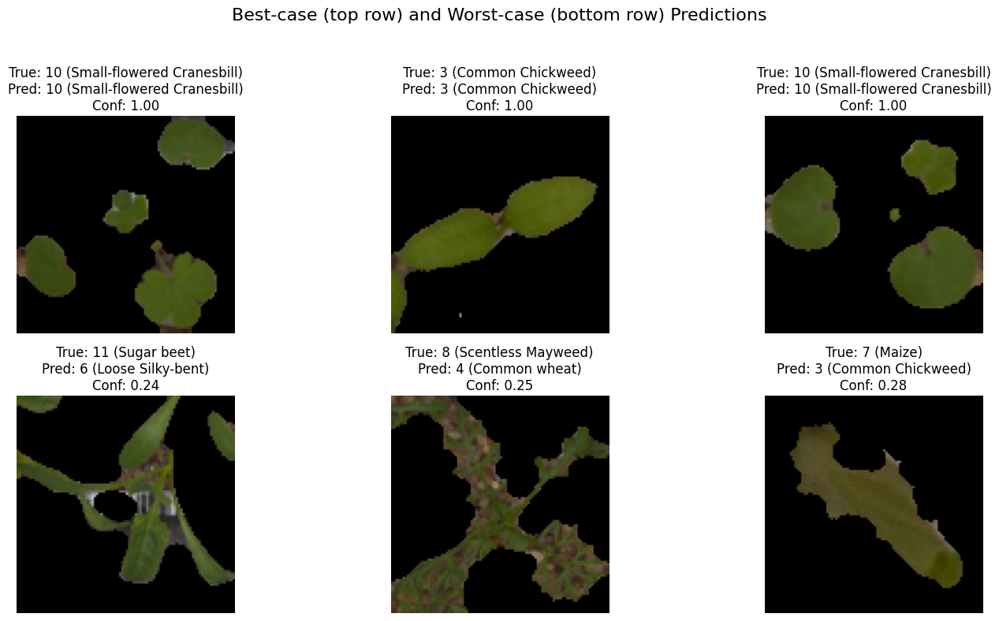

In [ ]:
def show_examples_grid(X, trueY, predY, conf, best_idxs, worst_idxs, index_to_label):
    fig, axes = plt.subplots(2, 3, figsize=(15, 8))
    fig.suptitle("Best-case (top row) and Worst-case (bottom row) Predictions", fontsize=16)

    # Top row: best-case
    for i, ax in enumerate(axes[0]):
        idx = correct_indices[best_idxs[i]]
        true_class = trueY[idx]
        pred_class = predY[idx]
        ax.imshow(X[idx])
        ax.set_title(
            f"True: {true_class} ({index_to_label[true_class]})\n"
            f"Pred: {pred_class} ({index_to_label[pred_class]})\n"
            f"Conf: {conf[idx]:.2f}"
        )
        ax.axis('off')

    # Bottom row: worst-case
    for i, ax in enumerate(axes[1]):
        idx = incorrect_indices[worst_idxs[i]]
        true_class = trueY[idx]
        pred_class = predY[idx]
        ax.imshow(X[idx])
        ax.set_title(
            f"True: {true_class} ({index_to_label[true_class]})\n"
            f"Pred: {pred_class} ({index_to_label[pred_class]})\n"
            f"Conf: {conf[idx]:.2f}"
        )
        ax.axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


show_examples_grid(
    X_test_cleaned,
    trueY,
    predYClasses,
    confidences,
    best_indices,
    worst_indices,
    index_to_label
)


In [ ]:
# Probability of the predicted class
confidences = np.max(predY, axis=1)
correct = predYClasses == trueY

# Indices for best-case and worst-case predictions
best_indices = np.argsort(-confidences[correct])[:3]
worst_indices = np.argsort(confidences[~correct])[:3]

# Mapping back to original X_test indices
correct_indices = np.where(correct)[0]
incorrect_indices = np.where(~correct)[0]

print("=== Best-case examples ===")
for i in best_indices:
    idx = correct_indices[i]
    print(f"Index: {idx}, True: {trueY[idx]}, Pred: {predYClasses[idx]}, Conf: {confidences[idx]:.4f}")

print("\n=== Worst-case examples ===")
for i in worst_indices:
    idx = incorrect_indices[i]
    print(f"Index: {idx}, True: {trueY[idx]}, Pred: {predYClasses[idx]}, Conf: {confidences[idx]:.4f}")


=== Best-case examples ===
Index: 403, True: 10, Pred: 10, Conf: 0.9999
Index: 299, True: 3, Pred: 3, Conf: 0.9998
Index: 418, True: 10, Pred: 10, Conf: 0.9998

=== Worst-case examples ===
Index: 327, True: 11, Pred: 6, Conf: 0.2352
Index: 379, True: 8, Pred: 4, Conf: 0.2487
Index: 325, True: 7, Pred: 3, Conf: 0.2806


## Qualitative Evaluation – Best- and Worst-case Predictions

Since the best-performing model has already been identified, we now present a qualitative evaluation by visualizing its **best-case** and **worst-case predictions**. The top row of the figure below displays the three test images for which the model made **perfect predictions with the highest confidence**. The bottom row shows the three samples where the model performed **the worst**, misclassifying them with **very low confidence scores**.

---

### **Best-case predictions (top row)**

These images show examples where the model correctly identified the plant species with **100% confidence**:

1. **Small-flowered Cranesbill** – predicted correctly with clear, well-defined leaf shapes.
2. **Common Chickweed** – accurate prediction likely due to the distinct leaf form and texture.
3. **Small-flowered Cranesbill** (again) – similar structure and visual clarity as the first.

In these cases, the model had no ambiguity, probably because the images are clean, centered, and feature **visually distinctive patterns or leaf morphology** that the model has clearly learned during training.

---

### **Worst-case predictions (bottom row)**

In contrast, the bottom row illustrates three samples that the model misclassified with **very low confidence** (0.24–0.28):

1. **Sugar beet** misclassified as **Loose Silky-bent**  
   → Possibly due to overlapping or distorted leaves and low contrast, which might resemble grasses in the training set.

2. **Scentless Mayweed** misclassified as **Common wheat**  
   → This prediction is likely confused due to **leaf damage or unusual coloration**, making it less recognizable.

3. **Maize** misclassified as **Common Chickweed**  
   → Despite being structurally different, poor visibility or unusual pose could have led the model to confuse it with a visually simpler species.

---

#### **Conclusion**

These examples illustrate how the model performs under optimal and challenging conditions. High-confidence, correct predictions usually come from **well-formed, clean, and typical examples**, while low-confidence errors are often associated with **occlusions, leaf damage, poor lighting, or visual similarity between species**. This analysis provides valuable insight into the model's behavior beyond standard performance metrics.


# Visualizing Feature Maps from the Last Convolutional Layer

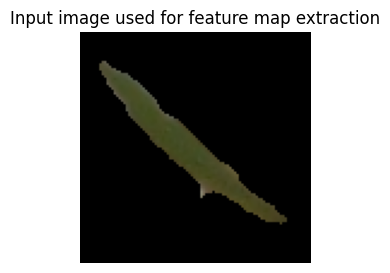

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


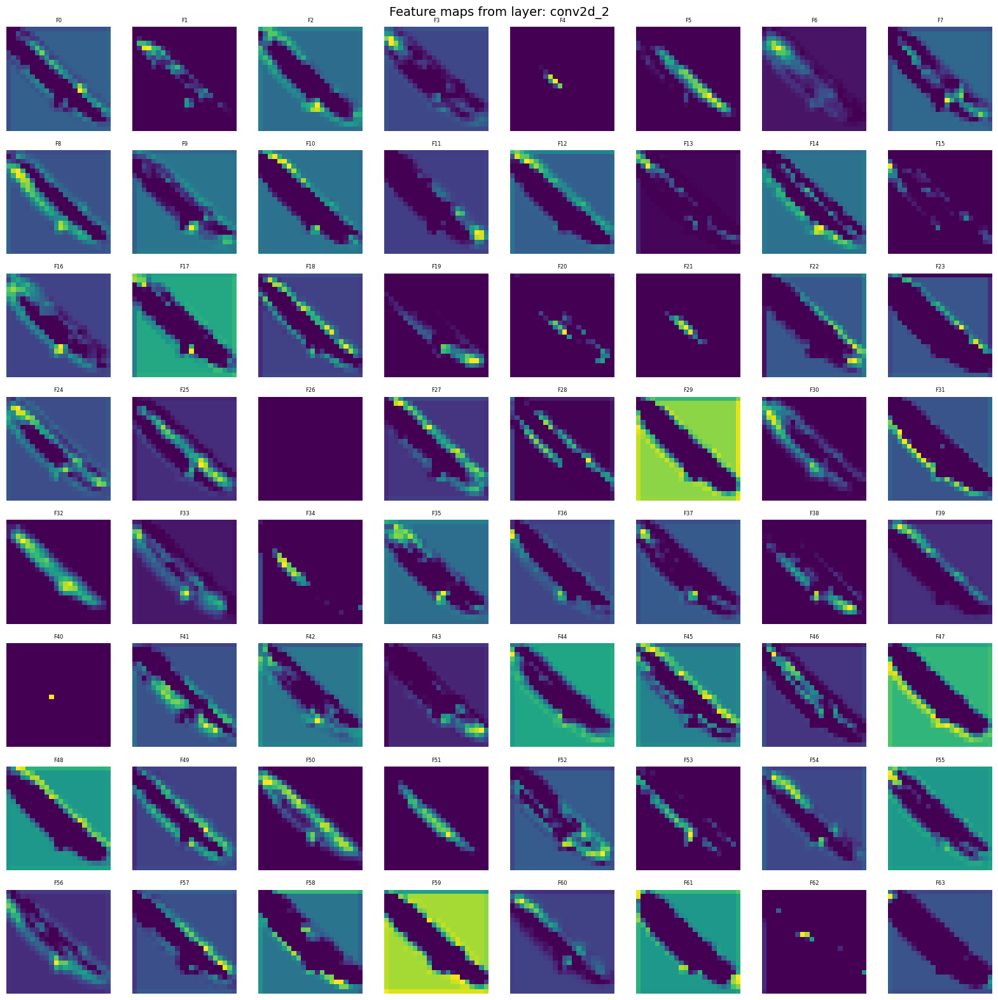

In [ ]:
# --- Step 1: Select and display an input image ---
sample_img = X_test_cleaned[0]  # Make sure this is preprocessed like training data
sample_img_exp = np.expand_dims(sample_img, axis=0)  # Add batch dimension

plt.figure(figsize=(3, 3))
plt.imshow(sample_img)
plt.axis("off")
plt.title("Input image used for feature map extraction")
plt.show()

# --- Step 2: Build a model to extract outputs of Conv2D layers ---
x = Input(shape=sample_img.shape)
out = x
layer_outputs = []
layer_names = []

for layer in best_model.layers:
    out = layer(out)
    if isinstance(layer, Conv2D):
        layer_outputs.append(out)
        layer_names.append(layer.name)

# Choose the last Conv2D layer
target_layer_index = -1  # Can change to other indexes for different layers
activation_model = Model(inputs=x, outputs=layer_outputs[target_layer_index])

# Get feature maps
activation = activation_model.predict(sample_img_exp)

# --- Step 3: Display feature maps dynamically ---
n_filters = activation.shape[-1]  # Actual number of filters in selected layer
n_cols = 8
n_rows = int(np.ceil(n_filters / n_cols))

plt.figure(figsize=(2 * n_cols, 2 * n_rows))

for i in range(n_filters):
    ax = plt.subplot(n_rows, n_cols, i + 1)
    plt.imshow(activation[0, :, :, i], cmap='viridis')
    plt.axis("off")
    ax.set_title(f"F{i}", fontsize=6)

plt.suptitle(f"Feature maps from layer: {layer_names[target_layer_index]}", fontsize=14)
plt.tight_layout()
plt.show()


In this section, we analyze how the final convolutional layer of the trained model interprets a given input image by visualizing its **feature maps** (also called activation maps).

The process consists of the following steps:

1. **Image Selection:**  
   A sample image from the cleaned test set (`X_test_cleaned`) is selected and displayed. This image is first expanded to include a batch dimension, which is required for prediction.

2. **Model Reconstruction for Feature Extraction:**  
   A new Keras model is dynamically built to replicate the structure of `best_model` but is configured to output the activations from a selected `Conv2D` layer — in this case, the **last convolutional layer**. During the loop, we store all Conv2D layer outputs and their names, allowing flexible selection.

3. **Activation Extraction and Visualization:**  
   The sample image is passed through this custom model to extract the activation maps from the target layer.  
   These maps show the output of each convolutional filter in that layer — revealing what **spatial features** the model focuses on (e.g., edges, shapes, textures).

   In the figure above, we display all filters' outputs (in this case, 64 feature maps) using an 8x8 grid layout and the `viridis` colormap for visual clarity. Each map corresponds to one filter, and brighter regions indicate stronger activation.

These feature maps provide valuable insight into the **intermediate representation** learned by the model. They help us understand **which parts of the input image contribute most** to the model’s internal decision-making process. In deeper layers (like the one shown here), the model typically focuses on more abstract and class-specific visual patterns.


# Best model configuration and visualization

In [ ]:
model.summary()

Model: "functional_165"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_21      │ (None, 96, 96, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 48, 48,    │        864 │ input_layer_21[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 48, 48,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 48, 48,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 48, 48,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 48, 48,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 48, 48,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 48, 48,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 48, 48,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 48, 48,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 48, 48,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 48, 48,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 49, 49,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 24, 24,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 24, 24,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 24, 24,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 24, 24,    │      2,304 │ block_1_depthwis

 Total params: 2,754,534 (10.51 MB)

 Trainable params: 165,516 (646.55 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

 Optimizer params: 331,034 (1.26 MB)

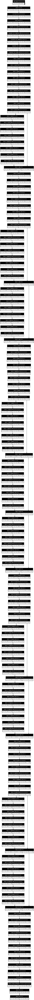

In [ ]:
plot_model(model, show_shapes=True, show_layer_names=True, to_file="model_AP3_better_augmented.png")



In this cell, we present the architecture of the best-performing model developed in the project — the AP3 *better + augmented* variant. The model was built according to the project’s design assumptions, featuring three convolutional blocks, regularization using `BatchNormalization` and `Dropout` layers, and a fully connected classifier at the end.

- First, we use `model.summary()` to provide a textual overview of the architecture, including the number of layers, trainable parameters, and output shapes.
- Then, using `plot_model(...)`, we generate a graphical representation of the model, which offers a more intuitive view of the data flow and structural layout of the network.


***
***
***

# Summary and Conclusions

This project focused on building and optimizing a convolutional neural network (CNN) for the classification of plant seedling images into 12 species. The process involved multiple stages of model design, data preprocessing, evaluation, and interpretation.

## Project Pipeline:

- **Data Cleaning and Preprocessing:**  
  We began by inspecting the dataset, identifying grayscale images, and cleaning the inputs. Three distinct **approaches** to preprocessing were tested:
  
  - **AP1**: Replacing grayscale images with their RGB versions from other sources.
  - **AP2**: Converting all images (including RGB) to grayscale for consistency.
  - **AP3**: Simply removing grayscale images from the dataset.

  Among these, **AP3 turned out to be the most effective**, as it avoided introducing noise from low-quality grayscale images and preserved color-rich RGB data. This led to more consistent and accurate training.

- **Model Development:**
  - The first model tested was a simple, intentionally **overfitted CNN** to establish a baseline.
  - A **better model architecture** was designed using three convolutional blocks, `BatchNormalization`, `MaxPooling`, `Dropout`, and two dense layers to improve regularization and learning stability.
  
- **Training Strategy Enhancements:**
  - We tested the impact of using **callbacks** (`EarlyStopping`, `ReduceLROnPlateau`) to reduce overfitting and adapt learning rate dynamically.
  - We applied **data augmentation** techniques (rotations, shifts, flips, zoom) to enrich the training set and improve generalization.

  - We compared the results of our model with **MobileNet model**, which is one of the best pre-trained model for low-resolution Images like in our dataset (96x96).

- **Comparison of Training Approaches:**
  - All models were trained and evaluated under each approach (AP1, AP2, AP3), and further variations were tested (e.g., with or without callbacks, with or without augmentation).
  - **AP3 with augmentation and callbacks consistently yielded the highest performance** across all evaluation metrics:
    - **Accuracy**: 0.8801  
    - **Precision**: 0.8942  
    - **Recall**: 0.8702

- **Ablation Study:**
  - We explored multiple architectural modifications (e.g., different kernel sizes, strides, filters, and pooling strategies) to test whether other configurations could outperform the best model.
  - While some variants achieved competitive accuracy, none surpassed the original AP3 better + augmented model in both accuracy and validation loss, confirming its robustness.

- **Qualitative Evaluation:**
  - We visualized the model's **best-case and worst-case predictions**, providing insights into which image characteristics contribute to confident or uncertain predictions.
  - Additionally, we extracted and displayed **feature maps** from the last convolutional layer to understand what visual patterns the model responds to.

---

## Conclusion:

The final selected model — **AP3 with the better architecture and data augmentation** — demonstrated superior classification performance and strong generalization. The decision to **remove grayscale images entirely (AP3)** proved to be a key factor in improving model consistency and accuracy. Combined with effective regularization and augmentation strategies, the model is well-suited for real-world tasks in plant seedling classification and provides a strong foundation for further development or deployment.
